## Random Forest Assignment
About the data: 

Let’s consider a Company dataset with around 10 variables and 400 records. 

The attributes are as follows: 

 Sales -- Unit sales (in thousands) at each location

 Competitor Price -- Price charged by competitor at each location

 Income -- Community income level (in thousands of dollars)

 Advertising -- Local advertising budget for company at each location (in thousands of dollars)

 Population -- Population size in region (in thousands)

 Price -- Price company charges for car seats at each site

 Shelf Location at stores -- A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site

 Age -- Average age of the local population

 Education -- Education level at each location

 Urban -- A factor with levels No and Yes to indicate whether the store is in an urban or rural location

 US -- A factor with levels No and Yes to indicate whether the store is in the US or not

The company dataset looks like this: 
 
## Problem Statement:

A cloth manufacturing company is interested to know about the segment or attributes causes high sale. 

Approach - A Random Forest can be built with target variable Sales (we will first convert it in categorical variable) & all other variable will be independent in the analysis.  


In [171]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import LabelEncoder#for encoding
from sklearn.model_selection import train_test_split#for train test splitting
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import plot_tree
from sklearn import tree

import warnings
warnings.filterwarnings('ignore')

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [136]:
data= pd.read_csv("Company_Data.csv")

In [137]:
data.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No


In [138]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [139]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Sales,400.0,7.496325,2.824115,0.0,5.39,7.49,9.32,16.27
CompPrice,400.0,124.975000,15.334512,77.0,115.00,125.00,135.00,175.00
Income,400.0,68.657500,27.986037,21.0,42.75,69.00,91.00,120.00
Advertising,400.0,6.635000,6.650364,0.0,0.00,5.00,12.00,29.00
Population,400.0,264.840000,147.376436,10.0,139.00,272.00,398.50,509.00
Price,400.0,115.795000,23.676664,24.0,100.00,117.00,131.00,191.00
Age,400.0,53.322500,16.200297,25.0,39.75,54.50,66.00,80.00
Education,400.0,13.900000,2.620528,10.0,12.00,14.00,16.00,18.00


In [140]:
data.duplicated().sum()

0

In [141]:
data.isnull().sum().any()

False

In [142]:
data.shape

(400, 11)

> No missing values and duplicate values

## Data Visualize

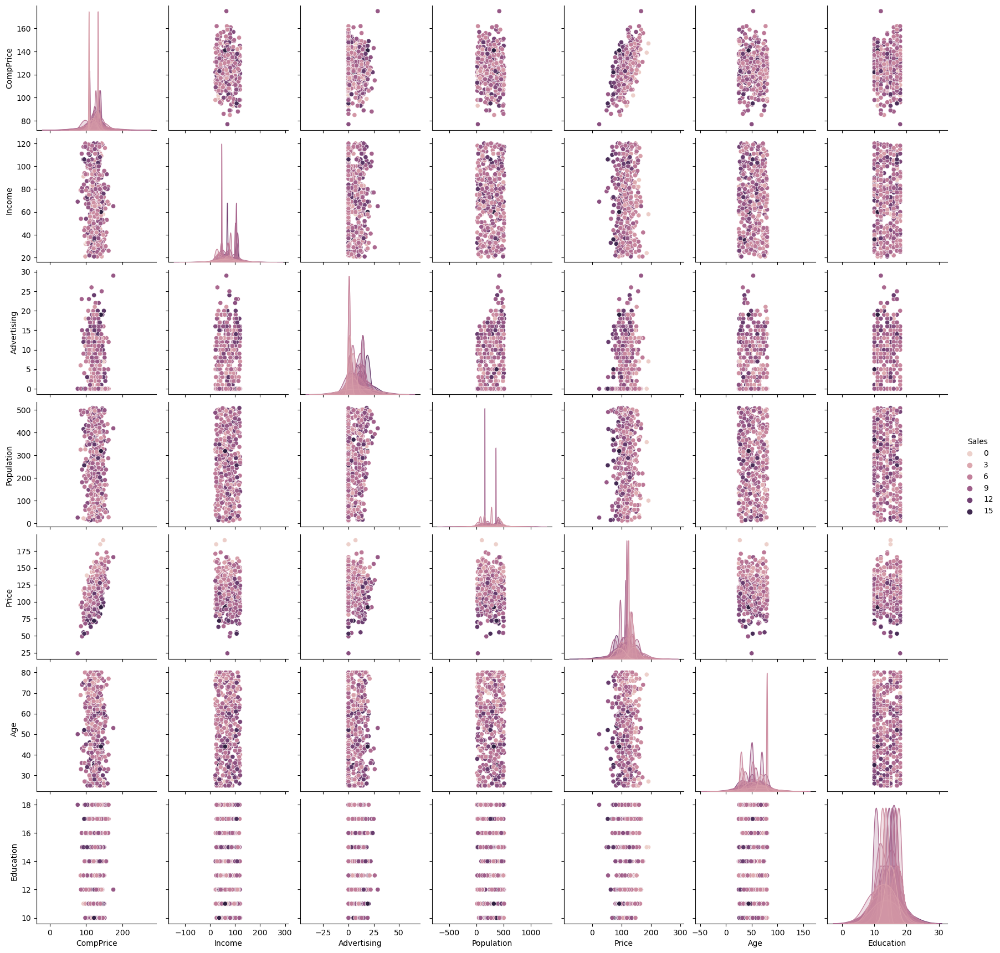

In [143]:
sns.pairplot(data=data, hue = 'Sales')

<AxesSubplot:>

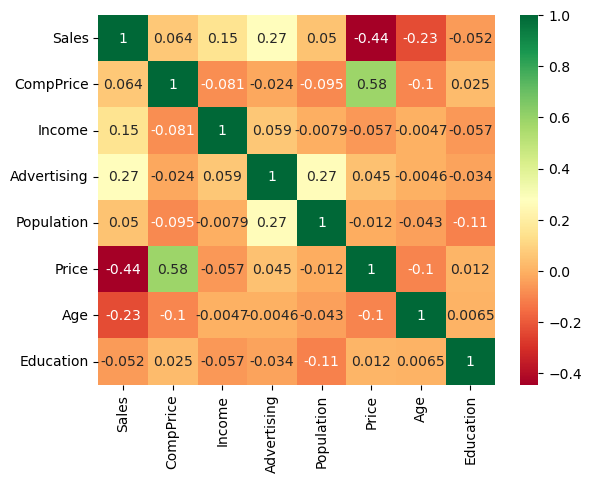

In [144]:
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn')

<AxesSubplot:>

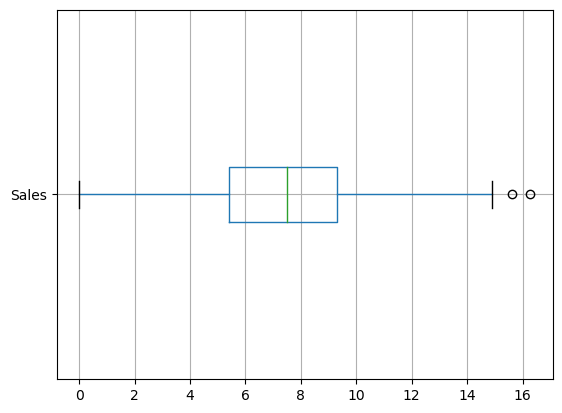

In [145]:
data.boxplot("Sales",vert=False)

<AxesSubplot:>

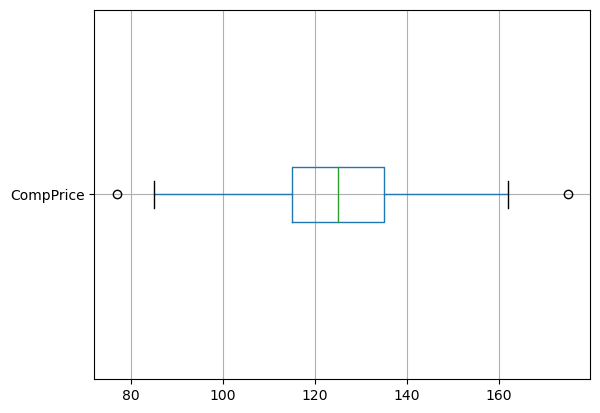

In [146]:
data.boxplot("CompPrice",vert=False)

<AxesSubplot:>

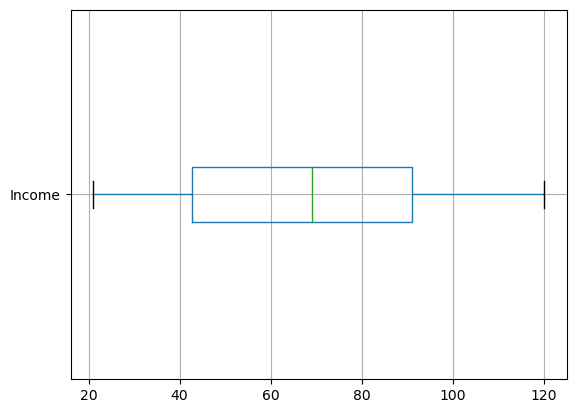

In [147]:
data.boxplot("Income",vert=False)

<AxesSubplot:>

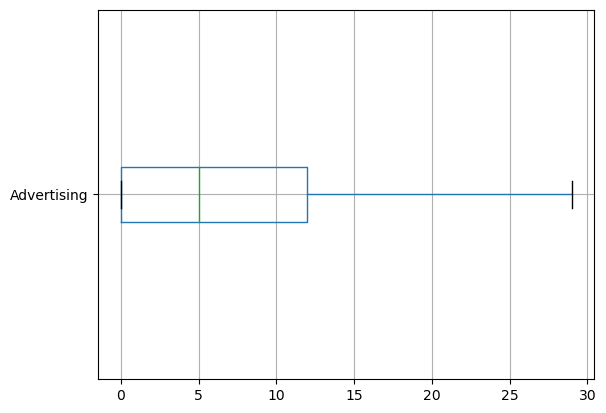

In [148]:
data.boxplot("Advertising",vert=False)

<AxesSubplot:>

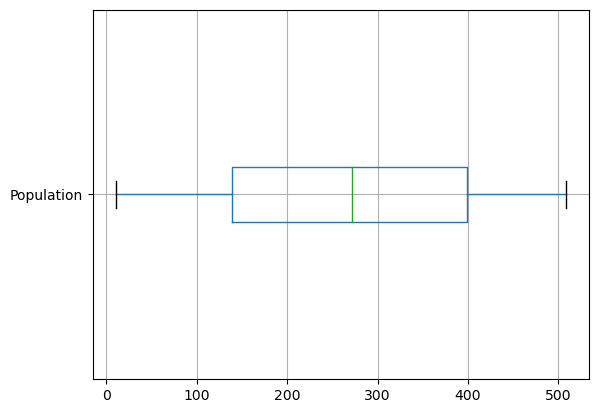

In [149]:
data.boxplot("Population",vert=False)

>> There is few outliners in sales and CompPrice

## Preprocessing Data

In [150]:
#Creating dummy vairables dropping first dummy variable
data =pd.get_dummies(data,columns=['Urban','US'] ,drop_first=True)

In [153]:
data.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,Bad,42,17,1,1
1,11.22,111,48,16,260,83,Good,65,10,1,1
2,10.06,113,35,10,269,80,Medium,59,12,1,1
3,7.40,117,100,4,466,97,Medium,55,14,1,1
4,4.15,141,64,3,340,128,Bad,38,13,1,0


In [154]:
le = LabelEncoder()
le.fit_transform(data['ShelveLoc'])

array([0, 1, 2, 2, 0, 0, 2, 1, 2, 2, 0, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1,
       2, 2, 0, 1, 1, 2, 0, 0, 1, 2, 1, 1, 2, 2, 1, 2, 2, 0, 0, 0, 2, 2,
       2, 0, 2, 0, 0, 1, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2,
       2, 2, 1, 2, 1, 2, 2, 1, 2, 0, 2, 2, 2, 0, 0, 1, 1, 0, 0, 2, 2, 1,
       2, 2, 2, 2, 2, 2, 0, 2, 1, 0, 1, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2,
       2, 2, 1, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 1, 1, 2, 1, 2, 0, 0, 2, 2,
       1, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 1, 2, 0, 1, 2, 2, 1, 1, 1, 2,
       2, 2, 1, 2, 1, 0, 2, 2, 2, 0, 2, 0, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2,
       2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 1, 2, 1, 2, 0, 0, 2,
       2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2, 1,
       2, 2, 2, 2, 2, 0, 1, 2, 0, 2, 0, 2, 1, 2, 1, 2, 2, 2, 1, 0, 2, 2,
       2, 2, 2, 1, 0, 0, 2, 0, 1, 0, 2, 2, 1, 0, 2, 2, 0, 0, 0, 2, 2, 2,
       1, 0, 1, 0, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 1, 2, 0, 1, 1, 2, 0, 2,
       2, 0, 2, 2, 2, 0, 1, 1, 1, 2, 1, 0, 1, 2, 2,

In [155]:
data_new= data.copy()

In [156]:
data_new['ShelveLoc'] = le.fit_transform(data['ShelveLoc'])
data_new.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,0,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,0,38,13,1,0


In [157]:
from sklearn.ensemble import IsolationForest
model_forest = IsolationForest(contamination=0.01)
model_forest.fit(data_new)

IsolationForest(contamination=0.01)

In [158]:
data_new['Anomaly']= model_forest.predict(data_new)

In [159]:
data_new[data_new['Anomaly'] == -1]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes,Anomaly
75,8.55,88,111,23,480,92,0,36,16,0,1,-1
165,0.37,147,58,7,100,191,0,27,15,1,1,-1
174,0.00,139,24,0,358,185,2,79,15,0,0,-1
310,9.53,175,65,29,419,166,2,53,12,1,1,-1


In [160]:
data_impro =data_new.drop(data_new.index[[42,57,310,367]],axis=0).reset_index(drop=True)
data_impro

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes,Anomaly
0,9.50,138,73,11,276,120,0,42,17,1,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1,1
4,4.15,141,64,3,340,128,0,38,13,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
391,12.57,138,108,17,203,128,1,33,14,1,1,1
392,6.14,139,23,3,37,120,2,55,11,0,1,1
393,7.41,162,26,12,368,159,2,40,18,1,1,1
394,5.94,100,79,7,284,95,0,50,12,1,1,1


## Split into X and Y

In [161]:
X = data_impro.iloc[:,1:11]
y = data_impro.iloc[:,0]

In [162]:
X.head()

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,138,73,11,276,120,0,42,17,1,1
1,111,48,16,260,83,1,65,10,1,1
2,113,35,10,269,80,2,59,12,1,1
3,117,100,4,466,97,2,55,14,1,1
4,141,64,3,340,128,0,38,13,1,0


In [163]:
y.head()

0     9.50
1    11.22
2    10.06
3     7.40
4     4.15
Name: Sales, dtype: float64

In [164]:
##Normalising the data as there is scale difference
def norm_func(i):
    x= (i-i.min())/(i.max()-i.min())
    return (x)

In [165]:
X = norm_func(X)
y= norm_func(y)

In [166]:
X.head()

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,0.688312,0.525253,0.423077,0.533066,0.500000,0.0,0.309091,0.875,1.0,1.0
1,0.337662,0.272727,0.615385,0.501002,0.239437,0.5,0.727273,0.000,1.0,1.0
2,0.363636,0.141414,0.384615,0.519038,0.218310,1.0,0.618182,0.250,1.0,1.0
3,0.415584,0.797980,0.153846,0.913828,0.338028,1.0,0.545455,0.500,1.0,1.0
4,0.727273,0.434343,0.115385,0.661323,0.556338,0.0,0.236364,0.375,1.0,0.0


In [167]:
y.head()

0    0.583897
1    0.689613
2    0.618316
3    0.454825
4    0.255071
Name: Sales, dtype: float64

In [168]:
# Splitting data into test data and train data

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [169]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((265, 10), (131, 10), (265,), (131,))

In [170]:
y_test

78     0.492317
277    0.210203
250    0.510756
55     0.732022
391    0.772588
         ...   
194    0.251998
366    0.472034
220    0.460356
371    0.485556
238    0.633682
Name: Sales, Length: 131, dtype: float64

## Hypertunning Of parameters

In [172]:
# Create the model
model = RandomForestRegressor() 

# Define the grid search parameters
tuned_paramerters= ({'n_estimators':[10,50,100,150,200],
                     'criterion':['squared_error','absolute_error','friedman_mse','poisson'],
                     'max_depth':range(2,20),
                     'max_leaf_nodes':range(2,20)}) 

param_grid = tuned_paramerters

# Build and fit the GridSearchCV
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)

In [48]:
grid_result= grid.fit(x_train,y_train)

Fitting 5 folds for each of 6480 candidates, totalling 32400 fits
[CV 1/5; 1/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10
[CV 1/5; 1/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10;, score=0.073 total time=   0.0s
[CV 2/5; 1/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10
[CV 2/5; 1/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10;, score=0.276 total time=   0.0s
[CV 3/5; 1/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10
[CV 3/5; 1/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10;, score=0.146 total time=   0.0s
[CV 4/5; 1/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10
[CV 4/5; 1/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=2, n_estimators=10;, score=0.155 total time=   0.0s
[CV 5/5; 1/6480] START criterion=squared_error, ma

[CV 4/5; 8/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=0.239 total time=   0.1s
[CV 5/5; 8/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 5/5; 8/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=0.269 total time=   0.1s
[CV 1/5; 9/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 1/5; 9/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.289 total time=   0.2s
[CV 2/5; 9/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 2/5; 9/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.407 total time=   0.1s
[CV 3/5; 9/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 9/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.272 

[CV 1/5; 17/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.321 total time=   0.0s
[CV 2/5; 17/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 17/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.424 total time=   0.0s
[CV 3/5; 17/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 17/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.325 total time=   0.0s
[CV 4/5; 17/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 17/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.258 total time=   0.0s
[CV 5/5; 17/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 17/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.291 

[CV 3/5; 24/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.298 total time=   0.1s
[CV 4/5; 24/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 24/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.251 total time=   0.2s
[CV 5/5; 24/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 24/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.280 total time=   0.2s
[CV 1/5; 25/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 25/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=200;, score=0.298 total time=   0.2s
[CV 2/5; 25/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 25/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=6, n_estimators=200;, sco

[CV 2/5; 32/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.430 total time=   0.0s
[CV 3/5; 32/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 32/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.306 total time=   0.0s
[CV 4/5; 32/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 32/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.238 total time=   0.0s
[CV 5/5; 32/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 32/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.234 total time=   0.0s
[CV 1/5; 33/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 33/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=8, n_estimators=100;, score=0.29

[CV 4/5; 39/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.266 total time=   0.2s
[CV 5/5; 39/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 39/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.259 total time=   0.2s
[CV 1/5; 40/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 40/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200;, score=0.301 total time=   0.2s
[CV 2/5; 40/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 40/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200;, score=0.428 total time=   0.2s
[CV 3/5; 40/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 40/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=9, n_estimators=200;, sco

[CV 1/5; 47/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.329 total time=   0.0s
[CV 2/5; 47/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 47/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.435 total time=   0.0s
[CV 3/5; 47/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 47/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.302 total time=   0.0s
[CV 4/5; 47/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 47/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.192 total time=   0.0s
[CV 5/5; 47/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 47/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, sco

[CV 4/5; 54/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.254 total time=   0.1s
[CV 5/5; 54/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 54/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.257 total time=   0.1s
[CV 1/5; 55/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 55/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=200;, score=0.297 total time=   0.2s
[CV 2/5; 55/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 55/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=200;, score=0.438 total time=   0.2s
[CV 3/5; 55/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 55/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=12, n_estimators=

[CV 1/5; 62/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.292 total time=   0.0s
[CV 2/5; 62/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 62/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.439 total time=   0.0s
[CV 3/5; 62/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 62/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.283 total time=   0.0s
[CV 4/5; 62/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 62/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.272 total time=   0.0s
[CV 5/5; 62/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 62/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, sco

[CV 3/5; 69/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.284 total time=   0.1s
[CV 4/5; 69/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 69/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.264 total time=   0.1s
[CV 5/5; 69/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 69/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.261 total time=   0.1s
[CV 1/5; 70/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 70/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=200;, score=0.308 total time=   0.3s
[CV 2/5; 70/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 70/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=15, n_estimators=

[CV 2/5; 77/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.432 total time=   0.0s
[CV 3/5; 77/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 77/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.286 total time=   0.0s
[CV 4/5; 77/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 77/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.243 total time=   0.0s
[CV 5/5; 77/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 77/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.256 total time=   0.0s
[CV 1/5; 78/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 78/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=17, n_estimators=100;, s

[CV 4/5; 84/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.231 total time=   0.2s
[CV 5/5; 84/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 84/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.265 total time=   0.1s
[CV 1/5; 85/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 85/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=200;, score=0.270 total time=   0.2s
[CV 2/5; 85/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 85/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=200;, score=0.428 total time=   0.2s
[CV 3/5; 85/6480] START criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 3/5; 85/6480] END criterion=squared_error, max_depth=2, max_leaf_nodes=18, n_estimators=

[CV 2/5; 92/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.307 total time=   0.0s
[CV 3/5; 92/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 92/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.165 total time=   0.0s
[CV 4/5; 92/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 92/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.126 total time=   0.0s
[CV 5/5; 92/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 92/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.086 total time=   0.0s
[CV 1/5; 93/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 93/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=2, n_estimators=100;, score=0.19

[CV 4/5; 99/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.239 total time=   0.1s
[CV 5/5; 99/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 99/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.268 total time=   0.1s
[CV 1/5; 100/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 100/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200;, score=0.282 total time=   0.2s
[CV 2/5; 100/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 100/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200;, score=0.412 total time=   0.2s
[CV 3/5; 100/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 100/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=3, n_estimators=200

[CV 1/5; 107/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.357 total time=   0.0s
[CV 2/5; 107/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 107/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.459 total time=   0.0s
[CV 3/5; 107/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 107/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.393 total time=   0.0s
[CV 4/5; 107/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 107/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.348 total time=   0.0s
[CV 5/5; 107/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 107/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, sco

[CV 3/5; 114/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.381 total time=   0.1s
[CV 4/5; 114/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 114/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.374 total time=   0.1s
[CV 5/5; 114/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 114/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.420 total time=   0.1s
[CV 1/5; 115/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 115/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=200;, score=0.370 total time=   0.2s
[CV 2/5; 115/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 115/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=6, n_estimators=

[CV 2/5; 122/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.470 total time=   0.0s
[CV 3/5; 122/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 122/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.391 total time=   0.0s
[CV 4/5; 122/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 122/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.411 total time=   0.0s
[CV 5/5; 122/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 122/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.400 total time=   0.0s
[CV 1/5; 123/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 123/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=8, n_estimators=100;, s

[CV 5/5; 129/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=150;, score=0.438 total time=   0.1s
[CV 1/5; 130/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 130/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200;, score=0.388 total time=   0.2s
[CV 2/5; 130/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 130/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200;, score=0.479 total time=   0.2s
[CV 3/5; 130/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 130/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200;, score=0.412 total time=   0.2s
[CV 4/5; 130/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=200
[CV 4/5; 130/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=9, n_estimators=

[CV 2/5; 137/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.471 total time=   0.0s
[CV 3/5; 137/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 137/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.407 total time=   0.0s
[CV 4/5; 137/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 137/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.386 total time=   0.0s
[CV 5/5; 137/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 137/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.432 total time=   0.0s
[CV 1/5; 138/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 138/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=11, n_estimator

[CV 4/5; 144/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.399 total time=   0.1s
[CV 5/5; 144/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 144/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.411 total time=   0.2s
[CV 1/5; 145/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 145/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=200;, score=0.360 total time=   0.2s
[CV 2/5; 145/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 145/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=200;, score=0.477 total time=   0.2s
[CV 3/5; 145/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 145/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=12, n_es

[CV 2/5; 152/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.477 total time=   0.0s
[CV 3/5; 152/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 152/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.415 total time=   0.0s
[CV 4/5; 152/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 152/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.387 total time=   0.0s
[CV 5/5; 152/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 152/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.428 total time=   0.0s
[CV 1/5; 153/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 153/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=14, n_estimator

[CV 3/5; 159/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.419 total time=   0.2s
[CV 4/5; 159/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 159/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.383 total time=   0.1s
[CV 5/5; 159/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 159/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.413 total time=   0.1s
[CV 1/5; 160/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 160/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=200;, score=0.386 total time=   0.2s
[CV 2/5; 160/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 160/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=15, n_es

[CV 2/5; 167/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.502 total time=   0.0s
[CV 3/5; 167/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 167/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.417 total time=   0.0s
[CV 4/5; 167/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 167/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.403 total time=   0.0s
[CV 5/5; 167/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 167/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.433 total time=   0.0s
[CV 1/5; 168/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 168/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=17, n_estimator

[CV 3/5; 174/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.406 total time=   0.1s
[CV 4/5; 174/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 174/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.380 total time=   0.1s
[CV 5/5; 174/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 174/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.404 total time=   0.1s
[CV 1/5; 175/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 175/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=200;, score=0.390 total time=   0.2s
[CV 2/5; 175/6480] START criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 175/6480] END criterion=squared_error, max_depth=3, max_leaf_nodes=18, n_es

[CV 2/5; 182/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.286 total time=   0.0s
[CV 3/5; 182/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 182/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.195 total time=   0.0s
[CV 4/5; 182/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 182/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.136 total time=   0.0s
[CV 5/5; 182/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 182/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.092 total time=   0.0s
[CV 1/5; 183/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 183/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=2, n_estimators=100;, s

[CV 4/5; 189/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.220 total time=   0.1s
[CV 5/5; 189/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 189/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.250 total time=   0.1s
[CV 1/5; 190/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 190/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=200;, score=0.283 total time=   0.2s
[CV 2/5; 190/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 190/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=200;, score=0.407 total time=   0.2s
[CV 3/5; 190/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 190/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=3, n_estimators=

[CV 2/5; 197/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.452 total time=   0.0s
[CV 3/5; 197/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 197/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.375 total time=   0.0s
[CV 4/5; 197/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 197/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.384 total time=   0.0s
[CV 5/5; 197/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 197/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.394 total time=   0.0s
[CV 1/5; 198/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 198/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 204/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.431 total time=   0.1s
[CV 5/5; 204/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 204/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.413 total time=   0.1s
[CV 1/5; 205/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 205/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=200;, score=0.418 total time=   0.2s
[CV 2/5; 205/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 205/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=200;, score=0.491 total time=   0.2s
[CV 3/5; 205/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 205/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=6, n_estimators=

[CV 2/5; 212/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.526 total time=   0.0s
[CV 3/5; 212/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 212/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.422 total time=   0.0s
[CV 4/5; 212/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 212/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.473 total time=   0.0s
[CV 5/5; 212/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 212/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.446 total time=   0.0s
[CV 1/5; 213/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 213/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 219/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.466 total time=   0.1s
[CV 5/5; 219/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 219/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.475 total time=   0.1s
[CV 1/5; 220/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 220/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=200;, score=0.436 total time=   0.2s
[CV 2/5; 220/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 220/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=200;, score=0.509 total time=   0.2s
[CV 3/5; 220/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 220/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=9, n_estimators=

[CV 2/5; 227/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.544 total time=   0.0s
[CV 3/5; 227/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 227/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.442 total time=   0.0s
[CV 4/5; 227/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 227/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.496 total time=   0.0s
[CV 5/5; 227/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 227/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.476 total time=   0.0s
[CV 1/5; 228/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 228/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=11, n_estimator

[CV 3/5; 234/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.440 total time=   0.2s
[CV 4/5; 234/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 234/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.501 total time=   0.2s
[CV 5/5; 234/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 234/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.507 total time=   0.1s
[CV 1/5; 235/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 235/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=200;, score=0.455 total time=   0.3s
[CV 2/5; 235/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 235/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=12, n_es

[CV 2/5; 242/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.516 total time=   0.0s
[CV 3/5; 242/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 242/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.434 total time=   0.0s
[CV 4/5; 242/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 242/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.481 total time=   0.0s
[CV 5/5; 242/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 242/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.515 total time=   0.0s
[CV 1/5; 243/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 243/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=14, n_estimator

[CV 3/5; 249/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.454 total time=   0.2s
[CV 4/5; 249/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 249/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.468 total time=   0.2s
[CV 5/5; 249/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 249/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.522 total time=   0.2s
[CV 1/5; 250/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 250/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=200;, score=0.433 total time=   0.3s
[CV 2/5; 250/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 250/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=15, n_es

[CV 2/5; 257/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.490 total time=   0.0s
[CV 3/5; 257/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 257/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.480 total time=   0.0s
[CV 4/5; 257/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 257/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.468 total time=   0.0s
[CV 5/5; 257/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 257/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.479 total time=   0.0s
[CV 1/5; 258/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 258/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=17, n_estimator

[CV 3/5; 264/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.464 total time=   0.2s
[CV 4/5; 264/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 264/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.494 total time=   0.2s
[CV 5/5; 264/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 264/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.524 total time=   0.2s
[CV 1/5; 265/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 265/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=200;, score=0.444 total time=   0.3s
[CV 2/5; 265/6480] START criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 265/6480] END criterion=squared_error, max_depth=4, max_leaf_nodes=18, n_es

[CV 2/5; 272/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.303 total time=   0.0s
[CV 3/5; 272/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 272/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.198 total time=   0.0s
[CV 4/5; 272/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 272/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.103 total time=   0.0s
[CV 5/5; 272/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 272/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.089 total time=   0.0s
[CV 1/5; 273/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 273/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=2, n_estimators=100;, s

[CV 5/5; 279/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=150;, score=0.277 total time=   0.2s
[CV 1/5; 280/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 280/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200;, score=0.284 total time=   0.2s
[CV 2/5; 280/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 280/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200;, score=0.420 total time=   0.2s
[CV 3/5; 280/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 280/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200;, score=0.270 total time=   0.2s
[CV 4/5; 280/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=200
[CV 4/5; 280/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=3, n_estimators=

[CV 2/5; 287/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.471 total time=   0.0s
[CV 3/5; 287/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 287/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.383 total time=   0.0s
[CV 4/5; 287/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 287/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.339 total time=   0.0s
[CV 5/5; 287/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 287/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.382 total time=   0.0s
[CV 1/5; 288/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 288/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 294/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.415 total time=   0.1s
[CV 5/5; 294/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 294/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.422 total time=   0.2s
[CV 1/5; 295/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 295/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=200;, score=0.392 total time=   0.2s
[CV 2/5; 295/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 295/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=200;, score=0.463 total time=   0.3s
[CV 3/5; 295/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 295/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=6, n_estimators=

[CV 2/5; 302/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.486 total time=   0.0s
[CV 3/5; 302/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 302/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.425 total time=   0.0s
[CV 4/5; 302/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 302/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.493 total time=   0.0s
[CV 5/5; 302/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 302/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.469 total time=   0.0s
[CV 1/5; 303/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 303/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 309/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.471 total time=   0.2s
[CV 5/5; 309/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 309/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.472 total time=   0.1s
[CV 1/5; 310/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 310/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=200;, score=0.474 total time=   0.2s
[CV 2/5; 310/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 310/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=200;, score=0.511 total time=   0.2s
[CV 3/5; 310/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 310/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=9, n_estimators=

[CV 2/5; 317/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.529 total time=   0.0s
[CV 3/5; 317/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 317/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.471 total time=   0.0s
[CV 4/5; 317/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 317/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.477 total time=   0.0s
[CV 5/5; 317/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 317/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.505 total time=   0.0s
[CV 1/5; 318/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 318/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=11, n_estimator

[CV 3/5; 324/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.481 total time=   0.2s
[CV 4/5; 324/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 324/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.487 total time=   0.2s
[CV 5/5; 324/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 324/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.502 total time=   0.2s
[CV 1/5; 325/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 325/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=200;, score=0.486 total time=   0.2s
[CV 2/5; 325/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 325/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=12, n_es

[CV 1/5; 332/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.487 total time=   0.0s
[CV 2/5; 332/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 332/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.551 total time=   0.0s
[CV 3/5; 332/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 332/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.476 total time=   0.0s
[CV 4/5; 332/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 332/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.474 total time=   0.0s
[CV 5/5; 332/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 332/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=14, n_estimators

[CV 2/5; 339/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.523 total time=   0.4s
[CV 3/5; 339/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 339/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.466 total time=   0.3s
[CV 4/5; 339/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 339/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.511 total time=   0.3s
[CV 5/5; 339/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 339/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.552 total time=   0.3s
[CV 1/5; 340/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 340/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=15, n_es

[CV 2/5; 347/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.591 total time=   0.0s
[CV 3/5; 347/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 347/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.479 total time=   0.0s
[CV 4/5; 347/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 347/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.519 total time=   0.0s
[CV 5/5; 347/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 347/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.568 total time=   0.0s
[CV 1/5; 348/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 348/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=17, n_estimator

[CV 3/5; 354/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.493 total time=   0.2s
[CV 4/5; 354/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 354/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.504 total time=   0.3s
[CV 5/5; 354/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 354/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.558 total time=   0.5s
[CV 1/5; 355/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 355/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=200;, score=0.478 total time=   0.5s
[CV 2/5; 355/6480] START criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 355/6480] END criterion=squared_error, max_depth=5, max_leaf_nodes=18, n_es

[CV 2/5; 362/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.256 total time=   0.0s
[CV 3/5; 362/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 362/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.195 total time=   0.0s
[CV 4/5; 362/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 362/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.141 total time=   0.0s
[CV 5/5; 362/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 362/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.078 total time=   0.0s
[CV 1/5; 363/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 363/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=2, n_estimators=100;, s

[CV 4/5; 369/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.249 total time=   0.4s
[CV 5/5; 369/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 369/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.274 total time=   0.3s
[CV 1/5; 370/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 370/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=200;, score=0.301 total time=   0.3s
[CV 2/5; 370/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 370/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=200;, score=0.407 total time=   0.2s
[CV 3/5; 370/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 370/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=3, n_estimators=

[CV 2/5; 377/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.454 total time=   0.0s
[CV 3/5; 377/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 377/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.396 total time=   0.0s
[CV 4/5; 377/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 377/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.397 total time=   0.0s
[CV 5/5; 377/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 377/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.370 total time=   0.0s
[CV 1/5; 378/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 378/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 384/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.397 total time=   0.7s
[CV 5/5; 384/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 384/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.429 total time=   0.6s
[CV 1/5; 385/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 385/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=200;, score=0.397 total time=   0.8s
[CV 2/5; 385/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 385/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=200;, score=0.487 total time=   0.5s
[CV 3/5; 385/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 385/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=6, n_estimators=

[CV 2/5; 392/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.482 total time=   0.0s
[CV 3/5; 392/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 392/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.468 total time=   0.0s
[CV 4/5; 392/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 392/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.431 total time=   0.0s
[CV 5/5; 392/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 392/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.461 total time=   0.0s
[CV 1/5; 393/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 393/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 399/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.471 total time=   0.3s
[CV 5/5; 399/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 399/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.488 total time=   0.3s
[CV 1/5; 400/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 400/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=200;, score=0.454 total time=   0.6s
[CV 2/5; 400/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 400/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=200;, score=0.518 total time=   0.6s
[CV 3/5; 400/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 400/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=9, n_estimators=

[CV 2/5; 407/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.496 total time=   0.0s
[CV 3/5; 407/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 407/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.461 total time=   0.0s
[CV 4/5; 407/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 407/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.549 total time=   0.0s
[CV 5/5; 407/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 407/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.507 total time=   0.0s
[CV 1/5; 408/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 408/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=11, n_estimator

[CV 3/5; 414/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.489 total time=   0.2s
[CV 4/5; 414/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 414/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.526 total time=   0.2s
[CV 5/5; 414/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 414/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.518 total time=   0.2s
[CV 1/5; 415/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 415/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=200;, score=0.471 total time=   0.4s
[CV 2/5; 415/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 415/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=12, n_es

[CV 2/5; 422/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.565 total time=   0.0s
[CV 3/5; 422/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 422/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.502 total time=   0.0s
[CV 4/5; 422/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 422/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.559 total time=   0.0s
[CV 5/5; 422/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 422/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.533 total time=   0.0s
[CV 1/5; 423/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 423/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=14, n_estimator

[CV 3/5; 429/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.489 total time=   0.2s
[CV 4/5; 429/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 429/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.525 total time=   0.2s
[CV 5/5; 429/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 429/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.540 total time=   0.2s
[CV 1/5; 430/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 430/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=200;, score=0.475 total time=   0.2s
[CV 2/5; 430/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 430/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=15, n_es

[CV 2/5; 437/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.576 total time=   0.0s
[CV 3/5; 437/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 437/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.490 total time=   0.0s
[CV 4/5; 437/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 437/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.498 total time=   0.0s
[CV 5/5; 437/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 437/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.525 total time=   0.0s
[CV 1/5; 438/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 438/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=17, n_estimator

[CV 3/5; 444/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.486 total time=   0.2s
[CV 4/5; 444/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 444/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.550 total time=   0.2s
[CV 5/5; 444/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 444/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.540 total time=   0.2s
[CV 1/5; 445/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 445/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=200;, score=0.489 total time=   0.2s
[CV 2/5; 445/6480] START criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 445/6480] END criterion=squared_error, max_depth=6, max_leaf_nodes=18, n_es

[CV 2/5; 452/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.287 total time=   0.0s
[CV 3/5; 452/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 452/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.179 total time=   0.0s
[CV 4/5; 452/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 452/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.112 total time=   0.0s
[CV 5/5; 452/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 452/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.083 total time=   0.0s
[CV 1/5; 453/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 453/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=2, n_estimators=100;, s

[CV 4/5; 459/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.244 total time=   0.1s
[CV 5/5; 459/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 459/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.245 total time=   0.1s
[CV 1/5; 460/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 460/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=200;, score=0.273 total time=   0.2s
[CV 2/5; 460/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 460/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=200;, score=0.405 total time=   0.2s
[CV 3/5; 460/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 460/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=3, n_estimators=

[CV 2/5; 467/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.414 total time=   0.0s
[CV 3/5; 467/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 467/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.346 total time=   0.0s
[CV 4/5; 467/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 467/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.416 total time=   0.0s
[CV 5/5; 467/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 467/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.375 total time=   0.0s
[CV 1/5; 468/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 468/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 474/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.416 total time=   0.1s
[CV 5/5; 474/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 474/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.418 total time=   0.1s
[CV 1/5; 475/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 475/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=200;, score=0.371 total time=   0.2s
[CV 2/5; 475/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 475/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=200;, score=0.478 total time=   0.2s
[CV 3/5; 475/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 475/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=6, n_estimators=

[CV 2/5; 482/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.486 total time=   0.0s
[CV 3/5; 482/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 482/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.438 total time=   0.0s
[CV 4/5; 482/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 482/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.488 total time=   0.0s
[CV 5/5; 482/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 482/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.433 total time=   0.0s
[CV 1/5; 483/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 483/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 489/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.474 total time=   0.1s
[CV 5/5; 489/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 489/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.473 total time=   0.2s
[CV 1/5; 490/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 490/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=200;, score=0.459 total time=   0.2s
[CV 2/5; 490/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 490/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=200;, score=0.521 total time=   0.2s
[CV 3/5; 490/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 490/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=9, n_estimators=

[CV 2/5; 497/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.514 total time=   0.0s
[CV 3/5; 497/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 497/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.458 total time=   0.0s
[CV 4/5; 497/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 497/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.504 total time=   0.0s
[CV 5/5; 497/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 497/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.462 total time=   0.0s
[CV 1/5; 498/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 498/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=11, n_estimator

[CV 3/5; 504/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.480 total time=   0.2s
[CV 4/5; 504/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 504/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.503 total time=   0.2s
[CV 5/5; 504/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 504/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.517 total time=   0.1s
[CV 1/5; 505/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 505/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=200;, score=0.479 total time=   0.2s
[CV 2/5; 505/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 505/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=12, n_es

[CV 2/5; 512/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.543 total time=   0.0s
[CV 3/5; 512/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 512/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.457 total time=   0.0s
[CV 4/5; 512/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 512/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.535 total time=   0.0s
[CV 5/5; 512/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 512/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.532 total time=   0.0s
[CV 1/5; 513/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 513/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=14, n_estimator

[CV 3/5; 519/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.473 total time=   0.2s
[CV 4/5; 519/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 519/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.537 total time=   0.2s
[CV 5/5; 519/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 519/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.549 total time=   0.2s
[CV 1/5; 520/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 520/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=200;, score=0.522 total time=   0.2s
[CV 2/5; 520/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 520/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=15, n_es

[CV 2/5; 527/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.555 total time=   0.0s
[CV 3/5; 527/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 527/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.484 total time=   0.0s
[CV 4/5; 527/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 527/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 527/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 527/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.580 total time=   0.0s
[CV 1/5; 528/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 528/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=17, n_estimator

[CV 3/5; 534/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.487 total time=   0.2s
[CV 4/5; 534/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 534/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.525 total time=   0.2s
[CV 5/5; 534/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 534/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.557 total time=   0.2s
[CV 1/5; 535/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 535/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=200;, score=0.510 total time=   0.3s
[CV 2/5; 535/6480] START criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 535/6480] END criterion=squared_error, max_depth=7, max_leaf_nodes=18, n_es

[CV 2/5; 542/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.293 total time=   0.0s
[CV 3/5; 542/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 542/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.150 total time=   0.0s
[CV 4/5; 542/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 542/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.073 total time=   0.0s
[CV 5/5; 542/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 542/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.086 total time=   0.0s
[CV 1/5; 543/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 543/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=2, n_estimators=100;, s

[CV 4/5; 549/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.238 total time=   0.1s
[CV 5/5; 549/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 549/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.268 total time=   0.1s
[CV 1/5; 550/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 550/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=200;, score=0.284 total time=   0.2s
[CV 2/5; 550/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 550/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=200;, score=0.395 total time=   0.2s
[CV 3/5; 550/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 550/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=3, n_estimators=

[CV 2/5; 557/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.458 total time=   0.0s
[CV 3/5; 557/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 557/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.378 total time=   0.0s
[CV 4/5; 557/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 557/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.380 total time=   0.0s
[CV 5/5; 557/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 557/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.355 total time=   0.0s
[CV 1/5; 558/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 558/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 564/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.422 total time=   0.1s
[CV 5/5; 564/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 564/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.447 total time=   0.1s
[CV 1/5; 565/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 565/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=200;, score=0.401 total time=   0.2s
[CV 2/5; 565/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 565/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=200;, score=0.468 total time=   0.2s
[CV 3/5; 565/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 565/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=6, n_estimators=

[CV 2/5; 572/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.500 total time=   0.0s
[CV 3/5; 572/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 572/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.421 total time=   0.0s
[CV 4/5; 572/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 572/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.461 total time=   0.0s
[CV 5/5; 572/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 572/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.438 total time=   0.0s
[CV 1/5; 573/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 573/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 579/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.462 total time=   0.1s
[CV 5/5; 579/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 579/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.483 total time=   0.2s
[CV 1/5; 580/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 580/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=200;, score=0.468 total time=   0.2s
[CV 2/5; 580/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 580/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=200;, score=0.510 total time=   0.2s
[CV 3/5; 580/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 580/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=9, n_estimators=

[CV 2/5; 587/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.556 total time=   0.0s
[CV 3/5; 587/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 587/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.510 total time=   0.0s
[CV 4/5; 587/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 587/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.480 total time=   0.0s
[CV 5/5; 587/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 587/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.492 total time=   0.0s
[CV 1/5; 588/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 588/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=11, n_estimator

[CV 3/5; 594/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.483 total time=   0.1s
[CV 4/5; 594/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 594/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.522 total time=   0.1s
[CV 5/5; 594/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 594/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.520 total time=   0.2s
[CV 1/5; 595/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 595/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=200;, score=0.475 total time=   0.2s
[CV 2/5; 595/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 595/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=12, n_es

[CV 2/5; 602/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.560 total time=   0.0s
[CV 3/5; 602/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 602/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.529 total time=   0.0s
[CV 4/5; 602/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 602/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.532 total time=   0.0s
[CV 5/5; 602/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 602/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.566 total time=   0.0s
[CV 1/5; 603/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 603/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=14, n_estimator

[CV 3/5; 609/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.487 total time=   0.1s
[CV 4/5; 609/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 609/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.542 total time=   0.2s
[CV 5/5; 609/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 609/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.541 total time=   0.1s
[CV 1/5; 610/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 610/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=0.485 total time=   0.2s
[CV 2/5; 610/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 610/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=15, n_es

[CV 2/5; 617/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.514 total time=   0.0s
[CV 3/5; 617/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 617/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.497 total time=   0.0s
[CV 4/5; 617/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 617/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.502 total time=   0.0s
[CV 5/5; 617/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 617/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.540 total time=   0.0s
[CV 1/5; 618/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 618/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=17, n_estimator

[CV 3/5; 624/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.507 total time=   0.2s
[CV 4/5; 624/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 624/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.556 total time=   0.2s
[CV 5/5; 624/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 624/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.554 total time=   0.2s
[CV 1/5; 625/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 625/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=200;, score=0.506 total time=   0.2s
[CV 2/5; 625/6480] START criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 625/6480] END criterion=squared_error, max_depth=8, max_leaf_nodes=18, n_es

[CV 2/5; 632/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.303 total time=   0.0s
[CV 3/5; 632/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 632/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.169 total time=   0.0s
[CV 4/5; 632/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 632/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.121 total time=   0.0s
[CV 5/5; 632/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 632/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.088 total time=   0.0s
[CV 1/5; 633/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 633/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=2, n_estimators=100;, s

[CV 5/5; 639/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=150;, score=0.263 total time=   0.1s
[CV 1/5; 640/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 640/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200;, score=0.266 total time=   0.2s
[CV 2/5; 640/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 640/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200;, score=0.399 total time=   0.2s
[CV 3/5; 640/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 640/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200;, score=0.284 total time=   0.2s
[CV 4/5; 640/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=200
[CV 4/5; 640/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=3, n_estimators=

[CV 2/5; 647/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.465 total time=   0.0s
[CV 3/5; 647/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 647/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.389 total time=   0.0s
[CV 4/5; 647/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 647/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.349 total time=   0.0s
[CV 5/5; 647/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 647/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.413 total time=   0.0s
[CV 1/5; 648/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 648/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=5, n_estimators=100;, s

[CV 4/5; 654/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.422 total time=   0.2s
[CV 5/5; 654/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 654/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.420 total time=   0.2s
[CV 1/5; 655/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 655/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=200;, score=0.406 total time=   0.2s
[CV 2/5; 655/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 655/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=200;, score=0.490 total time=   0.2s
[CV 3/5; 655/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 655/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=6, n_estimators=

[CV 2/5; 662/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.471 total time=   0.0s
[CV 3/5; 662/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 662/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.440 total time=   0.0s
[CV 4/5; 662/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 662/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.475 total time=   0.0s
[CV 5/5; 662/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 662/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.447 total time=   0.0s
[CV 1/5; 663/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 663/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=8, n_estimators=100;, s

[CV 4/5; 669/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.484 total time=   0.2s
[CV 5/5; 669/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 669/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.483 total time=   0.2s
[CV 1/5; 670/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 670/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=200;, score=0.447 total time=   0.2s
[CV 2/5; 670/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 670/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=200;, score=0.517 total time=   0.2s
[CV 3/5; 670/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 670/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=9, n_estimators=

[CV 2/5; 677/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.540 total time=   0.0s
[CV 3/5; 677/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 677/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.465 total time=   0.0s
[CV 4/5; 677/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 677/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.495 total time=   0.0s
[CV 5/5; 677/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 677/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.481 total time=   0.0s
[CV 1/5; 678/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 678/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=11, n_estimator

[CV 3/5; 684/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.471 total time=   0.1s
[CV 4/5; 684/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 684/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.509 total time=   0.2s
[CV 5/5; 684/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 684/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.514 total time=   0.2s
[CV 1/5; 685/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 685/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=200;, score=0.504 total time=   0.2s
[CV 2/5; 685/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 685/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=12, n_es

[CV 2/5; 692/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.545 total time=   0.0s
[CV 3/5; 692/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 692/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.482 total time=   0.0s
[CV 4/5; 692/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 692/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.572 total time=   0.0s
[CV 5/5; 692/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 692/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.522 total time=   0.0s
[CV 1/5; 693/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 693/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=14, n_estimator

[CV 3/5; 699/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.486 total time=   0.3s
[CV 4/5; 699/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 699/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.542 total time=   0.2s
[CV 5/5; 699/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 699/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.534 total time=   0.2s
[CV 1/5; 700/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 700/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=200;, score=0.497 total time=   0.3s
[CV 2/5; 700/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 700/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=15, n_es

[CV 1/5; 707/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.501 total time=   0.0s
[CV 2/5; 707/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 707/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.615 total time=   0.0s
[CV 3/5; 707/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 707/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.452 total time=   0.0s
[CV 4/5; 707/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 707/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 707/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 707/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=17, n_estimators

[CV 2/5; 714/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.571 total time=   0.2s
[CV 3/5; 714/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 714/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.502 total time=   0.2s
[CV 4/5; 714/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 714/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.545 total time=   0.2s
[CV 5/5; 714/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 714/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.541 total time=   0.2s
[CV 1/5; 715/6480] START criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 715/6480] END criterion=squared_error, max_depth=9, max_leaf_nodes=18, n_es

[CV 2/5; 722/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.305 total time=   0.0s
[CV 3/5; 722/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 722/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.199 total time=   0.0s
[CV 4/5; 722/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 722/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.120 total time=   0.0s
[CV 5/5; 722/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 722/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.083 total time=   0.0s
[CV 1/5; 723/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 723/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=2, n_estimator

[CV 3/5; 729/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.272 total time=   0.2s
[CV 4/5; 729/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 729/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.239 total time=   0.1s
[CV 5/5; 729/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 729/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.254 total time=   0.2s
[CV 1/5; 730/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 730/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=200;, score=0.288 total time=   0.2s
[CV 2/5; 730/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 730/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=3, n_es

[CV 2/5; 737/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.464 total time=   0.0s
[CV 3/5; 737/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 737/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.337 total time=   0.0s
[CV 4/5; 737/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 737/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.371 total time=   0.0s
[CV 5/5; 737/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 737/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.377 total time=   0.0s
[CV 1/5; 738/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 738/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=5, n_estimator

[CV 3/5; 744/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.416 total time=   0.2s
[CV 4/5; 744/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 744/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.401 total time=   0.2s
[CV 5/5; 744/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 744/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.409 total time=   0.2s
[CV 1/5; 745/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 745/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=200;, score=0.388 total time=   0.2s
[CV 2/5; 745/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 745/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=6, n_es

[CV 1/5; 752/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.444 total time=   0.0s
[CV 2/5; 752/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 752/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.557 total time=   0.0s
[CV 3/5; 752/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 752/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.428 total time=   0.0s
[CV 4/5; 752/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 752/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.458 total time=   0.0s
[CV 5/5; 752/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 752/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=8, n_estimators

[CV 2/5; 759/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.513 total time=   0.2s
[CV 3/5; 759/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 759/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.432 total time=   0.2s
[CV 4/5; 759/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 759/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.487 total time=   0.2s
[CV 5/5; 759/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 759/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.480 total time=   0.2s
[CV 1/5; 760/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 760/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=9, n_es

[CV 2/5; 767/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.527 total time=   0.0s
[CV 3/5; 767/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 767/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.466 total time=   0.0s
[CV 4/5; 767/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 767/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.466 total time=   0.0s
[CV 5/5; 767/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 767/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.520 total time=   0.0s
[CV 1/5; 768/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 768/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=11, n_

[CV 3/5; 774/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.472 total time=   0.2s
[CV 4/5; 774/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 774/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.492 total time=   0.1s
[CV 5/5; 774/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 774/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.509 total time=   0.2s
[CV 1/5; 775/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 775/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=200;, score=0.486 total time=   0.2s
[CV 2/5; 775/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 775/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes

[CV 1/5; 782/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.484 total time=   0.0s
[CV 2/5; 782/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 782/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.550 total time=   0.0s
[CV 3/5; 782/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 782/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.473 total time=   0.0s
[CV 4/5; 782/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 782/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.497 total time=   0.0s
[CV 5/5; 782/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 782/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=14, n_e

[CV 2/5; 789/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.558 total time=   0.1s
[CV 3/5; 789/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 789/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.500 total time=   0.2s
[CV 4/5; 789/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 789/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.527 total time=   0.2s
[CV 5/5; 789/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 789/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.544 total time=   0.2s
[CV 1/5; 790/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 790/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes

[CV 1/5; 797/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.515 total time=   0.0s
[CV 2/5; 797/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 797/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.565 total time=   0.1s
[CV 3/5; 797/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 797/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.494 total time=   0.0s
[CV 4/5; 797/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 797/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.506 total time=   0.0s
[CV 5/5; 797/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 797/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=17, n_e

[CV 2/5; 804/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=0.566 total time=   0.2s
[CV 3/5; 804/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 804/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=0.502 total time=   0.1s
[CV 4/5; 804/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 804/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=0.542 total time=   0.2s
[CV 5/5; 804/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 804/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=0.561 total time=   0.2s
[CV 1/5; 805/6480] START criterion=squared_error, max_depth=10, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 805/6480] END criterion=squared_error, max_depth=10, max_leaf_nodes

[CV 2/5; 812/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=0.290 total time=   0.0s
[CV 3/5; 812/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 812/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=0.184 total time=   0.0s
[CV 4/5; 812/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 812/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=0.094 total time=   0.0s
[CV 5/5; 812/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 812/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=0.075 total time=   0.0s
[CV 1/5; 813/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 813/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=2, n_estimator

[CV 3/5; 819/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=150;, score=0.293 total time=   0.1s
[CV 4/5; 819/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 819/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=150;, score=0.223 total time=   0.1s
[CV 5/5; 819/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 819/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=150;, score=0.260 total time=   0.1s
[CV 1/5; 820/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 820/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=200;, score=0.277 total time=   0.2s
[CV 2/5; 820/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 820/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=3, n_es

[CV 2/5; 827/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50;, score=0.461 total time=   0.0s
[CV 3/5; 827/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 827/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50;, score=0.399 total time=   0.0s
[CV 4/5; 827/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 827/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50;, score=0.395 total time=   0.0s
[CV 5/5; 827/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 827/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=50;, score=0.388 total time=   0.0s
[CV 1/5; 828/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 828/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=5, n_estimator

[CV 3/5; 834/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=150;, score=0.391 total time=   0.2s
[CV 4/5; 834/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 834/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=150;, score=0.422 total time=   0.2s
[CV 5/5; 834/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 834/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=150;, score=0.440 total time=   0.2s
[CV 1/5; 835/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 835/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=200;, score=0.389 total time=   0.2s
[CV 2/5; 835/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 835/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=6, n_es

[CV 1/5; 842/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50;, score=0.446 total time=   0.0s
[CV 2/5; 842/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 842/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50;, score=0.490 total time=   0.0s
[CV 3/5; 842/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 842/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50;, score=0.450 total time=   0.0s
[CV 4/5; 842/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 842/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50;, score=0.451 total time=   0.0s
[CV 5/5; 842/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 842/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=8, n_estimators

[CV 2/5; 849/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150;, score=0.532 total time=   0.1s
[CV 3/5; 849/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 849/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150;, score=0.464 total time=   0.1s
[CV 4/5; 849/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 849/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150;, score=0.495 total time=   0.1s
[CV 5/5; 849/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 849/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=150;, score=0.473 total time=   0.1s
[CV 1/5; 850/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 850/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=9, n_es

[CV 2/5; 857/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50;, score=0.528 total time=   0.0s
[CV 3/5; 857/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 857/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50;, score=0.474 total time=   0.0s
[CV 4/5; 857/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 857/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50;, score=0.494 total time=   0.0s
[CV 5/5; 857/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 857/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=50;, score=0.500 total time=   0.0s
[CV 1/5; 858/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 858/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=11, n_

[CV 3/5; 864/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=150;, score=0.475 total time=   0.2s
[CV 4/5; 864/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 864/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=150;, score=0.516 total time=   0.1s
[CV 5/5; 864/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 864/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=150;, score=0.498 total time=   0.1s
[CV 1/5; 865/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 865/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=200;, score=0.487 total time=   0.2s
[CV 2/5; 865/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 865/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes

[CV 2/5; 872/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50;, score=0.523 total time=   0.0s
[CV 3/5; 872/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 872/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50;, score=0.479 total time=   0.0s
[CV 4/5; 872/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 872/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50;, score=0.490 total time=   0.0s
[CV 5/5; 872/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 872/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=50;, score=0.515 total time=   0.0s
[CV 1/5; 873/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 873/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=14, n_

[CV 3/5; 879/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=150;, score=0.512 total time=   0.1s
[CV 4/5; 879/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 879/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=150;, score=0.544 total time=   0.2s
[CV 5/5; 879/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 879/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=150;, score=0.546 total time=   0.1s
[CV 1/5; 880/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 880/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=200;, score=0.496 total time=   0.2s
[CV 2/5; 880/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 880/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes

[CV 2/5; 887/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50;, score=0.573 total time=   0.0s
[CV 3/5; 887/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 887/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50;, score=0.495 total time=   0.0s
[CV 4/5; 887/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 887/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50;, score=0.503 total time=   0.0s
[CV 5/5; 887/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 887/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=50;, score=0.525 total time=   0.0s
[CV 1/5; 888/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 888/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=17, n_

[CV 3/5; 894/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=150;, score=0.490 total time=   0.1s
[CV 4/5; 894/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 894/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=150;, score=0.551 total time=   0.2s
[CV 5/5; 894/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 894/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=150;, score=0.564 total time=   0.1s
[CV 1/5; 895/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 895/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=200;, score=0.489 total time=   0.2s
[CV 2/5; 895/6480] START criterion=squared_error, max_depth=11, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 895/6480] END criterion=squared_error, max_depth=11, max_leaf_nodes

[CV 2/5; 902/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50;, score=0.325 total time=   0.0s
[CV 3/5; 902/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 902/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50;, score=0.187 total time=   0.0s
[CV 4/5; 902/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 902/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50;, score=0.115 total time=   0.0s
[CV 5/5; 902/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 902/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=50;, score=0.086 total time=   0.0s
[CV 1/5; 903/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 903/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=2, n_estimator

[CV 3/5; 909/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=150;, score=0.251 total time=   0.1s
[CV 4/5; 909/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 909/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=150;, score=0.229 total time=   0.1s
[CV 5/5; 909/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 909/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=150;, score=0.255 total time=   0.1s
[CV 1/5; 910/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 910/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=200;, score=0.271 total time=   0.2s
[CV 2/5; 910/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 910/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=3, n_es

[CV 2/5; 917/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50;, score=0.448 total time=   0.0s
[CV 3/5; 917/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 917/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50;, score=0.389 total time=   0.0s
[CV 4/5; 917/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 917/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50;, score=0.366 total time=   0.0s
[CV 5/5; 917/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 917/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=50;, score=0.394 total time=   0.0s
[CV 1/5; 918/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 918/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=5, n_estimator

[CV 3/5; 924/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=150;, score=0.381 total time=   0.1s
[CV 4/5; 924/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 924/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=150;, score=0.436 total time=   0.1s
[CV 5/5; 924/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 924/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=150;, score=0.431 total time=   0.1s
[CV 1/5; 925/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 925/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=200;, score=0.398 total time=   0.2s
[CV 2/5; 925/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 925/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=6, n_es

[CV 2/5; 932/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50;, score=0.500 total time=   0.0s
[CV 3/5; 932/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 932/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50;, score=0.429 total time=   0.0s
[CV 4/5; 932/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 932/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50;, score=0.472 total time=   0.0s
[CV 5/5; 932/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 932/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=50;, score=0.465 total time=   0.0s
[CV 1/5; 933/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 933/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=8, n_estimator

[CV 3/5; 939/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=150;, score=0.427 total time=   0.2s
[CV 4/5; 939/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 939/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=150;, score=0.474 total time=   0.1s
[CV 5/5; 939/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 939/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=150;, score=0.493 total time=   0.1s
[CV 1/5; 940/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 940/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=200;, score=0.476 total time=   0.2s
[CV 2/5; 940/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 940/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=9, n_es

[CV 2/5; 947/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50;, score=0.556 total time=   0.0s
[CV 3/5; 947/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 947/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50;, score=0.448 total time=   0.0s
[CV 4/5; 947/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 947/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50;, score=0.510 total time=   0.0s
[CV 5/5; 947/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 947/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=50;, score=0.511 total time=   0.0s
[CV 1/5; 948/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 948/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=11, n_

[CV 3/5; 954/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=150;, score=0.493 total time=   0.3s
[CV 4/5; 954/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 954/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=150;, score=0.522 total time=   0.2s
[CV 5/5; 954/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 954/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=150;, score=0.533 total time=   0.2s
[CV 1/5; 955/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 955/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=200;, score=0.473 total time=   0.3s
[CV 2/5; 955/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 955/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes

[CV 2/5; 962/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50;, score=0.538 total time=   0.0s
[CV 3/5; 962/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 962/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50;, score=0.480 total time=   0.0s
[CV 4/5; 962/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 962/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50;, score=0.532 total time=   0.0s
[CV 5/5; 962/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 962/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=50;, score=0.517 total time=   0.0s
[CV 1/5; 963/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 963/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=14, n_

[CV 3/5; 969/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=150;, score=0.484 total time=   0.2s
[CV 4/5; 969/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 969/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=150;, score=0.539 total time=   0.2s
[CV 5/5; 969/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 969/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=150;, score=0.549 total time=   0.2s
[CV 1/5; 970/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 970/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=200;, score=0.477 total time=   0.3s
[CV 2/5; 970/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 970/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes

[CV 1/5; 977/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50;, score=0.424 total time=   0.0s
[CV 2/5; 977/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 977/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50;, score=0.574 total time=   0.0s
[CV 3/5; 977/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 977/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50;, score=0.469 total time=   0.0s
[CV 4/5; 977/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 977/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 977/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 977/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=17, n_e

[CV 2/5; 984/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150;, score=0.576 total time=   0.2s
[CV 3/5; 984/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 984/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150;, score=0.513 total time=   0.3s
[CV 4/5; 984/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 984/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150;, score=0.559 total time=   0.2s
[CV 5/5; 984/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 984/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=150;, score=0.569 total time=   0.2s
[CV 1/5; 985/6480] START criterion=squared_error, max_depth=12, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 985/6480] END criterion=squared_error, max_depth=12, max_leaf_nodes

[CV 2/5; 992/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50;, score=0.298 total time=   0.0s
[CV 3/5; 992/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 992/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50;, score=0.199 total time=   0.0s
[CV 4/5; 992/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 992/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50;, score=0.151 total time=   0.0s
[CV 5/5; 992/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 992/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=50;, score=0.070 total time=   0.0s
[CV 1/5; 993/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 993/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=2, n_estimator

[CV 3/5; 999/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=150;, score=0.281 total time=   0.2s
[CV 4/5; 999/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 999/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=150;, score=0.225 total time=   0.2s
[CV 5/5; 999/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 999/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=150;, score=0.246 total time=   0.2s
[CV 1/5; 1000/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1000/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=200;, score=0.282 total time=   0.3s
[CV 2/5; 1000/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1000/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=3, 

[CV 2/5; 1007/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.462 total time=   0.0s
[CV 3/5; 1007/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1007/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.352 total time=   0.0s
[CV 4/5; 1007/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1007/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.400 total time=   0.0s
[CV 5/5; 1007/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1007/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.382 total time=   0.0s
[CV 1/5; 1008/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1008/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=5, n_

[CV 3/5; 1014/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.397 total time=   0.2s
[CV 4/5; 1014/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1014/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.406 total time=   0.1s
[CV 5/5; 1014/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1014/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.409 total time=   0.1s
[CV 1/5; 1015/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1015/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=200;, score=0.391 total time=   0.2s
[CV 2/5; 1015/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1015/6480] END criterion=squared_error, max_depth=13, max_leaf_node

[CV 2/5; 1022/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.512 total time=   0.0s
[CV 3/5; 1022/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1022/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.439 total time=   0.0s
[CV 4/5; 1022/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1022/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.483 total time=   0.0s
[CV 5/5; 1022/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1022/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.412 total time=   0.0s
[CV 1/5; 1023/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1023/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=8, n_

[CV 4/5; 1029/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.473 total time=   0.2s
[CV 5/5; 1029/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1029/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.476 total time=   0.1s
[CV 1/5; 1030/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1030/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=0.444 total time=   0.2s
[CV 2/5; 1030/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1030/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=0.506 total time=   0.2s
[CV 3/5; 1030/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 1030/6480] END criterion=squared_error, max_depth=13, max_leaf_node

[CV 2/5; 1037/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.557 total time=   0.0s
[CV 3/5; 1037/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1037/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.466 total time=   0.0s
[CV 4/5; 1037/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1037/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.542 total time=   0.0s
[CV 5/5; 1037/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1037/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.469 total time=   0.0s
[CV 1/5; 1038/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1038/6480] END criterion=squared_error, max_depth=13, max_leaf_nod

[CV 3/5; 1044/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.470 total time=   0.2s
[CV 4/5; 1044/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1044/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.495 total time=   0.2s
[CV 5/5; 1044/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1044/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.506 total time=   0.2s
[CV 1/5; 1045/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1045/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=200;, score=0.501 total time=   0.2s
[CV 2/5; 1045/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1045/6480] END criterion=squared_error, max_depth=13, max_l

[CV 2/5; 1052/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.511 total time=   0.0s
[CV 3/5; 1052/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1052/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.486 total time=   0.0s
[CV 4/5; 1052/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1052/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.501 total time=   0.0s
[CV 5/5; 1052/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1052/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.542 total time=   0.0s
[CV 1/5; 1053/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1053/6480] END criterion=squared_error, max_depth=13, max_leaf_nod

[CV 3/5; 1059/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.493 total time=   0.2s
[CV 4/5; 1059/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1059/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.522 total time=   0.2s
[CV 5/5; 1059/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1059/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.537 total time=   0.2s
[CV 1/5; 1060/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1060/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=200;, score=0.466 total time=   0.2s
[CV 2/5; 1060/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1060/6480] END criterion=squared_error, max_depth=13, max_l

[CV 2/5; 1067/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.543 total time=   0.0s
[CV 3/5; 1067/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1067/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.468 total time=   0.0s
[CV 4/5; 1067/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1067/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.551 total time=   0.0s
[CV 5/5; 1067/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1067/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.551 total time=   0.0s
[CV 1/5; 1068/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1068/6480] END criterion=squared_error, max_depth=13, max_leaf_nod

[CV 3/5; 1074/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.502 total time=   0.2s
[CV 4/5; 1074/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1074/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.528 total time=   0.2s
[CV 5/5; 1074/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1074/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.565 total time=   0.2s
[CV 1/5; 1075/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1075/6480] END criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=200;, score=0.522 total time=   0.2s
[CV 2/5; 1075/6480] START criterion=squared_error, max_depth=13, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1075/6480] END criterion=squared_error, max_depth=13, max_l

[CV 2/5; 1082/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50;, score=0.270 total time=   0.0s
[CV 3/5; 1082/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1082/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50;, score=0.161 total time=   0.0s
[CV 4/5; 1082/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1082/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50;, score=0.113 total time=   0.0s
[CV 5/5; 1082/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1082/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=50;, score=0.083 total time=   0.0s
[CV 1/5; 1083/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1083/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=2, n_

[CV 3/5; 1089/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=150;, score=0.285 total time=   0.1s
[CV 4/5; 1089/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1089/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=150;, score=0.221 total time=   0.1s
[CV 5/5; 1089/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1089/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=150;, score=0.231 total time=   0.1s
[CV 1/5; 1090/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1090/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=200;, score=0.279 total time=   0.2s
[CV 2/5; 1090/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1090/6480] END criterion=squared_error, max_depth=14, max_leaf_node

[CV 2/5; 1097/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50;, score=0.467 total time=   0.0s
[CV 3/5; 1097/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1097/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50;, score=0.358 total time=   0.0s
[CV 4/5; 1097/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1097/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50;, score=0.388 total time=   0.0s
[CV 5/5; 1097/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1097/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=50;, score=0.372 total time=   0.0s
[CV 1/5; 1098/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1098/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=5, n_

[CV 3/5; 1104/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=150;, score=0.394 total time=   0.1s
[CV 4/5; 1104/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1104/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=150;, score=0.420 total time=   0.1s
[CV 5/5; 1104/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1104/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=150;, score=0.422 total time=   0.1s
[CV 1/5; 1105/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1105/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=200;, score=0.386 total time=   0.2s
[CV 2/5; 1105/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1105/6480] END criterion=squared_error, max_depth=14, max_leaf_node

[CV 2/5; 1112/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50;, score=0.519 total time=   0.0s
[CV 3/5; 1112/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1112/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50;, score=0.445 total time=   0.0s
[CV 4/5; 1112/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1112/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50;, score=0.429 total time=   0.0s
[CV 5/5; 1112/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1112/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=50;, score=0.419 total time=   0.0s
[CV 1/5; 1113/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1113/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=8, n_

[CV 3/5; 1119/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=150;, score=0.453 total time=   0.1s
[CV 4/5; 1119/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1119/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=150;, score=0.474 total time=   0.1s
[CV 5/5; 1119/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1119/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=150;, score=0.466 total time=   0.1s
[CV 1/5; 1120/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1120/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=200;, score=0.468 total time=   0.2s
[CV 2/5; 1120/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1120/6480] END criterion=squared_error, max_depth=14, max_leaf_node

[CV 2/5; 1127/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50;, score=0.552 total time=   0.0s
[CV 3/5; 1127/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1127/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50;, score=0.474 total time=   0.0s
[CV 4/5; 1127/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1127/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50;, score=0.525 total time=   0.0s
[CV 5/5; 1127/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1127/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=50;, score=0.501 total time=   0.0s
[CV 1/5; 1128/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1128/6480] END criterion=squared_error, max_depth=14, max_leaf_nod

[CV 3/5; 1134/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=150;, score=0.491 total time=   0.2s
[CV 4/5; 1134/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1134/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=150;, score=0.526 total time=   0.2s
[CV 5/5; 1134/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1134/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=150;, score=0.509 total time=   0.1s
[CV 1/5; 1135/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1135/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=200;, score=0.492 total time=   0.2s
[CV 2/5; 1135/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1135/6480] END criterion=squared_error, max_depth=14, max_l

[CV 2/5; 1142/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50;, score=0.542 total time=   0.0s
[CV 3/5; 1142/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1142/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50;, score=0.499 total time=   0.0s
[CV 4/5; 1142/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1142/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50;, score=0.481 total time=   0.0s
[CV 5/5; 1142/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1142/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=50;, score=0.534 total time=   0.0s
[CV 1/5; 1143/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1143/6480] END criterion=squared_error, max_depth=14, max_leaf_nod

[CV 3/5; 1149/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=150;, score=0.514 total time=   0.2s
[CV 4/5; 1149/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1149/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=150;, score=0.531 total time=   0.2s
[CV 5/5; 1149/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1149/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=150;, score=0.532 total time=   0.2s
[CV 1/5; 1150/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1150/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=200;, score=0.510 total time=   0.2s
[CV 2/5; 1150/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1150/6480] END criterion=squared_error, max_depth=14, max_l

[CV 2/5; 1157/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50;, score=0.567 total time=   0.0s
[CV 3/5; 1157/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1157/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50;, score=0.470 total time=   0.0s
[CV 4/5; 1157/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1157/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 1157/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1157/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=50;, score=0.539 total time=   0.0s
[CV 1/5; 1158/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1158/6480] END criterion=squared_error, max_depth=14, max_leaf_nod

[CV 3/5; 1164/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=150;, score=0.522 total time=   0.2s
[CV 4/5; 1164/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1164/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=150;, score=0.551 total time=   0.2s
[CV 5/5; 1164/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1164/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=150;, score=0.563 total time=   0.2s
[CV 1/5; 1165/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1165/6480] END criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=200;, score=0.509 total time=   0.2s
[CV 2/5; 1165/6480] START criterion=squared_error, max_depth=14, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1165/6480] END criterion=squared_error, max_depth=14, max_l

[CV 2/5; 1172/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50;, score=0.294 total time=   0.0s
[CV 3/5; 1172/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1172/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50;, score=0.135 total time=   0.0s
[CV 4/5; 1172/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1172/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50;, score=0.115 total time=   0.0s
[CV 5/5; 1172/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1172/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=50;, score=0.076 total time=   0.0s
[CV 1/5; 1173/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1173/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=2, n_

[CV 4/5; 1179/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=150;, score=0.250 total time=   0.1s
[CV 5/5; 1179/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1179/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=150;, score=0.253 total time=   0.1s
[CV 1/5; 1180/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1180/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=200;, score=0.252 total time=   0.2s
[CV 2/5; 1180/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1180/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=200;, score=0.409 total time=   0.2s
[CV 3/5; 1180/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 1180/6480] END criterion=squared_error, max_depth=15, max_leaf_node

[CV 2/5; 1187/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50;, score=0.488 total time=   0.0s
[CV 3/5; 1187/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1187/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50;, score=0.354 total time=   0.0s
[CV 4/5; 1187/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1187/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50;, score=0.408 total time=   0.0s
[CV 5/5; 1187/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1187/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=50;, score=0.400 total time=   0.0s
[CV 1/5; 1188/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1188/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=5, n_

[CV 4/5; 1194/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=150;, score=0.419 total time=   0.1s
[CV 5/5; 1194/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1194/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=150;, score=0.419 total time=   0.1s
[CV 1/5; 1195/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1195/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=200;, score=0.414 total time=   0.2s
[CV 2/5; 1195/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1195/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=200;, score=0.493 total time=   0.2s
[CV 3/5; 1195/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 1195/6480] END criterion=squared_error, max_depth=15, max_leaf_node

[CV 2/5; 1202/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50;, score=0.469 total time=   0.0s
[CV 3/5; 1202/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1202/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50;, score=0.413 total time=   0.0s
[CV 4/5; 1202/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1202/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50;, score=0.467 total time=   0.0s
[CV 5/5; 1202/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1202/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=50;, score=0.483 total time=   0.0s
[CV 1/5; 1203/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1203/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=8, n_

[CV 3/5; 1209/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=150;, score=0.453 total time=   0.1s
[CV 4/5; 1209/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1209/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=150;, score=0.493 total time=   0.1s
[CV 5/5; 1209/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1209/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=150;, score=0.479 total time=   0.1s
[CV 1/5; 1210/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1210/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=200;, score=0.462 total time=   0.2s
[CV 2/5; 1210/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1210/6480] END criterion=squared_error, max_depth=15, max_leaf_node

[CV 2/5; 1217/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.517 total time=   0.0s
[CV 3/5; 1217/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1217/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.471 total time=   0.0s
[CV 4/5; 1217/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1217/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.493 total time=   0.0s
[CV 5/5; 1217/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1217/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.492 total time=   0.0s
[CV 1/5; 1218/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1218/6480] END criterion=squared_error, max_depth=15, max_leaf_nod

[CV 3/5; 1224/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=150;, score=0.486 total time=   0.2s
[CV 4/5; 1224/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1224/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=150;, score=0.501 total time=   0.2s
[CV 5/5; 1224/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1224/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=150;, score=0.510 total time=   0.2s
[CV 1/5; 1225/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1225/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=200;, score=0.485 total time=   0.2s
[CV 2/5; 1225/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1225/6480] END criterion=squared_error, max_depth=15, max_l

[CV 2/5; 1232/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=0.546 total time=   0.0s
[CV 3/5; 1232/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1232/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=0.499 total time=   0.0s
[CV 4/5; 1232/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1232/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=0.521 total time=   0.0s
[CV 5/5; 1232/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1232/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=0.529 total time=   0.0s
[CV 1/5; 1233/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1233/6480] END criterion=squared_error, max_depth=15, max_leaf_nod

[CV 3/5; 1239/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=150;, score=0.491 total time=   0.2s
[CV 4/5; 1239/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1239/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=150;, score=0.541 total time=   0.2s
[CV 5/5; 1239/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1239/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=150;, score=0.532 total time=   0.2s
[CV 1/5; 1240/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1240/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=0.487 total time=   0.2s
[CV 2/5; 1240/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1240/6480] END criterion=squared_error, max_depth=15, max_l

[CV 2/5; 1247/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50;, score=0.558 total time=   0.0s
[CV 3/5; 1247/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1247/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50;, score=0.535 total time=   0.0s
[CV 4/5; 1247/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1247/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50;, score=0.544 total time=   0.0s
[CV 5/5; 1247/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1247/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=50;, score=0.574 total time=   0.0s
[CV 1/5; 1248/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1248/6480] END criterion=squared_error, max_depth=15, max_leaf_nod

[CV 3/5; 1254/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=150;, score=0.499 total time=   0.2s
[CV 4/5; 1254/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1254/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=150;, score=0.565 total time=   0.2s
[CV 5/5; 1254/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1254/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=150;, score=0.565 total time=   0.2s
[CV 1/5; 1255/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1255/6480] END criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=200;, score=0.472 total time=   0.2s
[CV 2/5; 1255/6480] START criterion=squared_error, max_depth=15, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1255/6480] END criterion=squared_error, max_depth=15, max_l

[CV 2/5; 1262/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50;, score=0.288 total time=   0.0s
[CV 3/5; 1262/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1262/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50;, score=0.196 total time=   0.0s
[CV 4/5; 1262/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1262/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50;, score=0.139 total time=   0.0s
[CV 5/5; 1262/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1262/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=50;, score=0.081 total time=   0.0s
[CV 1/5; 1263/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1263/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=2, n_

[CV 4/5; 1269/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=150;, score=0.247 total time=   0.1s
[CV 5/5; 1269/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1269/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=150;, score=0.241 total time=   0.1s
[CV 1/5; 1270/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1270/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.278 total time=   0.2s
[CV 2/5; 1270/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1270/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.401 total time=   0.2s
[CV 3/5; 1270/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 1270/6480] END criterion=squared_error, max_depth=16, max_leaf_node

[CV 2/5; 1277/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.468 total time=   0.0s
[CV 3/5; 1277/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1277/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.366 total time=   0.0s
[CV 4/5; 1277/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1277/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.352 total time=   0.0s
[CV 5/5; 1277/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1277/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.437 total time=   0.0s
[CV 1/5; 1278/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1278/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=5, n_

[CV 3/5; 1284/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=150;, score=0.394 total time=   0.1s
[CV 4/5; 1284/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1284/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=150;, score=0.417 total time=   0.2s
[CV 5/5; 1284/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1284/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=150;, score=0.415 total time=   0.1s
[CV 1/5; 1285/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1285/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=200;, score=0.392 total time=   0.2s
[CV 2/5; 1285/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1285/6480] END criterion=squared_error, max_depth=16, max_leaf_node

[CV 2/5; 1292/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.469 total time=   0.0s
[CV 3/5; 1292/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1292/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.412 total time=   0.0s
[CV 4/5; 1292/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1292/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.462 total time=   0.0s
[CV 5/5; 1292/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1292/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.477 total time=   0.0s
[CV 1/5; 1293/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1293/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=8, n_

[CV 3/5; 1299/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.461 total time=   0.1s
[CV 4/5; 1299/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1299/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.476 total time=   0.1s
[CV 5/5; 1299/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1299/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.481 total time=   0.1s
[CV 1/5; 1300/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1300/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=200;, score=0.452 total time=   0.2s
[CV 2/5; 1300/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1300/6480] END criterion=squared_error, max_depth=16, max_leaf_node

[CV 2/5; 1307/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.533 total time=   0.0s
[CV 3/5; 1307/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1307/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.475 total time=   0.0s
[CV 4/5; 1307/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1307/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.509 total time=   0.0s
[CV 5/5; 1307/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1307/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.491 total time=   0.0s
[CV 1/5; 1308/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1308/6480] END criterion=squared_error, max_depth=16, max_leaf_nod

[CV 3/5; 1314/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.493 total time=   0.2s
[CV 4/5; 1314/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1314/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.478 total time=   0.2s
[CV 5/5; 1314/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1314/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.525 total time=   0.2s
[CV 1/5; 1315/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1315/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=200;, score=0.483 total time=   0.2s
[CV 2/5; 1315/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1315/6480] END criterion=squared_error, max_depth=16, max_l

[CV 2/5; 1322/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.577 total time=   0.0s
[CV 3/5; 1322/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1322/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.506 total time=   0.0s
[CV 4/5; 1322/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1322/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.537 total time=   0.0s
[CV 5/5; 1322/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1322/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.547 total time=   0.0s
[CV 1/5; 1323/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1323/6480] END criterion=squared_error, max_depth=16, max_leaf_nod

[CV 3/5; 1329/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.492 total time=   0.2s
[CV 4/5; 1329/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1329/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.535 total time=   0.2s
[CV 5/5; 1329/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1329/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.532 total time=   0.2s
[CV 1/5; 1330/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1330/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=200;, score=0.512 total time=   0.3s
[CV 2/5; 1330/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1330/6480] END criterion=squared_error, max_depth=16, max_l

[CV 2/5; 1337/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50;, score=0.549 total time=   0.0s
[CV 3/5; 1337/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1337/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50;, score=0.452 total time=   0.0s
[CV 4/5; 1337/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1337/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50;, score=0.534 total time=   0.0s
[CV 5/5; 1337/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1337/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=50;, score=0.564 total time=   0.0s
[CV 1/5; 1338/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1338/6480] END criterion=squared_error, max_depth=16, max_leaf_nod

[CV 3/5; 1344/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=150;, score=0.512 total time=   0.2s
[CV 4/5; 1344/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1344/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=150;, score=0.544 total time=   0.2s
[CV 5/5; 1344/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1344/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=150;, score=0.557 total time=   0.2s
[CV 1/5; 1345/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1345/6480] END criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=200;, score=0.529 total time=   0.3s
[CV 2/5; 1345/6480] START criterion=squared_error, max_depth=16, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1345/6480] END criterion=squared_error, max_depth=16, max_l

[CV 2/5; 1352/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50;, score=0.292 total time=   0.0s
[CV 3/5; 1352/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1352/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50;, score=0.206 total time=   0.0s
[CV 4/5; 1352/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1352/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50;, score=0.130 total time=   0.0s
[CV 5/5; 1352/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1352/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=50;, score=0.087 total time=   0.0s
[CV 1/5; 1353/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1353/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=2, n_

[CV 3/5; 1359/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=150;, score=0.280 total time=   0.1s
[CV 4/5; 1359/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1359/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=150;, score=0.242 total time=   0.1s
[CV 5/5; 1359/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1359/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=150;, score=0.253 total time=   0.1s
[CV 1/5; 1360/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1360/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=200;, score=0.291 total time=   0.2s
[CV 2/5; 1360/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1360/6480] END criterion=squared_error, max_depth=17, max_leaf_node

[CV 1/5; 1367/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50;, score=0.389 total time=   0.0s
[CV 2/5; 1367/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1367/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50;, score=0.421 total time=   0.0s
[CV 3/5; 1367/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1367/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50;, score=0.335 total time=   0.0s
[CV 4/5; 1367/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1367/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50;, score=0.422 total time=   0.0s
[CV 5/5; 1367/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1367/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=5, n_e

[CV 2/5; 1374/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150;, score=0.493 total time=   0.2s
[CV 3/5; 1374/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 1374/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150;, score=0.404 total time=   0.1s
[CV 4/5; 1374/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1374/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150;, score=0.425 total time=   0.1s
[CV 5/5; 1374/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1374/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=150;, score=0.427 total time=   0.1s
[CV 1/5; 1375/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1375/6480] END criterion=squared_error, max_depth=17, max_leaf_node

[CV 2/5; 1382/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50;, score=0.487 total time=   0.0s
[CV 3/5; 1382/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1382/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50;, score=0.423 total time=   0.0s
[CV 4/5; 1382/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1382/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50;, score=0.470 total time=   0.0s
[CV 5/5; 1382/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1382/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=50;, score=0.439 total time=   0.0s
[CV 1/5; 1383/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1383/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=8, n_

[CV 3/5; 1389/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=150;, score=0.446 total time=   0.1s
[CV 4/5; 1389/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1389/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=150;, score=0.521 total time=   0.1s
[CV 5/5; 1389/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1389/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=150;, score=0.484 total time=   0.1s
[CV 1/5; 1390/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1390/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=200;, score=0.446 total time=   0.2s
[CV 2/5; 1390/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1390/6480] END criterion=squared_error, max_depth=17, max_leaf_node

[CV 2/5; 1397/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50;, score=0.497 total time=   0.0s
[CV 3/5; 1397/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1397/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50;, score=0.409 total time=   0.0s
[CV 4/5; 1397/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1397/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50;, score=0.476 total time=   0.0s
[CV 5/5; 1397/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1397/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=50;, score=0.516 total time=   0.0s
[CV 1/5; 1398/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1398/6480] END criterion=squared_error, max_depth=17, max_leaf_nod

[CV 3/5; 1404/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=150;, score=0.497 total time=   0.1s
[CV 4/5; 1404/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1404/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=150;, score=0.513 total time=   0.1s
[CV 5/5; 1404/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1404/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=150;, score=0.516 total time=   0.1s
[CV 1/5; 1405/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1405/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=200;, score=0.495 total time=   0.2s
[CV 2/5; 1405/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1405/6480] END criterion=squared_error, max_depth=17, max_l

[CV 2/5; 1412/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50;, score=0.559 total time=   0.0s
[CV 3/5; 1412/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1412/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50;, score=0.467 total time=   0.0s
[CV 4/5; 1412/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1412/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50;, score=0.470 total time=   0.0s
[CV 5/5; 1412/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1412/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=50;, score=0.530 total time=   0.0s
[CV 1/5; 1413/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1413/6480] END criterion=squared_error, max_depth=17, max_leaf_nod

[CV 3/5; 1419/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=150;, score=0.508 total time=   0.2s
[CV 4/5; 1419/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1419/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=150;, score=0.531 total time=   0.2s
[CV 5/5; 1419/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1419/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=150;, score=0.521 total time=   0.1s
[CV 1/5; 1420/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1420/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=200;, score=0.500 total time=   0.2s
[CV 2/5; 1420/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1420/6480] END criterion=squared_error, max_depth=17, max_l

[CV 2/5; 1427/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50;, score=0.551 total time=   0.0s
[CV 3/5; 1427/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1427/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50;, score=0.470 total time=   0.0s
[CV 4/5; 1427/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1427/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50;, score=0.554 total time=   0.0s
[CV 5/5; 1427/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1427/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=50;, score=0.582 total time=   0.0s
[CV 1/5; 1428/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1428/6480] END criterion=squared_error, max_depth=17, max_leaf_nod

[CV 3/5; 1434/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=150;, score=0.481 total time=   0.2s
[CV 4/5; 1434/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1434/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=150;, score=0.541 total time=   0.2s
[CV 5/5; 1434/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1434/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=150;, score=0.556 total time=   0.2s
[CV 1/5; 1435/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1435/6480] END criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=200;, score=0.526 total time=   0.2s
[CV 2/5; 1435/6480] START criterion=squared_error, max_depth=17, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1435/6480] END criterion=squared_error, max_depth=17, max_l

[CV 2/5; 1442/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50;, score=0.301 total time=   0.0s
[CV 3/5; 1442/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1442/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50;, score=0.155 total time=   0.0s
[CV 4/5; 1442/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1442/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50;, score=0.101 total time=   0.0s
[CV 5/5; 1442/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1442/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=50;, score=0.080 total time=   0.0s
[CV 1/5; 1443/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1443/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=2, n_

[CV 3/5; 1449/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=150;, score=0.273 total time=   0.1s
[CV 4/5; 1449/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1449/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=150;, score=0.219 total time=   0.1s
[CV 5/5; 1449/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1449/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=150;, score=0.263 total time=   0.1s
[CV 1/5; 1450/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1450/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=200;, score=0.289 total time=   0.2s
[CV 2/5; 1450/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1450/6480] END criterion=squared_error, max_depth=18, max_leaf_node

[CV 2/5; 1457/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.446 total time=   0.0s
[CV 3/5; 1457/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1457/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.385 total time=   0.0s
[CV 4/5; 1457/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1457/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.383 total time=   0.0s
[CV 5/5; 1457/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1457/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.403 total time=   0.0s
[CV 1/5; 1458/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1458/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=5, n_

[CV 4/5; 1464/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1464/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=150;, score=0.416 total time=   0.1s
[CV 5/5; 1464/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1464/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=150;, score=0.426 total time=   0.1s
[CV 1/5; 1465/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1465/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=0.399 total time=   0.2s
[CV 2/5; 1465/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1465/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=0.477 total time=   0.2s
[CV 3/5; 1465/6480] START criterion=squared_error, max_depth=18, max_leaf_no

[CV 2/5; 1472/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=0.529 total time=   0.0s
[CV 3/5; 1472/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1472/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=0.430 total time=   0.0s
[CV 4/5; 1472/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1472/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=0.464 total time=   0.0s
[CV 5/5; 1472/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1472/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=0.459 total time=   0.0s
[CV 1/5; 1473/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1473/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=8, n_

[CV 3/5; 1479/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=150;, score=0.458 total time=   0.1s
[CV 4/5; 1479/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1479/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=150;, score=0.492 total time=   0.2s
[CV 5/5; 1479/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1479/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=150;, score=0.489 total time=   0.1s
[CV 1/5; 1480/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1480/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=200;, score=0.443 total time=   0.2s
[CV 2/5; 1480/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1480/6480] END criterion=squared_error, max_depth=18, max_leaf_node

[CV 2/5; 1487/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50;, score=0.505 total time=   0.0s
[CV 3/5; 1487/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1487/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50;, score=0.445 total time=   0.0s
[CV 4/5; 1487/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1487/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50;, score=0.524 total time=   0.0s
[CV 5/5; 1487/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1487/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=50;, score=0.491 total time=   0.0s
[CV 1/5; 1488/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1488/6480] END criterion=squared_error, max_depth=18, max_leaf_nod

[CV 3/5; 1494/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=150;, score=0.495 total time=   0.1s
[CV 4/5; 1494/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1494/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=150;, score=0.502 total time=   0.1s
[CV 5/5; 1494/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1494/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=150;, score=0.512 total time=   0.1s
[CV 1/5; 1495/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1495/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=200;, score=0.482 total time=   0.3s
[CV 2/5; 1495/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1495/6480] END criterion=squared_error, max_depth=18, max_l

[CV 2/5; 1502/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50;, score=0.530 total time=   0.0s
[CV 3/5; 1502/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1502/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50;, score=0.481 total time=   0.0s
[CV 4/5; 1502/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1502/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50;, score=0.555 total time=   0.0s
[CV 5/5; 1502/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1502/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=50;, score=0.524 total time=   0.0s
[CV 1/5; 1503/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1503/6480] END criterion=squared_error, max_depth=18, max_leaf_nod

[CV 3/5; 1509/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=150;, score=0.481 total time=   0.1s
[CV 4/5; 1509/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1509/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=150;, score=0.530 total time=   0.2s
[CV 5/5; 1509/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1509/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=150;, score=0.546 total time=   0.2s
[CV 1/5; 1510/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1510/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.491 total time=   0.2s
[CV 2/5; 1510/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1510/6480] END criterion=squared_error, max_depth=18, max_l

[CV 2/5; 1517/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.546 total time=   0.0s
[CV 3/5; 1517/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1517/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.514 total time=   0.0s
[CV 4/5; 1517/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1517/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.505 total time=   0.0s
[CV 5/5; 1517/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1517/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.536 total time=   0.0s
[CV 1/5; 1518/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1518/6480] END criterion=squared_error, max_depth=18, max_leaf_nod

[CV 3/5; 1524/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.503 total time=   0.1s
[CV 4/5; 1524/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1524/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.539 total time=   0.2s
[CV 5/5; 1524/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1524/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.563 total time=   0.2s
[CV 1/5; 1525/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1525/6480] END criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=200;, score=0.487 total time=   0.2s
[CV 2/5; 1525/6480] START criterion=squared_error, max_depth=18, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1525/6480] END criterion=squared_error, max_depth=18, max_l

[CV 2/5; 1532/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.320 total time=   0.0s
[CV 3/5; 1532/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1532/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.209 total time=   0.0s
[CV 4/5; 1532/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1532/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.130 total time=   0.0s
[CV 5/5; 1532/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1532/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.078 total time=   0.0s
[CV 1/5; 1533/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 1533/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=2, n_

[CV 3/5; 1539/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.277 total time=   0.1s
[CV 4/5; 1539/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1539/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.226 total time=   0.1s
[CV 5/5; 1539/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1539/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.239 total time=   0.1s
[CV 1/5; 1540/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1540/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=200;, score=0.297 total time=   0.2s
[CV 2/5; 1540/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 1540/6480] END criterion=squared_error, max_depth=19, max_leaf_node

[CV 2/5; 1547/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.457 total time=   0.0s
[CV 3/5; 1547/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1547/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.381 total time=   0.0s
[CV 4/5; 1547/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1547/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.348 total time=   0.0s
[CV 5/5; 1547/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1547/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.390 total time=   0.0s
[CV 1/5; 1548/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 1548/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=5, n_

[CV 3/5; 1554/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.409 total time=   0.1s
[CV 4/5; 1554/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1554/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.402 total time=   0.1s
[CV 5/5; 1554/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1554/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.421 total time=   0.1s
[CV 1/5; 1555/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1555/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=200;, score=0.385 total time=   0.2s
[CV 2/5; 1555/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 1555/6480] END criterion=squared_error, max_depth=19, max_leaf_node

[CV 2/5; 1562/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.456 total time=   0.0s
[CV 3/5; 1562/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1562/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.428 total time=   0.0s
[CV 4/5; 1562/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1562/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.454 total time=   0.0s
[CV 5/5; 1562/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1562/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.450 total time=   0.0s
[CV 1/5; 1563/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 1563/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=8, n_

[CV 3/5; 1569/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.465 total time=   0.1s
[CV 4/5; 1569/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1569/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.482 total time=   0.1s
[CV 5/5; 1569/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1569/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.477 total time=   0.1s
[CV 1/5; 1570/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1570/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=200;, score=0.447 total time=   0.2s
[CV 2/5; 1570/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 1570/6480] END criterion=squared_error, max_depth=19, max_leaf_node

[CV 2/5; 1577/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.510 total time=   0.0s
[CV 3/5; 1577/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1577/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.487 total time=   0.0s
[CV 4/5; 1577/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1577/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.489 total time=   0.0s
[CV 5/5; 1577/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1577/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.507 total time=   0.0s
[CV 1/5; 1578/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 1578/6480] END criterion=squared_error, max_depth=19, max_leaf_nod

[CV 3/5; 1584/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.458 total time=   0.2s
[CV 4/5; 1584/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1584/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.498 total time=   0.2s
[CV 5/5; 1584/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1584/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.515 total time=   0.1s
[CV 1/5; 1585/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1585/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=200;, score=0.460 total time=   0.2s
[CV 2/5; 1585/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 1585/6480] END criterion=squared_error, max_depth=19, max_l

[CV 2/5; 1592/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.548 total time=   0.0s
[CV 3/5; 1592/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1592/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.497 total time=   0.0s
[CV 4/5; 1592/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1592/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.531 total time=   0.0s
[CV 5/5; 1592/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1592/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.524 total time=   0.0s
[CV 1/5; 1593/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 1593/6480] END criterion=squared_error, max_depth=19, max_leaf_nod

[CV 3/5; 1599/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.468 total time=   0.1s
[CV 4/5; 1599/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1599/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.546 total time=   0.2s
[CV 5/5; 1599/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1599/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.532 total time=   0.2s
[CV 1/5; 1600/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1600/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=200;, score=0.491 total time=   0.3s
[CV 2/5; 1600/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 1600/6480] END criterion=squared_error, max_depth=19, max_l

[CV 2/5; 1607/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50;, score=0.579 total time=   0.0s
[CV 3/5; 1607/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1607/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50;, score=0.511 total time=   0.0s
[CV 4/5; 1607/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1607/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50;, score=0.540 total time=   0.0s
[CV 5/5; 1607/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1607/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=50;, score=0.567 total time=   0.0s
[CV 1/5; 1608/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 1608/6480] END criterion=squared_error, max_depth=19, max_leaf_nod

[CV 3/5; 1614/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=150;, score=0.519 total time=   0.2s
[CV 4/5; 1614/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1614/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=150;, score=0.542 total time=   0.2s
[CV 5/5; 1614/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1614/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=150;, score=0.563 total time=   0.2s
[CV 1/5; 1615/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1615/6480] END criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=200;, score=0.500 total time=   0.2s
[CV 2/5; 1615/6480] START criterion=squared_error, max_depth=19, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 1615/6480] END criterion=squared_error, max_depth=19, max_l

[CV 1/5; 1622/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50;, score=0.234 total time=   0.0s
[CV 2/5; 1622/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 1622/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50;, score=0.240 total time=   0.0s
[CV 3/5; 1622/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1622/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50;, score=0.214 total time=   0.0s
[CV 4/5; 1622/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1622/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50;, score=0.170 total time=   0.0s
[CV 5/5; 1622/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1622/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=2, n_e

[CV 2/5; 1629/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.365 total time=   0.3s
[CV 3/5; 1629/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 1629/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.307 total time=   0.2s
[CV 4/5; 1629/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1629/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.261 total time=   0.3s
[CV 5/5; 1629/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1629/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=150;, score=0.193 total time=   0.3s
[CV 1/5; 1630/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1630/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 1/5; 1637/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.345 total time=   0.0s
[CV 2/5; 1637/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1637/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.403 total time=   0.0s
[CV 3/5; 1637/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1637/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.322 total time=   0.0s
[CV 4/5; 1637/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1637/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50;, score=0.258 total time=   0.0s
[CV 5/5; 1637/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1637/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=5, n_e

[CV 2/5; 1644/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.366 total time=   0.3s
[CV 3/5; 1644/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 1644/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.330 total time=   0.3s
[CV 4/5; 1644/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1644/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.258 total time=   0.3s
[CV 5/5; 1644/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1644/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=150;, score=0.202 total time=   0.3s
[CV 1/5; 1645/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1645/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 1/5; 1652/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.327 total time=   0.0s
[CV 2/5; 1652/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 1652/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.384 total time=   0.0s
[CV 3/5; 1652/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1652/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.309 total time=   0.0s
[CV 4/5; 1652/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1652/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50;, score=0.278 total time=   0.0s
[CV 5/5; 1652/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1652/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=8, n_e

[CV 2/5; 1659/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.390 total time=   0.3s
[CV 3/5; 1659/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 1659/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.334 total time=   0.3s
[CV 4/5; 1659/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1659/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.265 total time=   0.3s
[CV 5/5; 1659/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1659/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=0.228 total time=   0.3s
[CV 1/5; 1660/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1660/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 1/5; 1667/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.317 total time=   0.0s
[CV 2/5; 1667/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 1667/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.387 total time=   0.0s
[CV 3/5; 1667/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1667/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.329 total time=   0.0s
[CV 4/5; 1667/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1667/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50;, score=0.254 total time=   0.0s
[CV 5/5; 1667/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1667/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 2/5; 1674/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.407 total time=   0.3s
[CV 3/5; 1674/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 1674/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.328 total time=   0.3s
[CV 4/5; 1674/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1674/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.270 total time=   0.3s
[CV 5/5; 1674/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1674/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.208 total time=   0.3s
[CV 1/5; 1675/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1675/6480] END criterion=absolute_error, max_depth=2, max_l

[CV 1/5; 1682/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.344 total time=   0.0s
[CV 2/5; 1682/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 1682/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.384 total time=   0.0s
[CV 3/5; 1682/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1682/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.328 total time=   0.0s
[CV 4/5; 1682/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1682/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.257 total time=   0.0s
[CV 5/5; 1682/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1682/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 2/5; 1689/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.397 total time=   0.3s
[CV 3/5; 1689/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 1689/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.325 total time=   0.2s
[CV 4/5; 1689/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1689/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.265 total time=   0.3s
[CV 5/5; 1689/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1689/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=0.233 total time=   0.3s
[CV 1/5; 1690/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1690/6480] END criterion=absolute_error, max_depth=2, max_l

[CV 1/5; 1697/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.306 total time=   0.0s
[CV 2/5; 1697/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 1697/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.421 total time=   0.0s
[CV 3/5; 1697/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1697/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.297 total time=   0.0s
[CV 4/5; 1697/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1697/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=0.247 total time=   0.0s
[CV 5/5; 1697/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1697/6480] END criterion=absolute_error, max_depth=2, max_leaf_node

[CV 2/5; 1704/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.411 total time=   0.2s
[CV 3/5; 1704/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 1704/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.330 total time=   0.3s
[CV 4/5; 1704/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1704/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.250 total time=   0.3s
[CV 5/5; 1704/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1704/6480] END criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=150;, score=0.206 total time=   0.3s
[CV 1/5; 1705/6480] START criterion=absolute_error, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1705/6480] END criterion=absolute_error, max_depth=2, max_l

[CV 1/5; 1712/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.237 total time=   0.0s
[CV 2/5; 1712/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 1712/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.215 total time=   0.0s
[CV 3/5; 1712/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1712/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.227 total time=   0.0s
[CV 4/5; 1712/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1712/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50;, score=0.186 total time=   0.0s
[CV 5/5; 1712/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1712/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=2, n_e

[CV 2/5; 1719/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.369 total time=   0.3s
[CV 3/5; 1719/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 1719/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.308 total time=   0.3s
[CV 4/5; 1719/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1719/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.253 total time=   0.3s
[CV 5/5; 1719/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1719/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=150;, score=0.211 total time=   0.3s
[CV 1/5; 1720/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1720/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 1/5; 1727/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.368 total time=   0.1s
[CV 2/5; 1727/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1727/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.411 total time=   0.0s
[CV 3/5; 1727/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1727/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.368 total time=   0.0s
[CV 4/5; 1727/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1727/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50;, score=0.351 total time=   0.0s
[CV 5/5; 1727/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1727/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=5, n_e

[CV 2/5; 1734/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.472 total time=   0.3s
[CV 3/5; 1734/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 1734/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.424 total time=   0.3s
[CV 4/5; 1734/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1734/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.370 total time=   0.3s
[CV 5/5; 1734/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1734/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=150;, score=0.313 total time=   0.3s
[CV 1/5; 1735/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1735/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 1/5; 1742/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.413 total time=   0.1s
[CV 2/5; 1742/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 1742/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.511 total time=   0.0s
[CV 3/5; 1742/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1742/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.408 total time=   0.1s
[CV 4/5; 1742/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1742/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50;, score=0.409 total time=   0.0s
[CV 5/5; 1742/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1742/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=8, n_e

[CV 2/5; 1749/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150;, score=0.469 total time=   0.3s
[CV 3/5; 1749/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 1749/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150;, score=0.417 total time=   0.3s
[CV 4/5; 1749/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1749/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150;, score=0.393 total time=   0.3s
[CV 5/5; 1749/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1749/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=150;, score=0.342 total time=   0.3s
[CV 1/5; 1750/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1750/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 1/5; 1757/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.444 total time=   0.0s
[CV 2/5; 1757/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 1757/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.460 total time=   0.0s
[CV 3/5; 1757/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1757/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.404 total time=   0.0s
[CV 4/5; 1757/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1757/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50;, score=0.374 total time=   0.0s
[CV 5/5; 1757/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1757/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 2/5; 1764/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.503 total time=   0.3s
[CV 3/5; 1764/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 1764/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.421 total time=   0.3s
[CV 4/5; 1764/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1764/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.392 total time=   0.3s
[CV 5/5; 1764/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1764/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=150;, score=0.330 total time=   0.3s
[CV 1/5; 1765/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1765/6480] END criterion=absolute_error, max_depth=3, max_l

[CV 1/5; 1772/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.430 total time=   0.0s
[CV 2/5; 1772/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 1772/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.458 total time=   0.0s
[CV 3/5; 1772/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1772/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.423 total time=   0.1s
[CV 4/5; 1772/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1772/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50;, score=0.360 total time=   0.0s
[CV 5/5; 1772/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1772/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 2/5; 1779/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.468 total time=   0.3s
[CV 3/5; 1779/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 1779/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.412 total time=   0.3s
[CV 4/5; 1779/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1779/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.396 total time=   0.3s
[CV 5/5; 1779/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1779/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=150;, score=0.352 total time=   0.3s
[CV 1/5; 1780/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1780/6480] END criterion=absolute_error, max_depth=3, max_l

[CV 1/5; 1787/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.402 total time=   0.1s
[CV 2/5; 1787/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 1787/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.483 total time=   0.0s
[CV 3/5; 1787/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1787/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.418 total time=   0.1s
[CV 4/5; 1787/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1787/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50;, score=0.411 total time=   0.0s
[CV 5/5; 1787/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1787/6480] END criterion=absolute_error, max_depth=3, max_leaf_node

[CV 2/5; 1794/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.479 total time=   0.3s
[CV 3/5; 1794/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 1794/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.404 total time=   0.3s
[CV 4/5; 1794/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1794/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.405 total time=   0.3s
[CV 5/5; 1794/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1794/6480] END criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=150;, score=0.335 total time=   0.3s
[CV 1/5; 1795/6480] START criterion=absolute_error, max_depth=3, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1795/6480] END criterion=absolute_error, max_depth=3, max_l

[CV 1/5; 1802/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.221 total time=   0.0s
[CV 2/5; 1802/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 1802/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.314 total time=   0.0s
[CV 3/5; 1802/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1802/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.227 total time=   0.0s
[CV 4/5; 1802/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1802/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50;, score=0.135 total time=   0.0s
[CV 5/5; 1802/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1802/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=2, n_e

[CV 2/5; 1809/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.336 total time=   0.3s
[CV 3/5; 1809/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 1809/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.299 total time=   0.3s
[CV 4/5; 1809/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1809/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.244 total time=   0.3s
[CV 5/5; 1809/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1809/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=150;, score=0.199 total time=   0.3s
[CV 1/5; 1810/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1810/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 1/5; 1817/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.390 total time=   0.1s
[CV 2/5; 1817/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1817/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.436 total time=   0.0s
[CV 3/5; 1817/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1817/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.371 total time=   0.1s
[CV 4/5; 1817/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1817/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50;, score=0.360 total time=   0.0s
[CV 5/5; 1817/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1817/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=5, n_e

[CV 2/5; 1824/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.459 total time=   0.4s
[CV 3/5; 1824/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 1824/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.409 total time=   0.3s
[CV 4/5; 1824/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1824/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.408 total time=   0.4s
[CV 5/5; 1824/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1824/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=0.343 total time=   0.4s
[CV 1/5; 1825/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1825/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 1/5; 1832/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.430 total time=   0.1s
[CV 2/5; 1832/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 1832/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.475 total time=   0.1s
[CV 3/5; 1832/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1832/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.463 total time=   0.1s
[CV 4/5; 1832/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1832/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50;, score=0.409 total time=   0.1s
[CV 5/5; 1832/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1832/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=8, n_e

[CV 2/5; 1839/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.498 total time=   0.5s
[CV 3/5; 1839/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 1839/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.437 total time=   0.4s
[CV 4/5; 1839/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1839/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.452 total time=   0.5s
[CV 5/5; 1839/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1839/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.421 total time=   0.6s
[CV 1/5; 1840/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1840/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 1/5; 1847/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.456 total time=   0.1s
[CV 2/5; 1847/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 1847/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.489 total time=   0.1s
[CV 3/5; 1847/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1847/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.453 total time=   0.1s
[CV 4/5; 1847/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1847/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.456 total time=   0.1s
[CV 5/5; 1847/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1847/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 2/5; 1854/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.538 total time=   0.4s
[CV 3/5; 1854/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 1854/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.456 total time=   0.4s
[CV 4/5; 1854/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1854/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.446 total time=   0.4s
[CV 5/5; 1854/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1854/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=0.430 total time=   0.4s
[CV 1/5; 1855/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1855/6480] END criterion=absolute_error, max_depth=4, max_l

[CV 1/5; 1862/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.502 total time=   0.1s
[CV 2/5; 1862/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 1862/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.536 total time=   0.1s
[CV 3/5; 1862/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1862/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.420 total time=   0.1s
[CV 4/5; 1862/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1862/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.439 total time=   0.1s
[CV 5/5; 1862/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1862/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 2/5; 1869/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.504 total time=   0.4s
[CV 3/5; 1869/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 1869/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.471 total time=   0.4s
[CV 4/5; 1869/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1869/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.466 total time=   0.5s
[CV 5/5; 1869/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1869/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=150;, score=0.436 total time=   0.4s
[CV 1/5; 1870/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1870/6480] END criterion=absolute_error, max_depth=4, max_l

[CV 1/5; 1877/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.415 total time=   0.1s
[CV 2/5; 1877/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 1877/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.493 total time=   0.1s
[CV 3/5; 1877/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1877/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.451 total time=   0.1s
[CV 4/5; 1877/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1877/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50;, score=0.402 total time=   0.1s
[CV 5/5; 1877/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1877/6480] END criterion=absolute_error, max_depth=4, max_leaf_node

[CV 2/5; 1884/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.513 total time=   0.4s
[CV 3/5; 1884/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 1884/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.445 total time=   0.4s
[CV 4/5; 1884/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1884/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.487 total time=   0.4s
[CV 5/5; 1884/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1884/6480] END criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=150;, score=0.436 total time=   0.4s
[CV 1/5; 1885/6480] START criterion=absolute_error, max_depth=4, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1885/6480] END criterion=absolute_error, max_depth=4, max_l

[CV 1/5; 1892/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.231 total time=   0.0s
[CV 2/5; 1892/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 1892/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.293 total time=   0.0s
[CV 3/5; 1892/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1892/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.201 total time=   0.0s
[CV 4/5; 1892/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1892/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50;, score=0.147 total time=   0.0s
[CV 5/5; 1892/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1892/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=2, n_e

[CV 2/5; 1899/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150;, score=0.369 total time=   0.3s
[CV 3/5; 1899/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 1899/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150;, score=0.305 total time=   0.3s
[CV 4/5; 1899/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1899/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150;, score=0.246 total time=   0.3s
[CV 5/5; 1899/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1899/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=150;, score=0.180 total time=   0.3s
[CV 1/5; 1900/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1900/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 1/5; 1907/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.413 total time=   0.1s
[CV 2/5; 1907/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1907/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.448 total time=   0.0s
[CV 3/5; 1907/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1907/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.361 total time=   0.1s
[CV 4/5; 1907/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1907/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50;, score=0.418 total time=   0.1s
[CV 5/5; 1907/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1907/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=5, n_e

[CV 2/5; 1914/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.467 total time=   0.4s
[CV 3/5; 1914/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 1914/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.403 total time=   0.4s
[CV 4/5; 1914/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 1914/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.398 total time=   0.4s
[CV 5/5; 1914/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 1914/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=150;, score=0.350 total time=   0.4s
[CV 1/5; 1915/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 1915/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 1/5; 1922/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.497 total time=   0.1s
[CV 2/5; 1922/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 1922/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.474 total time=   0.1s
[CV 3/5; 1922/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 1922/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.460 total time=   0.1s
[CV 4/5; 1922/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 1922/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50;, score=0.461 total time=   0.1s
[CV 5/5; 1922/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 1922/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=8, n_e

[CV 2/5; 1929/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.504 total time=   0.4s
[CV 3/5; 1929/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 1929/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.455 total time=   0.4s
[CV 4/5; 1929/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 1929/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.448 total time=   0.4s
[CV 5/5; 1929/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 1929/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=150;, score=0.393 total time=   0.4s
[CV 1/5; 1930/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 1930/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 1/5; 1937/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.467 total time=   0.1s
[CV 2/5; 1937/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 1937/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.445 total time=   0.1s
[CV 3/5; 1937/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 1937/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.482 total time=   0.1s
[CV 4/5; 1937/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 1937/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50;, score=0.485 total time=   0.1s
[CV 5/5; 1937/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 1937/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 2/5; 1944/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.526 total time=   0.4s
[CV 3/5; 1944/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 1944/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.462 total time=   0.4s
[CV 4/5; 1944/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 1944/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.482 total time=   0.5s
[CV 5/5; 1944/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 1944/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=150;, score=0.425 total time=   0.4s
[CV 1/5; 1945/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 1945/6480] END criterion=absolute_error, max_depth=5, max_l

[CV 1/5; 1952/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.450 total time=   0.1s
[CV 2/5; 1952/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 1952/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.575 total time=   0.1s
[CV 3/5; 1952/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 1952/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.492 total time=   0.1s
[CV 4/5; 1952/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 1952/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50;, score=0.532 total time=   0.1s
[CV 5/5; 1952/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 1952/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 2/5; 1959/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.547 total time=   0.4s
[CV 3/5; 1959/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 1959/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.488 total time=   0.5s
[CV 4/5; 1959/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 1959/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.501 total time=   0.4s
[CV 5/5; 1959/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 1959/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=150;, score=0.457 total time=   0.4s
[CV 1/5; 1960/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 1960/6480] END criterion=absolute_error, max_depth=5, max_l

[CV 1/5; 1967/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.507 total time=   0.1s
[CV 2/5; 1967/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 1967/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.560 total time=   0.1s
[CV 3/5; 1967/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 1967/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.431 total time=   0.1s
[CV 4/5; 1967/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 1967/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50;, score=0.500 total time=   0.1s
[CV 5/5; 1967/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 1967/6480] END criterion=absolute_error, max_depth=5, max_leaf_node

[CV 2/5; 1974/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.562 total time=   0.4s
[CV 3/5; 1974/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 1974/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.480 total time=   0.4s
[CV 4/5; 1974/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 1974/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.500 total time=   0.4s
[CV 5/5; 1974/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 1974/6480] END criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=150;, score=0.475 total time=   0.4s
[CV 1/5; 1975/6480] START criterion=absolute_error, max_depth=5, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 1975/6480] END criterion=absolute_error, max_depth=5, max_l

[CV 1/5; 1982/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.226 total time=   0.0s
[CV 2/5; 1982/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 1982/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.248 total time=   0.0s
[CV 3/5; 1982/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 1982/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.223 total time=   0.0s
[CV 4/5; 1982/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 1982/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50;, score=0.150 total time=   0.0s
[CV 5/5; 1982/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 1982/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=2, n_e

[CV 2/5; 1989/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.395 total time=   0.3s
[CV 3/5; 1989/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 1989/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.298 total time=   0.3s
[CV 4/5; 1989/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 1989/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.254 total time=   0.3s
[CV 5/5; 1989/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 1989/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=150;, score=0.183 total time=   0.3s
[CV 1/5; 1990/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 1990/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 1/5; 1997/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.395 total time=   0.1s
[CV 2/5; 1997/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 1997/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.449 total time=   0.0s
[CV 3/5; 1997/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 1997/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.407 total time=   0.1s
[CV 4/5; 1997/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 1997/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50;, score=0.348 total time=   0.0s
[CV 5/5; 1997/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 1997/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=5, n_e

[CV 2/5; 2004/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.450 total time=   0.4s
[CV 3/5; 2004/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 2004/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.398 total time=   0.4s
[CV 4/5; 2004/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 2004/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.411 total time=   0.4s
[CV 5/5; 2004/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2004/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=0.352 total time=   0.4s
[CV 1/5; 2005/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2005/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 1/5; 2012/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.456 total time=   0.1s
[CV 2/5; 2012/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2012/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.483 total time=   0.1s
[CV 3/5; 2012/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2012/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.441 total time=   0.1s
[CV 4/5; 2012/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2012/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50;, score=0.451 total time=   0.1s
[CV 5/5; 2012/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2012/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=8, n_e

[CV 2/5; 2019/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.513 total time=   0.4s
[CV 3/5; 2019/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2019/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.463 total time=   0.4s
[CV 4/5; 2019/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2019/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.470 total time=   0.4s
[CV 5/5; 2019/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2019/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.412 total time=   0.4s
[CV 1/5; 2020/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2020/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 1/5; 2027/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.464 total time=   0.1s
[CV 2/5; 2027/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2027/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.546 total time=   0.1s
[CV 3/5; 2027/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2027/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.441 total time=   0.1s
[CV 4/5; 2027/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2027/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.483 total time=   0.1s
[CV 5/5; 2027/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2027/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 2/5; 2034/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.530 total time=   0.4s
[CV 3/5; 2034/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2034/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.478 total time=   0.4s
[CV 4/5; 2034/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2034/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.466 total time=   0.4s
[CV 5/5; 2034/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2034/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.437 total time=   0.4s
[CV 1/5; 2035/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 2035/6480] END criterion=absolute_error, max_depth=6, max_l

[CV 1/5; 2042/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.503 total time=   0.1s
[CV 2/5; 2042/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2042/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.586 total time=   0.1s
[CV 3/5; 2042/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2042/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.454 total time=   0.1s
[CV 4/5; 2042/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2042/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.504 total time=   0.1s
[CV 5/5; 2042/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 2042/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 2/5; 2049/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.545 total time=   0.6s
[CV 3/5; 2049/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2049/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.478 total time=   0.6s
[CV 4/5; 2049/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2049/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.496 total time=   0.4s
[CV 5/5; 2049/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 2049/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=150;, score=0.461 total time=   0.4s
[CV 1/5; 2050/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 2050/6480] END criterion=absolute_error, max_depth=6, max_l

[CV 1/5; 2057/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.499 total time=   0.1s
[CV 2/5; 2057/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 2057/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.577 total time=   0.1s
[CV 3/5; 2057/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 2057/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.501 total time=   0.1s
[CV 4/5; 2057/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 2057/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.505 total time=   0.1s
[CV 5/5; 2057/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 2057/6480] END criterion=absolute_error, max_depth=6, max_leaf_node

[CV 2/5; 2064/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.540 total time=   0.5s
[CV 3/5; 2064/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 2064/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.501 total time=   0.5s
[CV 4/5; 2064/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 2064/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.489 total time=   0.5s
[CV 5/5; 2064/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 2064/6480] END criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=150;, score=0.498 total time=   0.5s
[CV 1/5; 2065/6480] START criterion=absolute_error, max_depth=6, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 2065/6480] END criterion=absolute_error, max_depth=6, max_l

[CV 1/5; 2072/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.214 total time=   0.0s
[CV 2/5; 2072/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 2072/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.175 total time=   0.0s
[CV 3/5; 2072/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 2072/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.211 total time=   0.0s
[CV 4/5; 2072/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 2072/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50;, score=0.136 total time=   0.0s
[CV 5/5; 2072/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 2072/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=2, n_e

[CV 2/5; 2079/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.321 total time=   0.3s
[CV 3/5; 2079/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 2079/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.301 total time=   0.3s
[CV 4/5; 2079/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 2079/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.268 total time=   0.3s
[CV 5/5; 2079/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 2079/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=150;, score=0.178 total time=   0.3s
[CV 1/5; 2080/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 2080/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 1/5; 2087/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.367 total time=   0.1s
[CV 2/5; 2087/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 2087/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.411 total time=   0.0s
[CV 3/5; 2087/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 2087/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.379 total time=   0.1s
[CV 4/5; 2087/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2087/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50;, score=0.375 total time=   0.1s
[CV 5/5; 2087/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2087/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=5, n_e

[CV 2/5; 2094/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.486 total time=   0.4s
[CV 3/5; 2094/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 2094/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.417 total time=   0.4s
[CV 4/5; 2094/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 2094/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.417 total time=   0.4s
[CV 5/5; 2094/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2094/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=150;, score=0.335 total time=   0.4s
[CV 1/5; 2095/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2095/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 1/5; 2102/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.468 total time=   0.1s
[CV 2/5; 2102/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2102/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.508 total time=   0.1s
[CV 3/5; 2102/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2102/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.450 total time=   0.1s
[CV 4/5; 2102/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2102/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50;, score=0.432 total time=   0.1s
[CV 5/5; 2102/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2102/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=8, n_e

[CV 2/5; 2109/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.492 total time=   0.4s
[CV 3/5; 2109/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2109/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.456 total time=   0.4s
[CV 4/5; 2109/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2109/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.459 total time=   0.4s
[CV 5/5; 2109/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2109/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=150;, score=0.400 total time=   0.4s
[CV 1/5; 2110/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2110/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 1/5; 2117/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.518 total time=   0.1s
[CV 2/5; 2117/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2117/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.523 total time=   0.1s
[CV 3/5; 2117/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2117/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.485 total time=   0.1s
[CV 4/5; 2117/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2117/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50;, score=0.477 total time=   0.1s
[CV 5/5; 2117/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2117/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 2/5; 2124/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.556 total time=   0.4s
[CV 3/5; 2124/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2124/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.467 total time=   0.4s
[CV 4/5; 2124/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2124/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.473 total time=   0.4s
[CV 5/5; 2124/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2124/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=150;, score=0.449 total time=   0.4s
[CV 1/5; 2125/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 2125/6480] END criterion=absolute_error, max_depth=7, max_l

[CV 1/5; 2132/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.488 total time=   0.1s
[CV 2/5; 2132/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2132/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.523 total time=   0.1s
[CV 3/5; 2132/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2132/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.475 total time=   0.1s
[CV 4/5; 2132/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2132/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50;, score=0.473 total time=   0.1s
[CV 5/5; 2132/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 2132/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 2/5; 2139/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.535 total time=   0.5s
[CV 3/5; 2139/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2139/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.487 total time=   0.4s
[CV 4/5; 2139/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2139/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.494 total time=   0.4s
[CV 5/5; 2139/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 2139/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=150;, score=0.460 total time=   0.4s
[CV 1/5; 2140/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 2140/6480] END criterion=absolute_error, max_depth=7, max_l

[CV 5/5; 2146/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=10;, score=0.504 total time=   0.0s
[CV 1/5; 2147/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 1/5; 2147/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.471 total time=   0.1s
[CV 2/5; 2147/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 2147/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.1s
[CV 3/5; 2147/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 2147/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50;, score=0.490 total time=   0.1s
[CV 4/5; 2147/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 2147/6480] END criterion=absolute_error, max_depth=7, max_leaf_node

[CV 1/5; 2154/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.520 total time=   0.5s
[CV 2/5; 2154/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 2/5; 2154/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.559 total time=   0.5s
[CV 3/5; 2154/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 2154/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.510 total time=   0.5s
[CV 4/5; 2154/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 2154/6480] END criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150;, score=0.508 total time=   0.5s
[CV 5/5; 2154/6480] START criterion=absolute_error, max_depth=7, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 2154/6480] END criterion=absolute_error, max_depth=7, max_l

[CV 1/5; 2162/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.261 total time=   0.0s
[CV 2/5; 2162/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 2162/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.286 total time=   0.0s
[CV 3/5; 2162/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 2162/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.199 total time=   0.0s
[CV 4/5; 2162/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 2162/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50;, score=0.119 total time=   0.0s
[CV 5/5; 2162/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 2162/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=2, n_e

[CV 2/5; 2169/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.335 total time=   0.3s
[CV 3/5; 2169/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 2169/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.300 total time=   0.3s
[CV 4/5; 2169/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 2169/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.270 total time=   0.3s
[CV 5/5; 2169/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 2169/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=150;, score=0.198 total time=   0.3s
[CV 1/5; 2170/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 2170/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 1/5; 2177/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.421 total time=   0.1s
[CV 2/5; 2177/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 2177/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.449 total time=   0.0s
[CV 3/5; 2177/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 2177/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.404 total time=   0.1s
[CV 4/5; 2177/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2177/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50;, score=0.381 total time=   0.1s
[CV 5/5; 2177/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2177/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=5, n_e

[CV 2/5; 2184/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.479 total time=   0.3s
[CV 3/5; 2184/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 2184/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.402 total time=   0.4s
[CV 4/5; 2184/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 2184/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.413 total time=   0.4s
[CV 5/5; 2184/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2184/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=150;, score=0.358 total time=   0.4s
[CV 1/5; 2185/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2185/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 1/5; 2192/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.447 total time=   0.1s
[CV 2/5; 2192/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2192/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.477 total time=   0.1s
[CV 3/5; 2192/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2192/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.486 total time=   0.1s
[CV 4/5; 2192/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2192/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50;, score=0.442 total time=   0.1s
[CV 5/5; 2192/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2192/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=8, n_e

[CV 2/5; 2199/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.496 total time=   0.4s
[CV 3/5; 2199/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2199/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.464 total time=   0.4s
[CV 4/5; 2199/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2199/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.444 total time=   0.4s
[CV 5/5; 2199/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2199/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.400 total time=   0.4s
[CV 1/5; 2200/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2200/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 1/5; 2207/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.466 total time=   0.1s
[CV 2/5; 2207/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2207/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.504 total time=   0.1s
[CV 3/5; 2207/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2207/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.454 total time=   0.1s
[CV 4/5; 2207/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2207/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.450 total time=   0.1s
[CV 5/5; 2207/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2207/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 2/5; 2214/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.523 total time=   0.4s
[CV 3/5; 2214/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2214/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.480 total time=   0.4s
[CV 4/5; 2214/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2214/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.469 total time=   0.4s
[CV 5/5; 2214/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2214/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.437 total time=   0.4s
[CV 1/5; 2215/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 2215/6480] END criterion=absolute_error, max_depth=8, max_l

[CV 1/5; 2222/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.499 total time=   0.1s
[CV 2/5; 2222/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2222/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.515 total time=   0.1s
[CV 3/5; 2222/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2222/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.463 total time=   0.1s
[CV 4/5; 2222/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2222/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.502 total time=   0.1s
[CV 5/5; 2222/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 2222/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 2/5; 2229/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.546 total time=   0.4s
[CV 3/5; 2229/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2229/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.525 total time=   0.5s
[CV 4/5; 2229/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2229/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.510 total time=   0.5s
[CV 5/5; 2229/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 2229/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=150;, score=0.470 total time=   0.5s
[CV 1/5; 2230/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 2230/6480] END criterion=absolute_error, max_depth=8, max_l

[CV 5/5; 2236/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=10;, score=0.409 total time=   0.0s
[CV 1/5; 2237/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 1/5; 2237/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.492 total time=   0.1s
[CV 2/5; 2237/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 2237/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.475 total time=   0.1s
[CV 3/5; 2237/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 2237/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.515 total time=   0.1s
[CV 4/5; 2237/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 2237/6480] END criterion=absolute_error, max_depth=8, max_leaf_node

[CV 1/5; 2244/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.523 total time=   0.5s
[CV 2/5; 2244/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 2/5; 2244/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.547 total time=   0.5s
[CV 3/5; 2244/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 2244/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.500 total time=   0.5s
[CV 4/5; 2244/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 2244/6480] END criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150;, score=0.514 total time=   0.5s
[CV 5/5; 2244/6480] START criterion=absolute_error, max_depth=8, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 2244/6480] END criterion=absolute_error, max_depth=8, max_l

[CV 1/5; 2252/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.235 total time=   0.0s
[CV 2/5; 2252/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 2252/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.241 total time=   0.0s
[CV 3/5; 2252/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 2252/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.213 total time=   0.0s
[CV 4/5; 2252/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 2252/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50;, score=0.131 total time=   0.0s
[CV 5/5; 2252/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 2252/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=2, n_e

[CV 2/5; 2259/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150;, score=0.345 total time=   0.3s
[CV 3/5; 2259/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 2259/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150;, score=0.300 total time=   0.3s
[CV 4/5; 2259/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 2259/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150;, score=0.248 total time=   0.3s
[CV 5/5; 2259/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 2259/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=150;, score=0.196 total time=   0.3s
[CV 1/5; 2260/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 2260/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 1/5; 2267/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.404 total time=   0.1s
[CV 2/5; 2267/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 2267/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.406 total time=   0.0s
[CV 3/5; 2267/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 2267/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.390 total time=   0.1s
[CV 4/5; 2267/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2267/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50;, score=0.402 total time=   0.0s
[CV 5/5; 2267/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2267/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=5, n_e

[CV 2/5; 2274/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.470 total time=   0.4s
[CV 3/5; 2274/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 2274/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.404 total time=   0.4s
[CV 4/5; 2274/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 2274/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.372 total time=   0.4s
[CV 5/5; 2274/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2274/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=150;, score=0.341 total time=   0.4s
[CV 1/5; 2275/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2275/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 1/5; 2282/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.423 total time=   0.1s
[CV 2/5; 2282/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2282/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.457 total time=   0.1s
[CV 3/5; 2282/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2282/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.446 total time=   0.1s
[CV 4/5; 2282/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2282/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50;, score=0.446 total time=   0.1s
[CV 5/5; 2282/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2282/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=8, n_e

[CV 2/5; 2289/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.521 total time=   0.4s
[CV 3/5; 2289/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2289/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.458 total time=   0.4s
[CV 4/5; 2289/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2289/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.461 total time=   0.4s
[CV 5/5; 2289/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2289/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=150;, score=0.391 total time=   0.4s
[CV 1/5; 2290/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2290/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 1/5; 2297/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.524 total time=   0.1s
[CV 2/5; 2297/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2297/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.505 total time=   0.1s
[CV 3/5; 2297/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2297/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.457 total time=   0.1s
[CV 4/5; 2297/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2297/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50;, score=0.438 total time=   0.1s
[CV 5/5; 2297/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2297/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 2/5; 2304/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.534 total time=   0.4s
[CV 3/5; 2304/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2304/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.479 total time=   0.4s
[CV 4/5; 2304/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2304/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.452 total time=   0.4s
[CV 5/5; 2304/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2304/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=150;, score=0.438 total time=   0.4s
[CV 1/5; 2305/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 2305/6480] END criterion=absolute_error, max_depth=9, max_l

[CV 1/5; 2312/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.459 total time=   0.1s
[CV 2/5; 2312/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2312/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.521 total time=   0.1s
[CV 3/5; 2312/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2312/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.496 total time=   0.1s
[CV 4/5; 2312/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2312/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50;, score=0.463 total time=   0.1s
[CV 5/5; 2312/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 2312/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 2/5; 2319/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.540 total time=   0.5s
[CV 3/5; 2319/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2319/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.497 total time=   0.5s
[CV 4/5; 2319/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2319/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.499 total time=   0.5s
[CV 5/5; 2319/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 2319/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=150;, score=0.471 total time=   0.4s
[CV 1/5; 2320/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 2320/6480] END criterion=absolute_error, max_depth=9, max_l

[CV 1/5; 2327/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.461 total time=   0.1s
[CV 2/5; 2327/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 2327/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.529 total time=   0.1s
[CV 3/5; 2327/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 2327/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.521 total time=   0.1s
[CV 4/5; 2327/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 2327/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50;, score=0.521 total time=   0.1s
[CV 5/5; 2327/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 2327/6480] END criterion=absolute_error, max_depth=9, max_leaf_node

[CV 2/5; 2334/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.556 total time=   0.5s
[CV 3/5; 2334/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 2334/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.479 total time=   0.5s
[CV 4/5; 2334/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 2334/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.511 total time=   0.5s
[CV 5/5; 2334/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 2334/6480] END criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=150;, score=0.513 total time=   0.5s
[CV 1/5; 2335/6480] START criterion=absolute_error, max_depth=9, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 2335/6480] END criterion=absolute_error, max_depth=9, max_l

[CV 1/5; 2342/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.245 total time=   0.0s
[CV 2/5; 2342/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 2342/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.241 total time=   0.0s
[CV 3/5; 2342/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 2342/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.225 total time=   0.0s
[CV 4/5; 2342/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 2342/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50;, score=0.141 total time=   0.0s
[CV 5/5; 2342/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 2342/6480] END criterion=absolute_error, max_depth=10, max_leaf_nod

[CV 2/5; 2349/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.371 total time=   0.3s
[CV 3/5; 2349/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 2349/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.295 total time=   0.3s
[CV 4/5; 2349/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 2349/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.255 total time=   0.3s
[CV 5/5; 2349/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 2349/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=150;, score=0.182 total time=   0.3s
[CV 1/5; 2350/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 2350/6480] END criterion=absolute_error, max_depth=10, max_

[CV 1/5; 2357/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.355 total time=   0.0s
[CV 2/5; 2357/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 2357/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.480 total time=   0.1s
[CV 3/5; 2357/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 2357/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.399 total time=   0.1s
[CV 4/5; 2357/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2357/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50;, score=0.398 total time=   0.1s
[CV 5/5; 2357/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2357/6480] END criterion=absolute_error, max_depth=10, max_leaf_nod

[CV 2/5; 2364/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.482 total time=   0.4s
[CV 3/5; 2364/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 2364/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.415 total time=   0.4s
[CV 4/5; 2364/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 2364/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.413 total time=   0.4s
[CV 5/5; 2364/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2364/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=150;, score=0.357 total time=   0.4s
[CV 1/5; 2365/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2365/6480] END criterion=absolute_error, max_depth=10, max_

[CV 1/5; 2372/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.486 total time=   0.1s
[CV 2/5; 2372/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2372/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.453 total time=   0.1s
[CV 3/5; 2372/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2372/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.421 total time=   0.1s
[CV 4/5; 2372/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2372/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50;, score=0.480 total time=   0.1s
[CV 5/5; 2372/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2372/6480] END criterion=absolute_error, max_depth=10, max_leaf_nod

[CV 2/5; 2379/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.511 total time=   0.4s
[CV 3/5; 2379/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2379/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.438 total time=   0.4s
[CV 4/5; 2379/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2379/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.480 total time=   0.4s
[CV 5/5; 2379/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2379/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=150;, score=0.409 total time=   0.4s
[CV 1/5; 2380/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2380/6480] END criterion=absolute_error, max_depth=10, max_

[CV 1/5; 2387/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.524 total time=   0.1s
[CV 2/5; 2387/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2387/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.555 total time=   0.1s
[CV 3/5; 2387/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2387/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.462 total time=   0.1s
[CV 4/5; 2387/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2387/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50;, score=0.519 total time=   0.1s
[CV 5/5; 2387/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2387/6480] END criterion=absolute_error, max_depth=10, max_

[CV 1/5; 2394/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.485 total time=   0.4s
[CV 2/5; 2394/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 2/5; 2394/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.531 total time=   0.4s
[CV 3/5; 2394/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2394/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.455 total time=   0.4s
[CV 4/5; 2394/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2394/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=0.500 total time=   0.4s
[CV 5/5; 2394/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2394/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2401/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=10;, score=0.417 total time=   0.0s
[CV 1/5; 2402/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 1/5; 2402/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.535 total time=   0.1s
[CV 2/5; 2402/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2402/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.490 total time=   0.1s
[CV 3/5; 2402/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2402/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50;, score=0.488 total time=   0.1s
[CV 4/5; 2402/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2402/6480] END criterion=absolute_error, max_depth=10, max_

[CV 5/5; 2408/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=100;, score=0.451 total time=   0.3s
[CV 1/5; 2409/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 1/5; 2409/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.493 total time=   0.4s
[CV 2/5; 2409/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 2/5; 2409/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.533 total time=   0.4s
[CV 3/5; 2409/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2409/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.480 total time=   0.5s
[CV 4/5; 2409/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2409/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2415/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=16, n_estimators=200;, score=0.481 total time=   0.6s
[CV 1/5; 2416/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10
[CV 1/5; 2416/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10;, score=0.467 total time=   0.0s
[CV 2/5; 2416/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10
[CV 2/5; 2416/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10;, score=0.508 total time=   0.0s
[CV 3/5; 2416/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10
[CV 3/5; 2416/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10;, score=0.452 total time=   0.0s
[CV 4/5; 2416/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=17, n_estimators=10
[CV 4/5; 2416/6480] END criterion=absolute_error, max_depth=10, max

[CV 1/5; 2423/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100;, score=0.513 total time=   0.3s
[CV 2/5; 2423/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 2423/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100;, score=0.570 total time=   0.3s
[CV 3/5; 2423/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100
[CV 3/5; 2423/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100;, score=0.523 total time=   0.3s
[CV 4/5; 2423/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100
[CV 4/5; 2423/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100;, score=0.502 total time=   0.3s
[CV 5/5; 2423/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=18, n_estimators=100
[CV 5/5; 2423/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2430/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200;, score=0.551 total time=   0.7s
[CV 2/5; 2430/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 2430/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200;, score=0.588 total time=   0.7s
[CV 3/5; 2430/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 2430/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200;, score=0.507 total time=   0.7s
[CV 4/5; 2430/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 2430/6480] END criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200;, score=0.528 total time=   0.7s
[CV 5/5; 2430/6480] START criterion=absolute_error, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 2430/6480] END criterion=absolute_error, max_depth=

[CV 3/5; 2437/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.331 total time=   0.0s
[CV 4/5; 2437/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 2437/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.269 total time=   0.0s
[CV 5/5; 2437/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 2437/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.197 total time=   0.0s
[CV 1/5; 2438/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 2438/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=100;, score=0.300 total time=   0.2s
[CV 2/5; 2438/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 2438/6480] END criterion=absolute_error, max_depth=11, max_leaf_

[CV 4/5; 2444/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=150;, score=0.334 total time=   0.3s
[CV 5/5; 2444/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 2444/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=150;, score=0.240 total time=   0.3s
[CV 1/5; 2445/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 2445/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=200;, score=0.340 total time=   0.5s
[CV 2/5; 2445/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 2445/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=200;, score=0.409 total time=   0.5s
[CV 3/5; 2445/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 2445/6480] END criterion=absolute_error, max_depth=11, max_

[CV 1/5; 2452/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.394 total time=   0.1s
[CV 2/5; 2452/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 2/5; 2452/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.508 total time=   0.1s
[CV 3/5; 2452/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 2452/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.443 total time=   0.1s
[CV 4/5; 2452/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 2452/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.385 total time=   0.1s
[CV 5/5; 2452/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 2452/6480] END criterion=absolute_error, max_depth=11, max_leaf_nod

[CV 2/5; 2459/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.466 total time=   0.4s
[CV 3/5; 2459/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150
[CV 3/5; 2459/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.419 total time=   0.4s
[CV 4/5; 2459/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 2459/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.435 total time=   0.4s
[CV 5/5; 2459/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 2459/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.368 total time=   0.4s
[CV 1/5; 2460/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 2460/6480] END criterion=absolute_error, max_depth=11, max_

[CV 1/5; 2467/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.452 total time=   0.1s
[CV 2/5; 2467/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 2/5; 2467/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.539 total time=   0.1s
[CV 3/5; 2467/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 2467/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.434 total time=   0.1s
[CV 4/5; 2467/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 2467/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.446 total time=   0.1s
[CV 5/5; 2467/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 2467/6480] END criterion=absolute_error, max_depth=11, max_leaf_nod

[CV 2/5; 2474/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.495 total time=   0.5s
[CV 3/5; 2474/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150
[CV 3/5; 2474/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.465 total time=   0.6s
[CV 4/5; 2474/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 2474/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.485 total time=   0.5s
[CV 5/5; 2474/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 2474/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.423 total time=   0.4s
[CV 1/5; 2475/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 2475/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2482/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.522 total time=   0.1s
[CV 2/5; 2482/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 2/5; 2482/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.432 total time=   0.1s
[CV 3/5; 2482/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 2482/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.489 total time=   0.1s
[CV 4/5; 2482/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 2482/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.472 total time=   0.1s
[CV 5/5; 2482/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 2482/6480] END criterion=absolute_error, max_depth=11, max_

[CV 1/5; 2489/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.494 total time=   0.5s
[CV 2/5; 2489/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 2/5; 2489/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.535 total time=   0.5s
[CV 3/5; 2489/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 3/5; 2489/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.471 total time=   0.5s
[CV 4/5; 2489/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 2489/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.510 total time=   0.5s
[CV 5/5; 2489/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 2489/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2496/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=10;, score=0.425 total time=   0.0s
[CV 1/5; 2497/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 1/5; 2497/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.496 total time=   0.1s
[CV 2/5; 2497/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 2/5; 2497/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.578 total time=   0.1s
[CV 3/5; 2497/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 2497/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.451 total time=   0.1s
[CV 4/5; 2497/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 2497/6480] END criterion=absolute_error, max_depth=11, max_

[CV 5/5; 2503/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=100;, score=0.503 total time=   2.3s
[CV 1/5; 2504/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 2504/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.508 total time=   0.5s
[CV 2/5; 2504/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 2504/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.543 total time=   0.5s
[CV 3/5; 2504/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 3/5; 2504/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.497 total time=   0.5s
[CV 4/5; 2504/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 2504/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2510/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=0.489 total time=   0.9s
[CV 1/5; 2511/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10
[CV 1/5; 2511/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10;, score=0.577 total time=   0.0s
[CV 2/5; 2511/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10
[CV 2/5; 2511/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10;, score=0.505 total time=   0.0s
[CV 3/5; 2511/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10
[CV 3/5; 2511/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10;, score=0.359 total time=   0.0s
[CV 4/5; 2511/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=18, n_estimators=10
[CV 4/5; 2511/6480] END criterion=absolute_error, max_depth=11, max

[CV 1/5; 2518/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=0.524 total time=   0.3s
[CV 2/5; 2518/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 2/5; 2518/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=0.592 total time=   0.3s
[CV 3/5; 2518/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 3/5; 2518/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=0.495 total time=   0.3s
[CV 4/5; 2518/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 4/5; 2518/6480] END criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=0.515 total time=   0.3s
[CV 5/5; 2518/6480] START criterion=absolute_error, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 5/5; 2518/6480] END criterion=absolute_error, max_depth=

[CV 2/5; 2525/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=0.267 total time=   0.4s
[CV 3/5; 2525/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200
[CV 3/5; 2525/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=0.224 total time=   0.4s
[CV 4/5; 2525/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200
[CV 4/5; 2525/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=0.154 total time=   0.4s
[CV 5/5; 2525/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200
[CV 5/5; 2525/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=0.060 total time=   0.4s
[CV 1/5; 2526/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=3, n_estimators=10
[CV 1/5; 2526/6480] END criterion=absolute_error, max_depth=12, max_l

[CV 3/5; 2532/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=50;, score=0.352 total time=   0.1s
[CV 4/5; 2532/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=50
[CV 4/5; 2532/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=50;, score=0.357 total time=   0.1s
[CV 5/5; 2532/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=50
[CV 5/5; 2532/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=50;, score=0.256 total time=   0.1s
[CV 1/5; 2533/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=100
[CV 1/5; 2533/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=100;, score=0.379 total time=   0.2s
[CV 2/5; 2533/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=4, n_estimators=100
[CV 2/5; 2533/6480] END criterion=absolute_error, max_depth=12, max_leaf_

[CV 4/5; 2539/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=150;, score=0.383 total time=   0.3s
[CV 5/5; 2539/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=150
[CV 5/5; 2539/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=150;, score=0.307 total time=   0.3s
[CV 1/5; 2540/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=200
[CV 1/5; 2540/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=200;, score=0.415 total time=   0.5s
[CV 2/5; 2540/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=200
[CV 2/5; 2540/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=200;, score=0.442 total time=   0.5s
[CV 3/5; 2540/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=5, n_estimators=200
[CV 3/5; 2540/6480] END criterion=absolute_error, max_depth=12, max_

[CV 1/5; 2547/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50;, score=0.452 total time=   0.1s
[CV 2/5; 2547/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 2547/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50;, score=0.466 total time=   0.1s
[CV 3/5; 2547/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 2547/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50;, score=0.406 total time=   0.1s
[CV 4/5; 2547/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 2547/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50;, score=0.471 total time=   0.1s
[CV 5/5; 2547/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 2547/6480] END criterion=absolute_error, max_depth=12, max_leaf_nod

[CV 2/5; 2554/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150;, score=0.479 total time=   0.4s
[CV 3/5; 2554/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150
[CV 3/5; 2554/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150;, score=0.440 total time=   0.4s
[CV 4/5; 2554/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150
[CV 4/5; 2554/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150;, score=0.437 total time=   0.4s
[CV 5/5; 2554/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 2554/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=150;, score=0.366 total time=   0.4s
[CV 1/5; 2555/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 2555/6480] END criterion=absolute_error, max_depth=12, max_

[CV 1/5; 2562/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50;, score=0.464 total time=   0.1s
[CV 2/5; 2562/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50
[CV 2/5; 2562/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50;, score=0.534 total time=   0.1s
[CV 3/5; 2562/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50
[CV 3/5; 2562/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50;, score=0.463 total time=   0.1s
[CV 4/5; 2562/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50
[CV 4/5; 2562/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50;, score=0.489 total time=   0.1s
[CV 5/5; 2562/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=10, n_estimators=50
[CV 5/5; 2562/6480] END criterion=absolute_error, max_depth=12, max_

[CV 1/5; 2569/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150;, score=0.487 total time=   0.4s
[CV 2/5; 2569/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150
[CV 2/5; 2569/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150;, score=0.511 total time=   0.4s
[CV 3/5; 2569/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150
[CV 3/5; 2569/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150;, score=0.488 total time=   0.4s
[CV 4/5; 2569/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150
[CV 4/5; 2569/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150;, score=0.512 total time=   0.4s
[CV 5/5; 2569/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=11, n_estimators=150
[CV 5/5; 2569/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2577/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50;, score=0.501 total time=   0.1s
[CV 2/5; 2577/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50
[CV 2/5; 2577/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50;, score=0.553 total time=   0.1s
[CV 3/5; 2577/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50
[CV 3/5; 2577/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50;, score=0.458 total time=   0.1s
[CV 4/5; 2577/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50
[CV 4/5; 2577/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50;, score=0.483 total time=   0.1s
[CV 5/5; 2577/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=13, n_estimators=50
[CV 5/5; 2577/6480] END criterion=absolute_error, max_depth=12, max_

[CV 1/5; 2584/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150;, score=0.518 total time=   0.5s
[CV 2/5; 2584/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150
[CV 2/5; 2584/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150;, score=0.536 total time=   0.4s
[CV 3/5; 2584/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150
[CV 3/5; 2584/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150;, score=0.484 total time=   0.4s
[CV 4/5; 2584/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150
[CV 4/5; 2584/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150;, score=0.503 total time=   0.5s
[CV 5/5; 2584/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=14, n_estimators=150
[CV 5/5; 2584/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2591/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=10;, score=0.418 total time=   0.0s
[CV 1/5; 2592/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50
[CV 1/5; 2592/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50;, score=0.525 total time=   0.1s
[CV 2/5; 2592/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50
[CV 2/5; 2592/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50;, score=0.492 total time=   0.1s
[CV 3/5; 2592/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50
[CV 3/5; 2592/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50;, score=0.485 total time=   0.1s
[CV 4/5; 2592/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=16, n_estimators=50
[CV 4/5; 2592/6480] END criterion=absolute_error, max_depth=12, max_

[CV 5/5; 2598/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=100;, score=0.458 total time=   0.3s
[CV 1/5; 2599/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150
[CV 1/5; 2599/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150;, score=0.488 total time=   0.5s
[CV 2/5; 2599/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150
[CV 2/5; 2599/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150;, score=0.535 total time=   0.5s
[CV 3/5; 2599/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150
[CV 3/5; 2599/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150;, score=0.475 total time=   0.5s
[CV 4/5; 2599/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=17, n_estimators=150
[CV 4/5; 2599/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2605/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=18, n_estimators=200;, score=0.483 total time=   0.7s
[CV 1/5; 2606/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 2606/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10;, score=0.417 total time=   0.0s
[CV 2/5; 2606/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 2606/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10;, score=0.538 total time=   0.0s
[CV 3/5; 2606/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10
[CV 3/5; 2606/6480] END criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10;, score=0.503 total time=   0.0s
[CV 4/5; 2606/6480] START criterion=absolute_error, max_depth=12, max_leaf_nodes=19, n_estimators=10
[CV 4/5; 2606/6480] END criterion=absolute_error, max_depth=12, max

[CV 1/5; 2613/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100;, score=0.232 total time=   0.1s
[CV 2/5; 2613/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100
[CV 2/5; 2613/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100;, score=0.244 total time=   0.2s
[CV 3/5; 2613/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 2613/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100;, score=0.218 total time=   0.1s
[CV 4/5; 2613/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 2613/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100;, score=0.137 total time=   0.1s
[CV 5/5; 2613/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 2613/6480] END criterion=absolute_error, max_depth=13, max_

[CV 2/5; 2620/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200;, score=0.359 total time=   0.4s
[CV 3/5; 2620/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 2620/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200;, score=0.296 total time=   0.4s
[CV 4/5; 2620/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200
[CV 4/5; 2620/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200;, score=0.264 total time=   0.4s
[CV 5/5; 2620/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200
[CV 5/5; 2620/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=3, n_estimators=200;, score=0.196 total time=   0.4s
[CV 1/5; 2621/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 2621/6480] END criterion=absolute_error, max_depth=13, max_l

[CV 3/5; 2627/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.378 total time=   0.1s
[CV 4/5; 2627/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2627/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.391 total time=   0.1s
[CV 5/5; 2627/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2627/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=50;, score=0.261 total time=   0.1s
[CV 1/5; 2628/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 2628/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=100;, score=0.414 total time=   0.3s
[CV 2/5; 2628/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=5, n_estimators=100
[CV 2/5; 2628/6480] END criterion=absolute_error, max_depth=13, max_leaf_

[CV 4/5; 2634/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.417 total time=   0.4s
[CV 5/5; 2634/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2634/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.314 total time=   0.4s
[CV 1/5; 2635/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2635/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=200;, score=0.446 total time=   0.6s
[CV 2/5; 2635/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 2635/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=200;, score=0.456 total time=   0.5s
[CV 3/5; 2635/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 2635/6480] END criterion=absolute_error, max_depth=13, max_

[CV 1/5; 2642/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.486 total time=   0.1s
[CV 2/5; 2642/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2642/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.498 total time=   0.1s
[CV 3/5; 2642/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2642/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.440 total time=   0.1s
[CV 4/5; 2642/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2642/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.436 total time=   0.1s
[CV 5/5; 2642/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2642/6480] END criterion=absolute_error, max_depth=13, max_leaf_nod

[CV 2/5; 2649/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.482 total time=   0.5s
[CV 3/5; 2649/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2649/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.460 total time=   0.4s
[CV 4/5; 2649/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2649/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.420 total time=   0.4s
[CV 5/5; 2649/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2649/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.409 total time=   0.4s
[CV 1/5; 2650/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2650/6480] END criterion=absolute_error, max_depth=13, max_

[CV 1/5; 2657/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.448 total time=   0.1s
[CV 2/5; 2657/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2657/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.486 total time=   0.1s
[CV 3/5; 2657/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2657/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.456 total time=   0.1s
[CV 4/5; 2657/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2657/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.474 total time=   0.1s
[CV 5/5; 2657/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2657/6480] END criterion=absolute_error, max_depth=13, max_

[CV 1/5; 2664/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.498 total time=   0.4s
[CV 2/5; 2664/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 2/5; 2664/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.516 total time=   0.4s
[CV 3/5; 2664/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2664/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.501 total time=   0.4s
[CV 4/5; 2664/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2664/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150;, score=0.486 total time=   0.4s
[CV 5/5; 2664/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2664/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2672/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.500 total time=   0.1s
[CV 2/5; 2672/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2672/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.559 total time=   0.1s
[CV 3/5; 2672/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2672/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.428 total time=   0.1s
[CV 4/5; 2672/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2672/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50;, score=0.481 total time=   0.1s
[CV 5/5; 2672/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 2672/6480] END criterion=absolute_error, max_depth=13, max_

[CV 1/5; 2679/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.528 total time=   0.5s
[CV 2/5; 2679/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 2/5; 2679/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.545 total time=   0.4s
[CV 3/5; 2679/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2679/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.494 total time=   0.5s
[CV 4/5; 2679/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2679/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150;, score=0.483 total time=   0.5s
[CV 5/5; 2679/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=15, n_estimators=150
[CV 5/5; 2679/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2686/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=10;, score=0.428 total time=   0.0s
[CV 1/5; 2687/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 1/5; 2687/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.499 total time=   0.1s
[CV 2/5; 2687/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 2687/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.533 total time=   0.1s
[CV 3/5; 2687/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 2687/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50;, score=0.479 total time=   0.1s
[CV 4/5; 2687/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 2687/6480] END criterion=absolute_error, max_depth=13, max_

[CV 5/5; 2693/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=100;, score=0.450 total time=   0.3s
[CV 1/5; 2694/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 1/5; 2694/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.526 total time=   0.5s
[CV 2/5; 2694/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 2/5; 2694/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.560 total time=   0.5s
[CV 3/5; 2694/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 2694/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150;, score=0.518 total time=   0.5s
[CV 4/5; 2694/6480] START criterion=absolute_error, max_depth=13, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 2694/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2700/6480] END criterion=absolute_error, max_depth=13, max_leaf_nodes=19, n_estimators=200;, score=0.492 total time=   0.7s
[CV 1/5; 2701/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10
[CV 1/5; 2701/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10;, score=0.213 total time=   0.0s
[CV 2/5; 2701/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10
[CV 2/5; 2701/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10;, score=0.245 total time=   0.0s
[CV 3/5; 2701/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10
[CV 3/5; 2701/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10;, score=0.219 total time=   0.0s
[CV 4/5; 2701/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=2, n_estimators=10
[CV 4/5; 2701/6480] END criterion=absolute_error, max_depth=14, max_leaf_n

[CV 1/5; 2708/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100;, score=0.332 total time=   0.2s
[CV 2/5; 2708/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 2708/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100;, score=0.369 total time=   0.2s
[CV 3/5; 2708/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 2708/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100;, score=0.302 total time=   0.2s
[CV 4/5; 2708/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 2708/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100;, score=0.232 total time=   0.2s
[CV 5/5; 2708/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=3, n_estimators=100
[CV 5/5; 2708/6480] END criterion=absolute_error, max_depth=14, max_

[CV 2/5; 2715/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200;, score=0.431 total time=   0.5s
[CV 3/5; 2715/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 2715/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200;, score=0.356 total time=   0.5s
[CV 4/5; 2715/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 2715/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200;, score=0.336 total time=   0.5s
[CV 5/5; 2715/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 2715/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=4, n_estimators=200;, score=0.243 total time=   0.5s
[CV 1/5; 2716/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 2716/6480] END criterion=absolute_error, max_depth=14, max_l

[CV 3/5; 2722/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.390 total time=   0.1s
[CV 4/5; 2722/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 2722/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.414 total time=   0.1s
[CV 5/5; 2722/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 2722/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.372 total time=   0.1s
[CV 1/5; 2723/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 2723/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=100;, score=0.431 total time=   0.2s
[CV 2/5; 2723/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=6, n_estimators=100
[CV 2/5; 2723/6480] END criterion=absolute_error, max_depth=14, max_leaf_

[CV 4/5; 2729/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=150;, score=0.436 total time=   0.4s
[CV 5/5; 2729/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 2729/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=150;, score=0.367 total time=   0.4s
[CV 1/5; 2730/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 2730/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=200;, score=0.444 total time=   0.5s
[CV 2/5; 2730/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 2730/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=200;, score=0.487 total time=   0.5s
[CV 3/5; 2730/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 2730/6480] END criterion=absolute_error, max_depth=14, max_

[CV 1/5; 2737/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.493 total time=   0.1s
[CV 2/5; 2737/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 2/5; 2737/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.499 total time=   0.1s
[CV 3/5; 2737/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 2737/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.428 total time=   0.1s
[CV 4/5; 2737/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 2737/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.442 total time=   0.1s
[CV 5/5; 2737/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 2737/6480] END criterion=absolute_error, max_depth=14, max_leaf_nod

[CV 2/5; 2744/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.512 total time=   0.4s
[CV 3/5; 2744/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150
[CV 3/5; 2744/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.458 total time=   0.4s
[CV 4/5; 2744/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 2744/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.452 total time=   0.4s
[CV 5/5; 2744/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 2744/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.409 total time=   0.4s
[CV 1/5; 2745/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 2745/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2752/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.499 total time=   0.1s
[CV 2/5; 2752/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 2/5; 2752/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.498 total time=   0.1s
[CV 3/5; 2752/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 2752/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.474 total time=   0.1s
[CV 4/5; 2752/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 2752/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.506 total time=   0.1s
[CV 5/5; 2752/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 2752/6480] END criterion=absolute_error, max_depth=14, max_

[CV 1/5; 2759/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.482 total time=   0.4s
[CV 2/5; 2759/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 2/5; 2759/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.524 total time=   0.4s
[CV 3/5; 2759/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 3/5; 2759/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.487 total time=   0.5s
[CV 4/5; 2759/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 2759/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.490 total time=   0.4s
[CV 5/5; 2759/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 2759/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2766/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=10;, score=0.510 total time=   0.0s
[CV 1/5; 2767/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 1/5; 2767/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.465 total time=   0.1s
[CV 2/5; 2767/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 2/5; 2767/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.572 total time=   0.1s
[CV 3/5; 2767/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 2767/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.476 total time=   0.1s
[CV 4/5; 2767/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 2767/6480] END criterion=absolute_error, max_depth=14, max_

[CV 5/5; 2773/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=100;, score=0.489 total time=   0.3s
[CV 1/5; 2774/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 2774/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.490 total time=   0.5s
[CV 2/5; 2774/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 2774/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.544 total time=   0.5s
[CV 3/5; 2774/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 3/5; 2774/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.493 total time=   0.5s
[CV 4/5; 2774/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 2774/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2780/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=17, n_estimators=200;, score=0.468 total time=   0.7s
[CV 1/5; 2781/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10
[CV 1/5; 2781/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10;, score=0.413 total time=   0.0s
[CV 2/5; 2781/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10
[CV 2/5; 2781/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10;, score=0.496 total time=   0.0s
[CV 3/5; 2781/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10
[CV 3/5; 2781/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10;, score=0.420 total time=   0.0s
[CV 4/5; 2781/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=18, n_estimators=10
[CV 4/5; 2781/6480] END criterion=absolute_error, max_depth=14, max

[CV 1/5; 2788/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100;, score=0.506 total time=   0.3s
[CV 2/5; 2788/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100
[CV 2/5; 2788/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100;, score=0.564 total time=   0.3s
[CV 3/5; 2788/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100
[CV 3/5; 2788/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100;, score=0.499 total time=   0.3s
[CV 4/5; 2788/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100
[CV 4/5; 2788/6480] END criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100;, score=0.519 total time=   0.3s
[CV 5/5; 2788/6480] START criterion=absolute_error, max_depth=14, max_leaf_nodes=19, n_estimators=100
[CV 5/5; 2788/6480] END criterion=absolute_error, max_depth=

[CV 2/5; 2795/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200;, score=0.277 total time=   0.4s
[CV 3/5; 2795/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200
[CV 3/5; 2795/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200;, score=0.217 total time=   0.4s
[CV 4/5; 2795/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200
[CV 4/5; 2795/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200;, score=0.136 total time=   0.4s
[CV 5/5; 2795/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200
[CV 5/5; 2795/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=2, n_estimators=200;, score=0.062 total time=   0.4s
[CV 1/5; 2796/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=3, n_estimators=10
[CV 1/5; 2796/6480] END criterion=absolute_error, max_depth=15, max_l

[CV 3/5; 2802/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=50;, score=0.333 total time=   0.1s
[CV 4/5; 2802/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=50
[CV 4/5; 2802/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=50;, score=0.313 total time=   0.0s
[CV 5/5; 2802/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=50
[CV 5/5; 2802/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=50;, score=0.230 total time=   0.1s
[CV 1/5; 2803/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=100
[CV 1/5; 2803/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=100;, score=0.396 total time=   0.2s
[CV 2/5; 2803/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=4, n_estimators=100
[CV 2/5; 2803/6480] END criterion=absolute_error, max_depth=15, max_leaf_

[CV 4/5; 2809/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=150;, score=0.371 total time=   0.4s
[CV 5/5; 2809/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=150
[CV 5/5; 2809/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=150;, score=0.326 total time=   0.3s
[CV 1/5; 2810/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=200
[CV 1/5; 2810/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=200;, score=0.416 total time=   0.5s
[CV 2/5; 2810/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=200
[CV 2/5; 2810/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=200;, score=0.415 total time=   0.5s
[CV 3/5; 2810/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=5, n_estimators=200
[CV 3/5; 2810/6480] END criterion=absolute_error, max_depth=15, max_

[CV 1/5; 2817/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50;, score=0.461 total time=   0.1s
[CV 2/5; 2817/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 2817/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50;, score=0.451 total time=   0.1s
[CV 3/5; 2817/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 2817/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50;, score=0.433 total time=   0.1s
[CV 4/5; 2817/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 2817/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50;, score=0.450 total time=   0.1s
[CV 5/5; 2817/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 2817/6480] END criterion=absolute_error, max_depth=15, max_leaf_nod

[CV 2/5; 2824/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150;, score=0.493 total time=   0.4s
[CV 3/5; 2824/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150
[CV 3/5; 2824/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150;, score=0.445 total time=   0.4s
[CV 4/5; 2824/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150
[CV 4/5; 2824/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150;, score=0.457 total time=   0.4s
[CV 5/5; 2824/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 2824/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=150;, score=0.393 total time=   0.4s
[CV 1/5; 2825/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 2825/6480] END criterion=absolute_error, max_depth=15, max_

[CV 1/5; 2832/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50;, score=0.499 total time=   0.1s
[CV 2/5; 2832/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50
[CV 2/5; 2832/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50;, score=0.479 total time=   0.1s
[CV 3/5; 2832/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50
[CV 3/5; 2832/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50;, score=0.472 total time=   0.1s
[CV 4/5; 2832/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50
[CV 4/5; 2832/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50;, score=0.470 total time=   0.1s
[CV 5/5; 2832/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=10, n_estimators=50
[CV 5/5; 2832/6480] END criterion=absolute_error, max_depth=15, max_

[CV 1/5; 2839/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150;, score=0.466 total time=   0.4s
[CV 2/5; 2839/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150
[CV 2/5; 2839/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150;, score=0.546 total time=   0.4s
[CV 3/5; 2839/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150
[CV 3/5; 2839/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150;, score=0.472 total time=   0.4s
[CV 4/5; 2839/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150
[CV 4/5; 2839/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150;, score=0.480 total time=   0.4s
[CV 5/5; 2839/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=11, n_estimators=150
[CV 5/5; 2839/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2847/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50;, score=0.434 total time=   0.1s
[CV 2/5; 2847/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50
[CV 2/5; 2847/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50;, score=0.490 total time=   0.1s
[CV 3/5; 2847/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50
[CV 3/5; 2847/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50;, score=0.478 total time=   0.1s
[CV 4/5; 2847/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50
[CV 4/5; 2847/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50;, score=0.485 total time=   0.1s
[CV 5/5; 2847/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=13, n_estimators=50
[CV 5/5; 2847/6480] END criterion=absolute_error, max_depth=15, max_

[CV 1/5; 2854/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150;, score=0.502 total time=   0.4s
[CV 2/5; 2854/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150
[CV 2/5; 2854/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150;, score=0.549 total time=   0.4s
[CV 3/5; 2854/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150
[CV 3/5; 2854/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150;, score=0.472 total time=   0.4s
[CV 4/5; 2854/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150
[CV 4/5; 2854/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150;, score=0.495 total time=   0.5s
[CV 5/5; 2854/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=14, n_estimators=150
[CV 5/5; 2854/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2861/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=10;, score=0.352 total time=   0.0s
[CV 1/5; 2862/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50
[CV 1/5; 2862/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50;, score=0.527 total time=   0.1s
[CV 2/5; 2862/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50
[CV 2/5; 2862/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50;, score=0.523 total time=   0.1s
[CV 3/5; 2862/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50
[CV 3/5; 2862/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50;, score=0.517 total time=   0.1s
[CV 4/5; 2862/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=16, n_estimators=50
[CV 4/5; 2862/6480] END criterion=absolute_error, max_depth=15, max_

[CV 5/5; 2868/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=100;, score=0.479 total time=   0.3s
[CV 1/5; 2869/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150
[CV 1/5; 2869/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150;, score=0.495 total time=   0.4s
[CV 2/5; 2869/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150
[CV 2/5; 2869/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150;, score=0.563 total time=   0.5s
[CV 3/5; 2869/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150
[CV 3/5; 2869/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150;, score=0.510 total time=   0.5s
[CV 4/5; 2869/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=17, n_estimators=150
[CV 4/5; 2869/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2875/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=18, n_estimators=200;, score=0.499 total time=   0.7s
[CV 1/5; 2876/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 2876/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10;, score=0.519 total time=   0.0s
[CV 2/5; 2876/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 2876/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10;, score=0.480 total time=   0.0s
[CV 3/5; 2876/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 3/5; 2876/6480] END criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10;, score=0.468 total time=   0.0s
[CV 4/5; 2876/6480] START criterion=absolute_error, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 4/5; 2876/6480] END criterion=absolute_error, max_depth=15, max

[CV 1/5; 2883/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=0.222 total time=   0.1s
[CV 2/5; 2883/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 2/5; 2883/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=0.272 total time=   0.2s
[CV 3/5; 2883/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 2883/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=0.215 total time=   0.1s
[CV 4/5; 2883/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 2883/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=0.154 total time=   0.1s
[CV 5/5; 2883/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 2883/6480] END criterion=absolute_error, max_depth=16, max_

[CV 2/5; 2890/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.359 total time=   0.4s
[CV 3/5; 2890/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 2890/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.318 total time=   0.4s
[CV 4/5; 2890/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 4/5; 2890/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.258 total time=   0.4s
[CV 5/5; 2890/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200
[CV 5/5; 2890/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=0.180 total time=   0.4s
[CV 1/5; 2891/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 2891/6480] END criterion=absolute_error, max_depth=16, max_l

[CV 3/5; 2897/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.371 total time=   0.1s
[CV 4/5; 2897/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 2897/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.380 total time=   0.1s
[CV 5/5; 2897/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 2897/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=50;, score=0.317 total time=   0.1s
[CV 1/5; 2898/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 2898/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=100;, score=0.410 total time=   0.2s
[CV 2/5; 2898/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=5, n_estimators=100
[CV 2/5; 2898/6480] END criterion=absolute_error, max_depth=16, max_leaf_

[CV 4/5; 2904/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=150;, score=0.429 total time=   0.4s
[CV 5/5; 2904/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 2904/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=150;, score=0.323 total time=   0.4s
[CV 1/5; 2905/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 2905/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=200;, score=0.417 total time=   0.5s
[CV 2/5; 2905/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 2905/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=200;, score=0.452 total time=   0.5s
[CV 3/5; 2905/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 2905/6480] END criterion=absolute_error, max_depth=16, max_

[CV 1/5; 2912/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.430 total time=   0.1s
[CV 2/5; 2912/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 2912/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.477 total time=   0.1s
[CV 3/5; 2912/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 2912/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.453 total time=   0.1s
[CV 4/5; 2912/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 2912/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50;, score=0.449 total time=   0.1s
[CV 5/5; 2912/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 2912/6480] END criterion=absolute_error, max_depth=16, max_leaf_nod

[CV 2/5; 2919/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.519 total time=   0.4s
[CV 3/5; 2919/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 2919/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.462 total time=   0.4s
[CV 4/5; 2919/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 2919/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.464 total time=   0.4s
[CV 5/5; 2919/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 2919/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=150;, score=0.398 total time=   0.4s
[CV 1/5; 2920/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 2920/6480] END criterion=absolute_error, max_depth=16, max_

[CV 1/5; 2927/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.476 total time=   0.1s
[CV 2/5; 2927/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 2927/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.498 total time=   0.1s
[CV 3/5; 2927/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 2927/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.458 total time=   0.1s
[CV 4/5; 2927/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 2927/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50;, score=0.479 total time=   0.1s
[CV 5/5; 2927/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 2927/6480] END criterion=absolute_error, max_depth=16, max_

[CV 1/5; 2934/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.461 total time=   0.4s
[CV 2/5; 2934/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 2/5; 2934/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.523 total time=   0.4s
[CV 3/5; 2934/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 2934/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.487 total time=   0.4s
[CV 4/5; 2934/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 2934/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150;, score=0.477 total time=   0.4s
[CV 5/5; 2934/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 2934/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2941/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=10;, score=0.382 total time=   0.0s
[CV 1/5; 2942/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 1/5; 2942/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.494 total time=   0.1s
[CV 2/5; 2942/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 2942/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.498 total time=   0.1s
[CV 3/5; 2942/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 2942/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50;, score=0.469 total time=   0.1s
[CV 4/5; 2942/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 2942/6480] END criterion=absolute_error, max_depth=16, max_

[CV 5/5; 2948/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=100;, score=0.457 total time=   0.3s
[CV 1/5; 2949/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 1/5; 2949/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.488 total time=   0.5s
[CV 2/5; 2949/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 2/5; 2949/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.554 total time=   0.4s
[CV 3/5; 2949/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 2949/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150;, score=0.483 total time=   0.5s
[CV 4/5; 2949/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 2949/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 2955/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=16, n_estimators=200;, score=0.473 total time=   0.6s
[CV 1/5; 2956/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10
[CV 1/5; 2956/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10;, score=0.389 total time=   0.0s
[CV 2/5; 2956/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10
[CV 2/5; 2956/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10;, score=0.490 total time=   0.0s
[CV 3/5; 2956/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10
[CV 3/5; 2956/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10;, score=0.413 total time=   0.0s
[CV 4/5; 2956/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=17, n_estimators=10
[CV 4/5; 2956/6480] END criterion=absolute_error, max_depth=16, max

[CV 1/5; 2963/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100;, score=0.487 total time=   0.3s
[CV 2/5; 2963/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 2963/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100;, score=0.538 total time=   0.3s
[CV 3/5; 2963/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100
[CV 3/5; 2963/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100;, score=0.529 total time=   0.3s
[CV 4/5; 2963/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100
[CV 4/5; 2963/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100;, score=0.515 total time=   0.3s
[CV 5/5; 2963/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=18, n_estimators=100
[CV 5/5; 2963/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 2970/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200;, score=0.530 total time=   0.7s
[CV 2/5; 2970/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 2970/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200;, score=0.554 total time=   0.7s
[CV 3/5; 2970/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 2970/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200;, score=0.501 total time=   0.7s
[CV 4/5; 2970/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 2970/6480] END criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200;, score=0.529 total time=   0.7s
[CV 5/5; 2970/6480] START criterion=absolute_error, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 2970/6480] END criterion=absolute_error, max_depth=

[CV 3/5; 2977/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.300 total time=   0.1s
[CV 4/5; 2977/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 2977/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.277 total time=   0.1s
[CV 5/5; 2977/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 2977/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.195 total time=   0.1s
[CV 1/5; 2978/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 2978/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=100;, score=0.292 total time=   0.3s
[CV 2/5; 2978/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 2978/6480] END criterion=absolute_error, max_depth=17, max_leaf_

[CV 4/5; 2984/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=0.338 total time=   0.3s
[CV 5/5; 2984/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 2984/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=0.243 total time=   0.3s
[CV 1/5; 2985/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 2985/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=200;, score=0.372 total time=   0.5s
[CV 2/5; 2985/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 2985/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=200;, score=0.406 total time=   0.5s
[CV 3/5; 2985/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 2985/6480] END criterion=absolute_error, max_depth=17, max_

[CV 1/5; 2992/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.413 total time=   0.1s
[CV 2/5; 2992/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 2/5; 2992/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.423 total time=   0.0s
[CV 3/5; 2992/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 2992/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.416 total time=   0.1s
[CV 4/5; 2992/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 2992/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.398 total time=   0.1s
[CV 5/5; 2992/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 2992/6480] END criterion=absolute_error, max_depth=17, max_leaf_nod

[CV 2/5; 2999/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.460 total time=   0.4s
[CV 3/5; 2999/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 3/5; 2999/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.393 total time=   0.4s
[CV 4/5; 2999/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 2999/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.429 total time=   0.4s
[CV 5/5; 2999/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 2999/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.360 total time=   0.4s
[CV 1/5; 3000/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3000/6480] END criterion=absolute_error, max_depth=17, max_

[CV 1/5; 3007/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.434 total time=   0.1s
[CV 2/5; 3007/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 2/5; 3007/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.513 total time=   0.1s
[CV 3/5; 3007/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3007/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.455 total time=   0.1s
[CV 4/5; 3007/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3007/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.473 total time=   0.1s
[CV 5/5; 3007/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3007/6480] END criterion=absolute_error, max_depth=17, max_leaf_nod

[CV 2/5; 3014/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.533 total time=   0.4s
[CV 3/5; 3014/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 3/5; 3014/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.433 total time=   0.4s
[CV 4/5; 3014/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 3014/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.464 total time=   0.4s
[CV 5/5; 3014/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3014/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.410 total time=   0.4s
[CV 1/5; 3015/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3015/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3021/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=10;, score=0.425 total time=   0.0s
[CV 1/5; 3022/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 1/5; 3022/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.477 total time=   0.1s
[CV 2/5; 3022/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 2/5; 3022/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.552 total time=   0.1s
[CV 3/5; 3022/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3022/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.450 total time=   0.1s
[CV 4/5; 3022/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3022/6480] END criterion=absolute_error, max_depth=17, max_

[CV 5/5; 3028/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=100;, score=0.426 total time=   0.3s
[CV 1/5; 3029/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 1/5; 3029/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.505 total time=   0.4s
[CV 2/5; 3029/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 2/5; 3029/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.534 total time=   0.4s
[CV 3/5; 3029/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 3/5; 3029/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.495 total time=   0.4s
[CV 4/5; 3029/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3029/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3035/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=14, n_estimators=200;, score=0.457 total time=   0.6s
[CV 1/5; 3036/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 3036/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10;, score=0.514 total time=   0.0s
[CV 2/5; 3036/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10
[CV 2/5; 3036/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10;, score=0.521 total time=   0.0s
[CV 3/5; 3036/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10
[CV 3/5; 3036/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10;, score=0.454 total time=   0.0s
[CV 4/5; 3036/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=15, n_estimators=10
[CV 4/5; 3036/6480] END criterion=absolute_error, max_depth=17, max

[CV 1/5; 3043/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100;, score=0.487 total time=   0.3s
[CV 2/5; 3043/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100
[CV 2/5; 3043/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100;, score=0.535 total time=   0.3s
[CV 3/5; 3043/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100
[CV 3/5; 3043/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100;, score=0.501 total time=   0.3s
[CV 4/5; 3043/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100
[CV 4/5; 3043/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100;, score=0.516 total time=   0.3s
[CV 5/5; 3043/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=16, n_estimators=100
[CV 5/5; 3043/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 3050/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200;, score=0.524 total time=   0.6s
[CV 2/5; 3050/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200
[CV 2/5; 3050/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200;, score=0.563 total time=   0.6s
[CV 3/5; 3050/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200
[CV 3/5; 3050/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200;, score=0.502 total time=   0.6s
[CV 4/5; 3050/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200
[CV 4/5; 3050/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200;, score=0.534 total time=   0.7s
[CV 5/5; 3050/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=17, n_estimators=200
[CV 5/5; 3050/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 3057/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50;, score=0.525 total time=   0.1s
[CV 2/5; 3057/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50
[CV 2/5; 3057/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50;, score=0.562 total time=   0.1s
[CV 3/5; 3057/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50
[CV 3/5; 3057/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50;, score=0.501 total time=   0.1s
[CV 4/5; 3057/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50
[CV 4/5; 3057/6480] END criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50;, score=0.570 total time=   0.1s
[CV 5/5; 3057/6480] START criterion=absolute_error, max_depth=17, max_leaf_nodes=19, n_estimators=50
[CV 5/5; 3057/6480] END criterion=absolute_error, max_depth=17, max_

[CV 2/5; 3064/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150;, score=0.256 total time=   0.3s
[CV 3/5; 3064/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150
[CV 3/5; 3064/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150;, score=0.234 total time=   0.3s
[CV 4/5; 3064/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150
[CV 4/5; 3064/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150;, score=0.145 total time=   0.3s
[CV 5/5; 3064/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150
[CV 5/5; 3064/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=150;, score=0.077 total time=   0.3s
[CV 1/5; 3065/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=2, n_estimators=200
[CV 1/5; 3065/6480] END criterion=absolute_error, max_depth=18, max_

[CV 1/5; 3072/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50;, score=0.328 total time=   0.1s
[CV 2/5; 3072/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50
[CV 2/5; 3072/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50;, score=0.442 total time=   0.0s
[CV 3/5; 3072/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50
[CV 3/5; 3072/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50;, score=0.349 total time=   0.1s
[CV 4/5; 3072/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50
[CV 4/5; 3072/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50;, score=0.342 total time=   0.0s
[CV 5/5; 3072/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=4, n_estimators=50
[CV 5/5; 3072/6480] END criterion=absolute_error, max_depth=18, max_leaf_nod

[CV 2/5; 3079/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150;, score=0.433 total time=   0.3s
[CV 3/5; 3079/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 3079/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150;, score=0.406 total time=   0.3s
[CV 4/5; 3079/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150
[CV 4/5; 3079/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150;, score=0.385 total time=   0.3s
[CV 5/5; 3079/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150
[CV 5/5; 3079/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=150;, score=0.308 total time=   0.4s
[CV 1/5; 3080/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=5, n_estimators=200
[CV 1/5; 3080/6480] END criterion=absolute_error, max_depth=18, max_

[CV 1/5; 3087/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50;, score=0.410 total time=   0.1s
[CV 2/5; 3087/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 3087/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50;, score=0.495 total time=   0.1s
[CV 3/5; 3087/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 3087/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50;, score=0.417 total time=   0.1s
[CV 4/5; 3087/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 3087/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50;, score=0.423 total time=   0.1s
[CV 5/5; 3087/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 3087/6480] END criterion=absolute_error, max_depth=18, max_leaf_nod

[CV 2/5; 3094/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150;, score=0.482 total time=   0.4s
[CV 3/5; 3094/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150
[CV 3/5; 3094/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150;, score=0.458 total time=   0.4s
[CV 4/5; 3094/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150
[CV 4/5; 3094/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150;, score=0.426 total time=   0.4s
[CV 5/5; 3094/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 3094/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=150;, score=0.394 total time=   0.4s
[CV 1/5; 3095/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 3095/6480] END criterion=absolute_error, max_depth=18, max_

[CV 5/5; 3101/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=10;, score=0.383 total time=   0.0s
[CV 1/5; 3102/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50
[CV 1/5; 3102/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50;, score=0.496 total time=   0.1s
[CV 2/5; 3102/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50
[CV 2/5; 3102/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50;, score=0.553 total time=   0.1s
[CV 3/5; 3102/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50
[CV 3/5; 3102/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50;, score=0.463 total time=   0.1s
[CV 4/5; 3102/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=10, n_estimators=50
[CV 4/5; 3102/6480] END criterion=absolute_error, max_depth=18, max_

[CV 5/5; 3108/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=100;, score=0.424 total time=   0.3s
[CV 1/5; 3109/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150
[CV 1/5; 3109/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150;, score=0.465 total time=   0.5s
[CV 2/5; 3109/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150
[CV 2/5; 3109/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150;, score=0.522 total time=   0.5s
[CV 3/5; 3109/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150
[CV 3/5; 3109/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150;, score=0.463 total time=   0.5s
[CV 4/5; 3109/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=11, n_estimators=150
[CV 4/5; 3109/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3115/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=12, n_estimators=200;, score=0.444 total time=   0.6s
[CV 1/5; 3116/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 1/5; 3116/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10;, score=0.434 total time=   0.0s
[CV 2/5; 3116/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 2/5; 3116/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10;, score=0.462 total time=   0.0s
[CV 3/5; 3116/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 3/5; 3116/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10;, score=0.486 total time=   0.0s
[CV 4/5; 3116/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 4/5; 3116/6480] END criterion=absolute_error, max_depth=18, max

[CV 1/5; 3123/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.476 total time=   0.3s
[CV 2/5; 3123/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 3123/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.534 total time=   0.3s
[CV 3/5; 3123/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 3/5; 3123/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.463 total time=   0.3s
[CV 4/5; 3123/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 4/5; 3123/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.507 total time=   0.3s
[CV 5/5; 3123/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 5/5; 3123/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 3130/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.497 total time=   0.6s
[CV 2/5; 3130/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 3130/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.544 total time=   0.6s
[CV 3/5; 3130/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 3/5; 3130/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.492 total time=   0.6s
[CV 4/5; 3130/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 3130/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.491 total time=   0.6s
[CV 5/5; 3130/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 3130/6480] END criterion=absolute_error, max_depth=

[CV 2/5; 3137/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.555 total time=   0.1s
[CV 3/5; 3137/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 3137/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.490 total time=   0.1s
[CV 4/5; 3137/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 3137/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.480 total time=   0.1s
[CV 5/5; 3137/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 3137/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=50;, score=0.477 total time=   0.1s
[CV 1/5; 3138/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 3138/6480] END criterion=absolute_error, max_depth=18, max

[CV 2/5; 3144/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.542 total time=   0.5s
[CV 3/5; 3144/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150
[CV 3/5; 3144/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.511 total time=   0.5s
[CV 4/5; 3144/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150
[CV 4/5; 3144/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.508 total time=   0.5s
[CV 5/5; 3144/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 3144/6480] END criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=150;, score=0.488 total time=   0.5s
[CV 1/5; 3145/6480] START criterion=absolute_error, max_depth=18, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 3145/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 3152/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.227 total time=   0.0s
[CV 2/5; 3152/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 2/5; 3152/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.237 total time=   0.0s
[CV 3/5; 3152/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 3152/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.228 total time=   0.0s
[CV 4/5; 3152/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 3152/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50;, score=0.153 total time=   0.0s
[CV 5/5; 3152/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 3152/6480] END criterion=absolute_error, max_depth=19, max_leaf_nod

[CV 2/5; 3159/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.370 total time=   0.3s
[CV 3/5; 3159/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150
[CV 3/5; 3159/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.308 total time=   0.3s
[CV 4/5; 3159/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150
[CV 4/5; 3159/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.231 total time=   0.3s
[CV 5/5; 3159/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150
[CV 5/5; 3159/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=150;, score=0.204 total time=   0.3s
[CV 1/5; 3160/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 3160/6480] END criterion=absolute_error, max_depth=19, max_

[CV 1/5; 3167/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.421 total time=   0.1s
[CV 2/5; 3167/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 2/5; 3167/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.412 total time=   0.1s
[CV 3/5; 3167/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 3167/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.392 total time=   0.1s
[CV 4/5; 3167/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 3167/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50;, score=0.348 total time=   0.1s
[CV 5/5; 3167/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 3167/6480] END criterion=absolute_error, max_depth=19, max_leaf_nod

[CV 2/5; 3174/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.464 total time=   0.4s
[CV 3/5; 3174/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 3174/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.405 total time=   0.4s
[CV 4/5; 3174/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150
[CV 4/5; 3174/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.417 total time=   0.4s
[CV 5/5; 3174/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150
[CV 5/5; 3174/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=150;, score=0.348 total time=   0.4s
[CV 1/5; 3175/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 3175/6480] END criterion=absolute_error, max_depth=19, max_

[CV 1/5; 3182/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.460 total time=   0.1s
[CV 2/5; 3182/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 2/5; 3182/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.472 total time=   0.1s
[CV 3/5; 3182/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 3182/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.425 total time=   0.1s
[CV 4/5; 3182/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 3182/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50;, score=0.442 total time=   0.1s
[CV 5/5; 3182/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 3182/6480] END criterion=absolute_error, max_depth=19, max_leaf_nod

[CV 2/5; 3189/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.505 total time=   0.4s
[CV 3/5; 3189/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 3189/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.458 total time=   0.4s
[CV 4/5; 3189/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150
[CV 4/5; 3189/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.434 total time=   0.4s
[CV 5/5; 3189/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150
[CV 5/5; 3189/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=150;, score=0.412 total time=   0.4s
[CV 1/5; 3190/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 3190/6480] END criterion=absolute_error, max_depth=19, max_

[CV 1/5; 3197/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.463 total time=   0.1s
[CV 2/5; 3197/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 3197/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.536 total time=   0.1s
[CV 3/5; 3197/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 3197/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.457 total time=   0.1s
[CV 4/5; 3197/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 3197/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50;, score=0.460 total time=   0.1s
[CV 5/5; 3197/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 3197/6480] END criterion=absolute_error, max_depth=19, max_

[CV 1/5; 3204/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.515 total time=   0.4s
[CV 2/5; 3204/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 2/5; 3204/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.541 total time=   0.4s
[CV 3/5; 3204/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 3204/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.486 total time=   0.4s
[CV 4/5; 3204/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 4/5; 3204/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150;, score=0.488 total time=   0.4s
[CV 5/5; 3204/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 3204/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3211/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=10;, score=0.472 total time=   0.0s
[CV 1/5; 3212/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 1/5; 3212/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.498 total time=   0.1s
[CV 2/5; 3212/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 2/5; 3212/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.537 total time=   0.1s
[CV 3/5; 3212/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 3212/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50;, score=0.459 total time=   0.1s
[CV 4/5; 3212/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 3212/6480] END criterion=absolute_error, max_depth=19, max_

[CV 5/5; 3218/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=100;, score=0.499 total time=   0.3s
[CV 1/5; 3219/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 1/5; 3219/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.532 total time=   0.5s
[CV 2/5; 3219/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 2/5; 3219/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.557 total time=   0.5s
[CV 3/5; 3219/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 3/5; 3219/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150;, score=0.506 total time=   0.4s
[CV 4/5; 3219/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=15, n_estimators=150
[CV 4/5; 3219/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3225/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=16, n_estimators=200;, score=0.462 total time=   0.6s
[CV 1/5; 3226/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10
[CV 1/5; 3226/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10;, score=0.579 total time=   0.0s
[CV 2/5; 3226/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10
[CV 2/5; 3226/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10;, score=0.393 total time=   0.0s
[CV 3/5; 3226/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10
[CV 3/5; 3226/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10;, score=0.469 total time=   0.0s
[CV 4/5; 3226/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=17, n_estimators=10
[CV 4/5; 3226/6480] END criterion=absolute_error, max_depth=19, max

[CV 1/5; 3233/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=0.523 total time=   0.3s
[CV 2/5; 3233/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 3233/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=0.569 total time=   0.3s
[CV 3/5; 3233/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 3/5; 3233/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=0.517 total time=   0.3s
[CV 4/5; 3233/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 4/5; 3233/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=0.504 total time=   0.3s
[CV 5/5; 3233/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 5/5; 3233/6480] END criterion=absolute_error, max_depth=

[CV 1/5; 3240/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.537 total time=   0.7s
[CV 2/5; 3240/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3240/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.561 total time=   0.8s
[CV 3/5; 3240/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 3240/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.496 total time=   0.7s
[CV 4/5; 3240/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 3240/6480] END criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.519 total time=   0.7s
[CV 5/5; 3240/6480] START criterion=absolute_error, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 3240/6480] END criterion=absolute_error, max_depth=

[CV 5/5; 3247/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=50;, score=0.260 total time=   0.0s
[CV 1/5; 3248/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3248/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=0.267 total time=   0.1s
[CV 2/5; 3248/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 3248/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=0.397 total time=   0.0s
[CV 3/5; 3248/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 3248/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=0.275 total time=   0.0s
[CV 4/5; 3248/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 3248/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=3, n_estimators=1

[CV 2/5; 3255/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=0.423 total time=   0.2s
[CV 3/5; 3255/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3255/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=0.285 total time=   0.2s
[CV 4/5; 3255/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 3255/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=0.247 total time=   0.2s
[CV 5/5; 3255/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 3255/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=0.268 total time=   0.2s
[CV 1/5; 3256/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 3256/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=5, n_estimators=1

[CV 1/5; 3263/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=0.286 total time=   0.0s
[CV 2/5; 3263/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 2/5; 3263/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=0.445 total time=   0.0s
[CV 3/5; 3263/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 3263/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=0.314 total time=   0.1s
[CV 4/5; 3263/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 3263/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=0.249 total time=   0.0s
[CV 5/5; 3263/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 3263/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=6, n_estimators=

[CV 3/5; 3270/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=0.294 total time=   0.2s
[CV 4/5; 3270/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=7, n_estimators=200
[CV 4/5; 3270/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=0.250 total time=   0.2s
[CV 5/5; 3270/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=7, n_estimators=200
[CV 5/5; 3270/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=0.277 total time=   0.2s
[CV 1/5; 3271/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 3271/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=8, n_estimators=10;, score=0.246 total time=   0.0s
[CV 2/5; 3271/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 3271/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=8, n_estimators=10;

[CV 5/5; 3277/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=50;, score=0.322 total time=   0.0s
[CV 1/5; 3278/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3278/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=0.307 total time=   0.0s
[CV 2/5; 3278/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 2/5; 3278/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=0.430 total time=   0.1s
[CV 3/5; 3278/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 3/5; 3278/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=0.295 total time=   0.0s
[CV 4/5; 3278/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 4/5; 3278/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=9, n_estimators=1

[CV 2/5; 3285/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200;, score=0.416 total time=   0.2s
[CV 3/5; 3285/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3285/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200;, score=0.298 total time=   0.2s
[CV 4/5; 3285/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200
[CV 4/5; 3285/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200;, score=0.249 total time=   0.2s
[CV 5/5; 3285/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200
[CV 5/5; 3285/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=10, n_estimators=200;, score=0.256 total time=   0.2s
[CV 1/5; 3286/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=11, n_estimators=10
[CV 1/5; 3286/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=11, n_est

[CV 5/5; 3292/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=50;, score=0.270 total time=   0.0s
[CV 1/5; 3293/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3293/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100;, score=0.296 total time=   0.2s
[CV 2/5; 3293/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100
[CV 2/5; 3293/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100;, score=0.411 total time=   0.3s
[CV 3/5; 3293/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100
[CV 3/5; 3293/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100;, score=0.291 total time=   0.2s
[CV 4/5; 3293/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_estimators=100
[CV 4/5; 3293/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=12, n_est

[CV 1/5; 3300/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200;, score=0.299 total time=   0.2s
[CV 2/5; 3300/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3300/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200;, score=0.430 total time=   0.2s
[CV 3/5; 3300/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200
[CV 3/5; 3300/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200;, score=0.291 total time=   0.2s
[CV 4/5; 3300/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200
[CV 4/5; 3300/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200;, score=0.259 total time=   0.2s
[CV 5/5; 3300/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_estimators=200
[CV 5/5; 3300/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=13, n_es

[CV 2/5; 3307/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50;, score=0.408 total time=   0.0s
[CV 3/5; 3307/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3307/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50;, score=0.283 total time=   0.0s
[CV 4/5; 3307/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3307/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50;, score=0.280 total time=   0.0s
[CV 5/5; 3307/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3307/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=50;, score=0.238 total time=   0.0s
[CV 1/5; 3308/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3308/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=15, n_estimator

[CV 3/5; 3314/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=150;, score=0.301 total time=   0.2s
[CV 4/5; 3314/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3314/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=150;, score=0.244 total time=   0.2s
[CV 5/5; 3314/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3314/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=150;, score=0.279 total time=   0.1s
[CV 1/5; 3315/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3315/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=200;, score=0.310 total time=   0.2s
[CV 2/5; 3315/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3315/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=16, n_es

[CV 2/5; 3322/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50;, score=0.399 total time=   0.0s
[CV 3/5; 3322/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3322/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50;, score=0.294 total time=   0.0s
[CV 4/5; 3322/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3322/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50;, score=0.232 total time=   0.0s
[CV 5/5; 3322/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3322/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=50;, score=0.278 total time=   0.0s
[CV 1/5; 3323/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3323/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=18, n_estimator

[CV 3/5; 3329/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=150;, score=0.299 total time=   0.1s
[CV 4/5; 3329/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3329/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=150;, score=0.262 total time=   0.1s
[CV 5/5; 3329/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3329/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=150;, score=0.257 total time=   0.1s
[CV 1/5; 3330/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3330/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=200;, score=0.303 total time=   0.2s
[CV 2/5; 3330/6480] START criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3330/6480] END criterion=friedman_mse, max_depth=2, max_leaf_nodes=19, n_es

[CV 2/5; 3337/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50;, score=0.427 total time=   0.0s
[CV 3/5; 3337/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3337/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50;, score=0.250 total time=   0.0s
[CV 4/5; 3337/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3337/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50;, score=0.218 total time=   0.2s
[CV 5/5; 3337/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3337/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=50;, score=0.242 total time=   0.0s
[CV 1/5; 3338/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3338/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=3, n_estimators=100;, s

[CV 4/5; 3344/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=150;, score=0.309 total time=   0.2s
[CV 5/5; 3344/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3344/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=150;, score=0.338 total time=   0.2s
[CV 1/5; 3345/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3345/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=200;, score=0.338 total time=   0.3s
[CV 2/5; 3345/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3345/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=200;, score=0.435 total time=   0.3s
[CV 3/5; 3345/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3345/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3352/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50;, score=0.461 total time=   0.0s
[CV 3/5; 3352/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3352/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50;, score=0.379 total time=   0.0s
[CV 4/5; 3352/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3352/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50;, score=0.367 total time=   0.0s
[CV 5/5; 3352/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3352/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=50;, score=0.418 total time=   0.0s
[CV 1/5; 3353/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3353/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3359/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=150;, score=0.382 total time=   0.2s
[CV 5/5; 3359/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3359/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=150;, score=0.410 total time=   0.2s
[CV 1/5; 3360/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3360/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=200;, score=0.375 total time=   0.2s
[CV 2/5; 3360/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3360/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=200;, score=0.479 total time=   0.2s
[CV 3/5; 3360/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3360/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3367/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50;, score=0.452 total time=   0.0s
[CV 3/5; 3367/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3367/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50;, score=0.401 total time=   0.0s
[CV 4/5; 3367/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3367/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50;, score=0.403 total time=   0.0s
[CV 5/5; 3367/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3367/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=50;, score=0.430 total time=   0.0s
[CV 1/5; 3368/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3368/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3374/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=150;, score=0.386 total time=   0.1s
[CV 5/5; 3374/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3374/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=150;, score=0.392 total time=   0.2s
[CV 1/5; 3375/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3375/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=200;, score=0.380 total time=   0.2s
[CV 2/5; 3375/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3375/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=200;, score=0.503 total time=   0.2s
[CV 3/5; 3375/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3375/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=10, n_es

[CV 2/5; 3382/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50;, score=0.449 total time=   0.0s
[CV 3/5; 3382/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3382/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50;, score=0.369 total time=   0.0s
[CV 4/5; 3382/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3382/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50;, score=0.448 total time=   0.0s
[CV 5/5; 3382/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3382/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=50;, score=0.428 total time=   0.0s
[CV 1/5; 3383/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3383/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=12, n_estimator

[CV 4/5; 3389/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=150;, score=0.392 total time=   0.1s
[CV 5/5; 3389/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3389/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=150;, score=0.446 total time=   0.2s
[CV 1/5; 3390/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3390/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=200;, score=0.398 total time=   0.2s
[CV 2/5; 3390/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3390/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=200;, score=0.499 total time=   0.3s
[CV 3/5; 3390/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_estimators=200
[CV 3/5; 3390/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=13, n_es

[CV 1/5; 3397/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50;, score=0.361 total time=   0.0s
[CV 2/5; 3397/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50
[CV 2/5; 3397/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50;, score=0.505 total time=   0.0s
[CV 3/5; 3397/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3397/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50;, score=0.377 total time=   0.0s
[CV 4/5; 3397/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3397/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50;, score=0.450 total time=   0.0s
[CV 5/5; 3397/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3397/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=15, n_estimators

[CV 2/5; 3404/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=0.459 total time=   0.1s
[CV 3/5; 3404/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 3/5; 3404/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=0.389 total time=   0.1s
[CV 4/5; 3404/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3404/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=0.400 total time=   0.1s
[CV 5/5; 3404/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3404/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=0.431 total time=   0.2s
[CV 1/5; 3405/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3405/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=16, n_es

[CV 2/5; 3412/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=0.475 total time=   0.0s
[CV 3/5; 3412/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3412/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=0.382 total time=   0.0s
[CV 4/5; 3412/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3412/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=0.368 total time=   0.0s
[CV 5/5; 3412/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3412/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=0.396 total time=   0.0s
[CV 1/5; 3413/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3413/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=18, n_estimator

[CV 3/5; 3419/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=150;, score=0.416 total time=   0.3s
[CV 4/5; 3419/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3419/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=150;, score=0.407 total time=   0.2s
[CV 5/5; 3419/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3419/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=150;, score=0.429 total time=   0.1s
[CV 1/5; 3420/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3420/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=200;, score=0.380 total time=   0.2s
[CV 2/5; 3420/6480] START criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3420/6480] END criterion=friedman_mse, max_depth=3, max_leaf_nodes=19, n_es

[CV 2/5; 3427/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50;, score=0.411 total time=   0.0s
[CV 3/5; 3427/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3427/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50;, score=0.272 total time=   0.0s
[CV 4/5; 3427/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3427/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50;, score=0.247 total time=   0.0s
[CV 5/5; 3427/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3427/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=50;, score=0.242 total time=   0.0s
[CV 1/5; 3428/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3428/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=3, n_estimators=100;, s

[CV 4/5; 3434/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=150;, score=0.307 total time=   0.1s
[CV 5/5; 3434/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3434/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=150;, score=0.354 total time=   0.1s
[CV 1/5; 3435/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3435/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=200;, score=0.336 total time=   0.2s
[CV 2/5; 3435/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3435/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=200;, score=0.429 total time=   0.2s
[CV 3/5; 3435/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3435/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3442/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50;, score=0.454 total time=   0.0s
[CV 3/5; 3442/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3442/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50;, score=0.386 total time=   0.0s
[CV 4/5; 3442/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3442/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50;, score=0.397 total time=   0.0s
[CV 5/5; 3442/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3442/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=50;, score=0.424 total time=   0.0s
[CV 1/5; 3443/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3443/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3449/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=150;, score=0.419 total time=   0.2s
[CV 5/5; 3449/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3449/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=150;, score=0.426 total time=   0.2s
[CV 1/5; 3450/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3450/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=200;, score=0.423 total time=   0.2s
[CV 2/5; 3450/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3450/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=200;, score=0.472 total time=   0.2s
[CV 3/5; 3450/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3450/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=7, n_estimators=

[CV 1/5; 3457/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50;, score=0.414 total time=   0.0s
[CV 2/5; 3457/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50
[CV 2/5; 3457/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50;, score=0.478 total time=   0.0s
[CV 3/5; 3457/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3457/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50;, score=0.434 total time=   0.0s
[CV 4/5; 3457/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3457/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50;, score=0.501 total time=   0.0s
[CV 5/5; 3457/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3457/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=9, n_estimators=50;, sco

[CV 3/5; 3464/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=150;, score=0.442 total time=   0.2s
[CV 4/5; 3464/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 3464/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=150;, score=0.453 total time=   0.2s
[CV 5/5; 3464/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3464/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=150;, score=0.486 total time=   0.2s
[CV 1/5; 3465/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3465/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=200;, score=0.440 total time=   0.2s
[CV 2/5; 3465/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3465/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=10, n_es

[CV 2/5; 3472/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50;, score=0.517 total time=   0.0s
[CV 3/5; 3472/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3472/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50;, score=0.465 total time=   0.0s
[CV 4/5; 3472/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3472/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50;, score=0.496 total time=   0.0s
[CV 5/5; 3472/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3472/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=50;, score=0.489 total time=   0.0s
[CV 1/5; 3473/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3473/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=12, n_estimator

[CV 3/5; 3479/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=150;, score=0.436 total time=   0.1s
[CV 4/5; 3479/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3479/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=150;, score=0.485 total time=   0.1s
[CV 5/5; 3479/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3479/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=150;, score=0.521 total time=   0.2s
[CV 1/5; 3480/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3480/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=200;, score=0.447 total time=   0.3s
[CV 2/5; 3480/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3480/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=13, n_es

[CV 2/5; 3487/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50;, score=0.504 total time=   0.0s
[CV 3/5; 3487/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3487/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50;, score=0.430 total time=   0.0s
[CV 4/5; 3487/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3487/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50;, score=0.454 total time=   0.0s
[CV 5/5; 3487/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3487/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=50;, score=0.482 total time=   0.0s
[CV 1/5; 3488/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3488/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=15, n_estimator

[CV 4/5; 3494/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=150;, score=0.474 total time=   0.2s
[CV 5/5; 3494/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3494/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=150;, score=0.511 total time=   0.2s
[CV 1/5; 3495/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3495/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=200;, score=0.445 total time=   0.2s
[CV 2/5; 3495/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3495/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=200;, score=0.531 total time=   0.2s
[CV 3/5; 3495/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_estimators=200
[CV 3/5; 3495/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=16, n_es

[CV 2/5; 3502/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50;, score=0.537 total time=   0.0s
[CV 3/5; 3502/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3502/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50;, score=0.438 total time=   0.0s
[CV 4/5; 3502/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3502/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50;, score=0.463 total time=   0.0s
[CV 5/5; 3502/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3502/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=50;, score=0.498 total time=   0.0s
[CV 1/5; 3503/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3503/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=18, n_estimator

[CV 3/5; 3509/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=150;, score=0.442 total time=   0.2s
[CV 4/5; 3509/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3509/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=150;, score=0.462 total time=   0.2s
[CV 5/5; 3509/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3509/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=150;, score=0.497 total time=   0.2s
[CV 1/5; 3510/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3510/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=200;, score=0.454 total time=   0.3s
[CV 2/5; 3510/6480] START criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3510/6480] END criterion=friedman_mse, max_depth=4, max_leaf_nodes=19, n_es

[CV 2/5; 3517/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50;, score=0.400 total time=   0.0s
[CV 3/5; 3517/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3517/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50;, score=0.279 total time=   0.0s
[CV 4/5; 3517/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3517/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50;, score=0.224 total time=   0.0s
[CV 5/5; 3517/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3517/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=50;, score=0.261 total time=   0.0s
[CV 1/5; 3518/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3518/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=3, n_estimators=100;, s

[CV 4/5; 3524/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=150;, score=0.362 total time=   0.1s
[CV 5/5; 3524/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3524/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=150;, score=0.332 total time=   0.2s
[CV 1/5; 3525/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3525/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=200;, score=0.333 total time=   0.2s
[CV 2/5; 3525/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3525/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=200;, score=0.412 total time=   0.2s
[CV 3/5; 3525/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3525/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3532/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50;, score=0.483 total time=   0.0s
[CV 3/5; 3532/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3532/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50;, score=0.391 total time=   0.0s
[CV 4/5; 3532/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3532/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50;, score=0.388 total time=   0.0s
[CV 5/5; 3532/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3532/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=50;, score=0.416 total time=   0.0s
[CV 1/5; 3533/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3533/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3539/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=150;, score=0.442 total time=   0.2s
[CV 5/5; 3539/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3539/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=150;, score=0.461 total time=   0.2s
[CV 1/5; 3540/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3540/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=200;, score=0.424 total time=   0.2s
[CV 2/5; 3540/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3540/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=200;, score=0.505 total time=   0.2s
[CV 3/5; 3540/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3540/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3547/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50;, score=0.509 total time=   0.0s
[CV 3/5; 3547/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3547/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50;, score=0.450 total time=   0.0s
[CV 4/5; 3547/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3547/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50;, score=0.464 total time=   0.0s
[CV 5/5; 3547/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3547/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=50;, score=0.463 total time=   0.0s
[CV 1/5; 3548/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3548/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3554/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=150;, score=0.479 total time=   0.1s
[CV 5/5; 3554/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3554/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=150;, score=0.499 total time=   0.2s
[CV 1/5; 3555/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3555/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=200;, score=0.466 total time=   0.3s
[CV 2/5; 3555/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3555/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=200;, score=0.530 total time=   0.3s
[CV 3/5; 3555/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3555/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=10, n_es

[CV 2/5; 3562/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50;, score=0.554 total time=   0.0s
[CV 3/5; 3562/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3562/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50;, score=0.467 total time=   0.0s
[CV 4/5; 3562/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3562/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50;, score=0.533 total time=   0.0s
[CV 5/5; 3562/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3562/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=50;, score=0.520 total time=   0.0s
[CV 1/5; 3563/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3563/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=12, n_estimator

[CV 3/5; 3569/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=150;, score=0.484 total time=   0.2s
[CV 4/5; 3569/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3569/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=150;, score=0.511 total time=   0.1s
[CV 5/5; 3569/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3569/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=150;, score=0.532 total time=   0.1s
[CV 1/5; 3570/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3570/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=200;, score=0.467 total time=   0.2s
[CV 2/5; 3570/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3570/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=13, n_es

[CV 2/5; 3577/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50;, score=0.575 total time=   0.0s
[CV 3/5; 3577/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3577/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50;, score=0.480 total time=   0.0s
[CV 4/5; 3577/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3577/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50;, score=0.521 total time=   0.0s
[CV 5/5; 3577/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3577/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=50;, score=0.535 total time=   0.0s
[CV 1/5; 3578/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3578/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=15, n_estimator

[CV 3/5; 3584/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=0.480 total time=   0.1s
[CV 4/5; 3584/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3584/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=0.514 total time=   0.2s
[CV 5/5; 3584/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3584/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=0.538 total time=   0.1s
[CV 1/5; 3585/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3585/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=200;, score=0.470 total time=   0.2s
[CV 2/5; 3585/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3585/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=16, n_es

[CV 2/5; 3592/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.584 total time=   0.0s
[CV 3/5; 3592/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3592/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.478 total time=   0.0s
[CV 4/5; 3592/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3592/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.511 total time=   0.0s
[CV 5/5; 3592/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3592/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.546 total time=   0.0s
[CV 1/5; 3593/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3593/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=18, n_estimator

[CV 3/5; 3599/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=150;, score=0.498 total time=   0.2s
[CV 4/5; 3599/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3599/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=150;, score=0.525 total time=   0.1s
[CV 5/5; 3599/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3599/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=150;, score=0.550 total time=   0.2s
[CV 1/5; 3600/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3600/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=200;, score=0.503 total time=   0.2s
[CV 2/5; 3600/6480] START criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3600/6480] END criterion=friedman_mse, max_depth=5, max_leaf_nodes=19, n_es

[CV 2/5; 3607/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50;, score=0.377 total time=   0.0s
[CV 3/5; 3607/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3607/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50;, score=0.255 total time=   0.0s
[CV 4/5; 3607/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3607/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50;, score=0.232 total time=   0.0s
[CV 5/5; 3607/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3607/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=50;, score=0.236 total time=   0.0s
[CV 1/5; 3608/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3608/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=3, n_estimators=100;, s

[CV 4/5; 3614/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=150;, score=0.349 total time=   0.1s
[CV 5/5; 3614/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3614/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=150;, score=0.344 total time=   0.1s
[CV 1/5; 3615/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3615/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=200;, score=0.336 total time=   0.2s
[CV 2/5; 3615/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3615/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=200;, score=0.440 total time=   0.2s
[CV 3/5; 3615/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3615/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3622/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50;, score=0.493 total time=   0.0s
[CV 3/5; 3622/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3622/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50;, score=0.409 total time=   0.0s
[CV 4/5; 3622/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3622/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50;, score=0.418 total time=   0.0s
[CV 5/5; 3622/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3622/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=50;, score=0.412 total time=   0.0s
[CV 1/5; 3623/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3623/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3629/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=150;, score=0.443 total time=   0.1s
[CV 5/5; 3629/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3629/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=150;, score=0.434 total time=   0.1s
[CV 1/5; 3630/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3630/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=200;, score=0.401 total time=   0.2s
[CV 2/5; 3630/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3630/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=200;, score=0.496 total time=   0.2s
[CV 3/5; 3630/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3630/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3637/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50;, score=0.487 total time=   0.0s
[CV 3/5; 3637/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3637/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50;, score=0.448 total time=   0.0s
[CV 4/5; 3637/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3637/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50;, score=0.501 total time=   0.0s
[CV 5/5; 3637/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3637/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=50;, score=0.475 total time=   0.0s
[CV 1/5; 3638/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3638/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3644/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=150;, score=0.509 total time=   0.1s
[CV 5/5; 3644/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3644/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=150;, score=0.494 total time=   0.2s
[CV 1/5; 3645/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3645/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=200;, score=0.479 total time=   0.2s
[CV 2/5; 3645/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3645/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=200;, score=0.507 total time=   0.2s
[CV 3/5; 3645/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3645/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=10, n_es

[CV 2/5; 3652/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50;, score=0.545 total time=   0.0s
[CV 3/5; 3652/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3652/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50;, score=0.426 total time=   0.0s
[CV 4/5; 3652/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3652/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50;, score=0.488 total time=   0.0s
[CV 5/5; 3652/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3652/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=50;, score=0.501 total time=   0.0s
[CV 1/5; 3653/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3653/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=12, n_estimator

[CV 3/5; 3659/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=150;, score=0.495 total time=   0.1s
[CV 4/5; 3659/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3659/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=150;, score=0.523 total time=   0.1s
[CV 5/5; 3659/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3659/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=150;, score=0.530 total time=   0.2s
[CV 1/5; 3660/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3660/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=200;, score=0.479 total time=   0.2s
[CV 2/5; 3660/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3660/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=13, n_es

[CV 2/5; 3667/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50;, score=0.598 total time=   0.0s
[CV 3/5; 3667/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3667/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50;, score=0.482 total time=   0.0s
[CV 4/5; 3667/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3667/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50;, score=0.548 total time=   0.0s
[CV 5/5; 3667/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3667/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=50;, score=0.550 total time=   0.0s
[CV 1/5; 3668/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3668/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=15, n_estimator

[CV 3/5; 3674/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=150;, score=0.513 total time=   0.2s
[CV 4/5; 3674/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3674/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=150;, score=0.532 total time=   0.2s
[CV 5/5; 3674/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3674/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=150;, score=0.529 total time=   0.1s
[CV 1/5; 3675/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3675/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=200;, score=0.492 total time=   0.2s
[CV 2/5; 3675/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3675/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=16, n_es

[CV 2/5; 3682/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50;, score=0.584 total time=   0.0s
[CV 3/5; 3682/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3682/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50;, score=0.513 total time=   0.0s
[CV 4/5; 3682/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3682/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50;, score=0.519 total time=   0.0s
[CV 5/5; 3682/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3682/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=50;, score=0.570 total time=   0.0s
[CV 1/5; 3683/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3683/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=18, n_estimator

[CV 3/5; 3689/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=150;, score=0.501 total time=   0.1s
[CV 4/5; 3689/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3689/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=150;, score=0.553 total time=   0.2s
[CV 5/5; 3689/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3689/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=150;, score=0.573 total time=   0.2s
[CV 1/5; 3690/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3690/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=200;, score=0.510 total time=   0.2s
[CV 2/5; 3690/6480] START criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3690/6480] END criterion=friedman_mse, max_depth=6, max_leaf_nodes=19, n_es

[CV 2/5; 3697/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50;, score=0.401 total time=   0.0s
[CV 3/5; 3697/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3697/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50;, score=0.300 total time=   0.0s
[CV 4/5; 3697/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3697/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50;, score=0.201 total time=   0.0s
[CV 5/5; 3697/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3697/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=50;, score=0.200 total time=   0.0s
[CV 1/5; 3698/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3698/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=3, n_estimators=100;, s

[CV 5/5; 3704/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=150;, score=0.353 total time=   0.1s
[CV 1/5; 3705/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3705/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200;, score=0.338 total time=   0.2s
[CV 2/5; 3705/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3705/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200;, score=0.437 total time=   0.2s
[CV 3/5; 3705/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3705/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200;, score=0.320 total time=   0.2s
[CV 4/5; 3705/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 3705/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3712/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50;, score=0.494 total time=   0.0s
[CV 3/5; 3712/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3712/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50;, score=0.391 total time=   0.0s
[CV 4/5; 3712/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3712/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50;, score=0.441 total time=   0.0s
[CV 5/5; 3712/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3712/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=50;, score=0.389 total time=   0.0s
[CV 1/5; 3713/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3713/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=6, n_estimators=100;, s

[CV 5/5; 3719/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=150;, score=0.432 total time=   0.1s
[CV 1/5; 3720/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3720/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200;, score=0.431 total time=   0.2s
[CV 2/5; 3720/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3720/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200;, score=0.499 total time=   0.2s
[CV 3/5; 3720/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3720/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200;, score=0.425 total time=   0.2s
[CV 4/5; 3720/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=200
[CV 4/5; 3720/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3727/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50;, score=0.524 total time=   0.0s
[CV 3/5; 3727/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3727/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50;, score=0.462 total time=   0.0s
[CV 4/5; 3727/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3727/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50;, score=0.456 total time=   0.0s
[CV 5/5; 3727/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3727/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=50;, score=0.494 total time=   0.0s
[CV 1/5; 3728/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3728/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3734/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=150;, score=0.489 total time=   0.2s
[CV 5/5; 3734/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3734/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=150;, score=0.516 total time=   0.1s
[CV 1/5; 3735/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3735/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=200;, score=0.469 total time=   0.2s
[CV 2/5; 3735/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3735/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=200;, score=0.520 total time=   0.2s
[CV 3/5; 3735/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3735/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=10, n_es

[CV 2/5; 3742/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50;, score=0.539 total time=   0.0s
[CV 3/5; 3742/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3742/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50;, score=0.475 total time=   0.0s
[CV 4/5; 3742/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3742/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50;, score=0.463 total time=   0.0s
[CV 5/5; 3742/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3742/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=50;, score=0.491 total time=   0.0s
[CV 1/5; 3743/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3743/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=12, n_estimator

[CV 3/5; 3749/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=150;, score=0.481 total time=   0.2s
[CV 4/5; 3749/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3749/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=150;, score=0.513 total time=   0.1s
[CV 5/5; 3749/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3749/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=150;, score=0.515 total time=   0.2s
[CV 1/5; 3750/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3750/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=200;, score=0.482 total time=   0.2s
[CV 2/5; 3750/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3750/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=13, n_es

[CV 2/5; 3757/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50;, score=0.571 total time=   0.0s
[CV 3/5; 3757/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3757/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50;, score=0.490 total time=   0.0s
[CV 4/5; 3757/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3757/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50;, score=0.533 total time=   0.0s
[CV 5/5; 3757/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3757/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=50;, score=0.548 total time=   0.0s
[CV 1/5; 3758/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3758/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=15, n_estimator

[CV 3/5; 3764/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=150;, score=0.507 total time=   0.2s
[CV 4/5; 3764/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3764/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=150;, score=0.546 total time=   0.2s
[CV 5/5; 3764/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3764/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=150;, score=0.544 total time=   0.2s
[CV 1/5; 3765/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3765/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=200;, score=0.501 total time=   0.2s
[CV 2/5; 3765/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3765/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=16, n_es

[CV 2/5; 3772/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.592 total time=   0.0s
[CV 3/5; 3772/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3772/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.501 total time=   0.0s
[CV 4/5; 3772/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3772/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.538 total time=   0.0s
[CV 5/5; 3772/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3772/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.549 total time=   0.0s
[CV 1/5; 3773/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3773/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=18, n_estimator

[CV 3/5; 3779/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=150;, score=0.523 total time=   0.2s
[CV 4/5; 3779/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3779/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=150;, score=0.541 total time=   0.2s
[CV 5/5; 3779/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3779/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=150;, score=0.563 total time=   0.2s
[CV 1/5; 3780/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3780/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=200;, score=0.508 total time=   0.2s
[CV 2/5; 3780/6480] START criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3780/6480] END criterion=friedman_mse, max_depth=7, max_leaf_nodes=19, n_es

[CV 2/5; 3787/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50;, score=0.409 total time=   0.0s
[CV 3/5; 3787/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3787/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50;, score=0.285 total time=   0.0s
[CV 4/5; 3787/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3787/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50;, score=0.199 total time=   0.0s
[CV 5/5; 3787/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3787/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=50;, score=0.257 total time=   0.0s
[CV 1/5; 3788/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3788/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=3, n_estimators=100;, s

[CV 4/5; 3794/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=150;, score=0.337 total time=   0.1s
[CV 5/5; 3794/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3794/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=150;, score=0.358 total time=   0.1s
[CV 1/5; 3795/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3795/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=200;, score=0.329 total time=   0.2s
[CV 2/5; 3795/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3795/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=200;, score=0.437 total time=   0.2s
[CV 3/5; 3795/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3795/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3802/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50;, score=0.501 total time=   0.0s
[CV 3/5; 3802/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3802/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50;, score=0.391 total time=   0.0s
[CV 4/5; 3802/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3802/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50;, score=0.434 total time=   0.0s
[CV 5/5; 3802/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3802/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=50;, score=0.441 total time=   0.0s
[CV 1/5; 3803/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3803/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3809/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=150;, score=0.458 total time=   0.1s
[CV 5/5; 3809/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3809/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=150;, score=0.449 total time=   0.1s
[CV 1/5; 3810/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3810/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=200;, score=0.430 total time=   0.2s
[CV 2/5; 3810/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3810/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=200;, score=0.482 total time=   0.2s
[CV 3/5; 3810/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3810/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3817/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50;, score=0.479 total time=   0.0s
[CV 3/5; 3817/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3817/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50;, score=0.425 total time=   0.0s
[CV 4/5; 3817/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3817/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50;, score=0.449 total time=   0.0s
[CV 5/5; 3817/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3817/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=50;, score=0.491 total time=   0.0s
[CV 1/5; 3818/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3818/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3824/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.2s
[CV 5/5; 3824/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3824/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=150;, score=0.484 total time=   0.2s
[CV 1/5; 3825/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3825/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=200;, score=0.472 total time=   0.2s
[CV 2/5; 3825/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3825/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=200;, score=0.529 total time=   0.2s
[CV 3/5; 3825/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3825/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=10, n_es

[CV 2/5; 3832/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50;, score=0.546 total time=   0.0s
[CV 3/5; 3832/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3832/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50;, score=0.465 total time=   0.0s
[CV 4/5; 3832/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3832/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50;, score=0.525 total time=   0.0s
[CV 5/5; 3832/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3832/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=50;, score=0.502 total time=   0.0s
[CV 1/5; 3833/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3833/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=12, n_estimator

[CV 3/5; 3839/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=150;, score=0.484 total time=   0.1s
[CV 4/5; 3839/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3839/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=150;, score=0.520 total time=   0.2s
[CV 5/5; 3839/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3839/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=150;, score=0.522 total time=   0.2s
[CV 1/5; 3840/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3840/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=200;, score=0.494 total time=   0.2s
[CV 2/5; 3840/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3840/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=13, n_es

[CV 2/5; 3847/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50;, score=0.533 total time=   0.0s
[CV 3/5; 3847/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3847/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50;, score=0.493 total time=   0.0s
[CV 4/5; 3847/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3847/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50;, score=0.551 total time=   0.0s
[CV 5/5; 3847/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3847/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=50;, score=0.557 total time=   0.0s
[CV 1/5; 3848/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3848/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=15, n_estimator

[CV 3/5; 3854/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=150;, score=0.485 total time=   0.2s
[CV 4/5; 3854/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3854/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=150;, score=0.534 total time=   0.2s
[CV 5/5; 3854/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3854/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=150;, score=0.548 total time=   0.2s
[CV 1/5; 3855/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3855/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=200;, score=0.502 total time=   0.2s
[CV 2/5; 3855/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3855/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=16, n_es

[CV 2/5; 3862/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50;, score=0.570 total time=   0.0s
[CV 3/5; 3862/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3862/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50;, score=0.492 total time=   0.0s
[CV 4/5; 3862/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3862/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50;, score=0.551 total time=   0.0s
[CV 5/5; 3862/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3862/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=50;, score=0.571 total time=   0.0s
[CV 1/5; 3863/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3863/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=18, n_estimator

[CV 3/5; 3869/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=150;, score=0.512 total time=   0.2s
[CV 4/5; 3869/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3869/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=150;, score=0.543 total time=   0.2s
[CV 5/5; 3869/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3869/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=150;, score=0.553 total time=   0.2s
[CV 1/5; 3870/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3870/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=200;, score=0.518 total time=   0.2s
[CV 2/5; 3870/6480] START criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3870/6480] END criterion=friedman_mse, max_depth=8, max_leaf_nodes=19, n_es

[CV 2/5; 3877/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50;, score=0.389 total time=   0.0s
[CV 3/5; 3877/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3877/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50;, score=0.250 total time=   0.0s
[CV 4/5; 3877/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3877/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50;, score=0.210 total time=   0.0s
[CV 5/5; 3877/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3877/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=50;, score=0.276 total time=   0.0s
[CV 1/5; 3878/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3878/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=3, n_estimators=100;, s

[CV 5/5; 3884/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=150;, score=0.353 total time=   0.1s
[CV 1/5; 3885/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3885/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200;, score=0.331 total time=   0.2s
[CV 2/5; 3885/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3885/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200;, score=0.434 total time=   0.2s
[CV 3/5; 3885/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 3885/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200;, score=0.323 total time=   0.2s
[CV 4/5; 3885/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 3885/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=4, n_estimators=

[CV 2/5; 3892/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50;, score=0.489 total time=   0.0s
[CV 3/5; 3892/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3892/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50;, score=0.388 total time=   0.0s
[CV 4/5; 3892/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3892/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50;, score=0.395 total time=   0.0s
[CV 5/5; 3892/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3892/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=50;, score=0.382 total time=   0.0s
[CV 1/5; 3893/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3893/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=6, n_estimators=100;, s

[CV 4/5; 3899/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=150;, score=0.427 total time=   0.1s
[CV 5/5; 3899/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3899/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=150;, score=0.445 total time=   0.1s
[CV 1/5; 3900/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3900/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=200;, score=0.415 total time=   0.2s
[CV 2/5; 3900/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3900/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=200;, score=0.493 total time=   0.2s
[CV 3/5; 3900/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 3900/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=7, n_estimators=

[CV 2/5; 3907/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50;, score=0.524 total time=   0.0s
[CV 3/5; 3907/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3907/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50;, score=0.467 total time=   0.0s
[CV 4/5; 3907/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3907/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50;, score=0.477 total time=   0.0s
[CV 5/5; 3907/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3907/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=50;, score=0.479 total time=   0.0s
[CV 1/5; 3908/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3908/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=9, n_estimators=100;, s

[CV 4/5; 3914/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=150;, score=0.488 total time=   0.2s
[CV 5/5; 3914/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 3914/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=150;, score=0.477 total time=   0.1s
[CV 1/5; 3915/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 3915/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=200;, score=0.454 total time=   0.2s
[CV 2/5; 3915/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 3915/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=200;, score=0.520 total time=   0.2s
[CV 3/5; 3915/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 3915/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=10, n_es

[CV 2/5; 3922/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50;, score=0.515 total time=   0.0s
[CV 3/5; 3922/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 3922/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50;, score=0.456 total time=   0.0s
[CV 4/5; 3922/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 3922/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50;, score=0.493 total time=   0.0s
[CV 5/5; 3922/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 3922/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=50;, score=0.491 total time=   0.0s
[CV 1/5; 3923/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 3923/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=12, n_estimator

[CV 3/5; 3929/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=150;, score=0.493 total time=   0.2s
[CV 4/5; 3929/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 3929/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=150;, score=0.497 total time=   0.2s
[CV 5/5; 3929/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 3929/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=150;, score=0.511 total time=   0.2s
[CV 1/5; 3930/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 3930/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=200;, score=0.494 total time=   0.4s
[CV 2/5; 3930/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 3930/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=13, n_es

[CV 2/5; 3937/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50;, score=0.565 total time=   0.0s
[CV 3/5; 3937/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 3937/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50;, score=0.493 total time=   0.0s
[CV 4/5; 3937/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 3937/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50;, score=0.482 total time=   0.0s
[CV 5/5; 3937/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 3937/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=50;, score=0.539 total time=   0.0s
[CV 1/5; 3938/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 3938/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=15, n_estimator

[CV 3/5; 3944/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=150;, score=0.489 total time=   0.2s
[CV 4/5; 3944/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 3944/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=150;, score=0.523 total time=   0.1s
[CV 5/5; 3944/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 3944/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=150;, score=0.554 total time=   0.2s
[CV 1/5; 3945/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 3945/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=200;, score=0.533 total time=   0.2s
[CV 2/5; 3945/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 3945/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=16, n_es

[CV 2/5; 3952/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.610 total time=   0.0s
[CV 3/5; 3952/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 3952/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.463 total time=   0.0s
[CV 4/5; 3952/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 3952/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.556 total time=   0.0s
[CV 5/5; 3952/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 3952/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.577 total time=   0.0s
[CV 1/5; 3953/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 3953/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=18, n_estimator

[CV 3/5; 3959/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=150;, score=0.513 total time=   0.2s
[CV 4/5; 3959/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 3959/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=150;, score=0.535 total time=   0.2s
[CV 5/5; 3959/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 3959/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=150;, score=0.563 total time=   0.1s
[CV 1/5; 3960/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 3960/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=200;, score=0.502 total time=   0.2s
[CV 2/5; 3960/6480] START criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 3960/6480] END criterion=friedman_mse, max_depth=9, max_leaf_nodes=19, n_es

[CV 2/5; 3967/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=0.387 total time=   0.0s
[CV 3/5; 3967/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 3967/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=0.288 total time=   0.0s
[CV 4/5; 3967/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 3967/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=0.233 total time=   0.0s
[CV 5/5; 3967/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 3967/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=0.218 total time=   0.0s
[CV 1/5; 3968/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 3968/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=3, n_estimator

[CV 3/5; 3974/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=150;, score=0.313 total time=   0.1s
[CV 4/5; 3974/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 3974/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=150;, score=0.324 total time=   0.1s
[CV 5/5; 3974/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 3974/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=150;, score=0.333 total time=   0.1s
[CV 1/5; 3975/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 3975/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=200;, score=0.310 total time=   0.2s
[CV 2/5; 3975/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 3975/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=4, n_es

[CV 2/5; 3982/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50;, score=0.474 total time=   0.0s
[CV 3/5; 3982/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 3982/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50;, score=0.386 total time=   0.0s
[CV 4/5; 3982/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 3982/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50;, score=0.460 total time=   0.0s
[CV 5/5; 3982/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 3982/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=50;, score=0.426 total time=   0.0s
[CV 1/5; 3983/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 3983/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=6, n_estimator

[CV 3/5; 3989/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=150;, score=0.437 total time=   0.1s
[CV 4/5; 3989/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 3989/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=150;, score=0.446 total time=   0.1s
[CV 5/5; 3989/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 3989/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=150;, score=0.448 total time=   0.1s
[CV 1/5; 3990/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 3990/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=200;, score=0.434 total time=   0.2s
[CV 2/5; 3990/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 3990/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=7, n_es

[CV 2/5; 3997/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50;, score=0.507 total time=   0.0s
[CV 3/5; 3997/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 3997/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50;, score=0.420 total time=   0.0s
[CV 4/5; 3997/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 3997/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50;, score=0.480 total time=   0.0s
[CV 5/5; 3997/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 3997/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=50;, score=0.475 total time=   0.0s
[CV 1/5; 3998/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 3998/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=9, n_estimator

[CV 3/5; 4004/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=150;, score=0.461 total time=   0.1s
[CV 4/5; 4004/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4004/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=150;, score=0.483 total time=   0.1s
[CV 5/5; 4004/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4004/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=150;, score=0.487 total time=   0.2s
[CV 1/5; 4005/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4005/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=200;, score=0.467 total time=   0.2s
[CV 2/5; 4005/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4005/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes

[CV 2/5; 4012/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50;, score=0.533 total time=   0.0s
[CV 3/5; 4012/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4012/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50;, score=0.456 total time=   0.0s
[CV 4/5; 4012/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4012/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50;, score=0.522 total time=   0.0s
[CV 5/5; 4012/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4012/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=50;, score=0.512 total time=   0.0s
[CV 1/5; 4013/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4013/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=12, n_

[CV 3/5; 4019/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=150;, score=0.465 total time=   0.1s
[CV 4/5; 4019/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4019/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=150;, score=0.517 total time=   0.1s
[CV 5/5; 4019/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4019/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=150;, score=0.512 total time=   0.1s
[CV 1/5; 4020/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4020/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=200;, score=0.508 total time=   0.2s
[CV 2/5; 4020/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4020/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes

[CV 2/5; 4027/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50;, score=0.565 total time=   0.0s
[CV 3/5; 4027/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4027/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50;, score=0.485 total time=   0.0s
[CV 4/5; 4027/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4027/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50;, score=0.517 total time=   0.0s
[CV 5/5; 4027/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4027/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=50;, score=0.529 total time=   0.0s
[CV 1/5; 4028/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4028/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=15, n_

[CV 3/5; 4034/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=150;, score=0.492 total time=   0.2s
[CV 4/5; 4034/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4034/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=150;, score=0.535 total time=   0.1s
[CV 5/5; 4034/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4034/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=150;, score=0.533 total time=   0.2s
[CV 1/5; 4035/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4035/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=200;, score=0.502 total time=   0.2s
[CV 2/5; 4035/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4035/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes

[CV 2/5; 4042/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50;, score=0.602 total time=   0.0s
[CV 3/5; 4042/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4042/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50;, score=0.472 total time=   0.0s
[CV 4/5; 4042/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4042/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50;, score=0.551 total time=   0.0s
[CV 5/5; 4042/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4042/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=50;, score=0.543 total time=   0.0s
[CV 1/5; 4043/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4043/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=18, n_

[CV 3/5; 4049/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=150;, score=0.502 total time=   0.2s
[CV 4/5; 4049/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4049/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=150;, score=0.556 total time=   0.1s
[CV 5/5; 4049/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4049/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=150;, score=0.571 total time=   0.2s
[CV 1/5; 4050/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4050/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=200;, score=0.500 total time=   0.2s
[CV 2/5; 4050/6480] START criterion=friedman_mse, max_depth=10, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4050/6480] END criterion=friedman_mse, max_depth=10, max_leaf_nodes

[CV 2/5; 4057/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.414 total time=   0.0s
[CV 3/5; 4057/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4057/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.255 total time=   0.0s
[CV 4/5; 4057/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4057/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.193 total time=   0.0s
[CV 5/5; 4057/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4057/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=50;, score=0.229 total time=   0.0s
[CV 1/5; 4058/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4058/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=3, n_estimator

[CV 4/5; 4064/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=150;, score=0.323 total time=   0.1s
[CV 5/5; 4064/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4064/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=150;, score=0.349 total time=   0.1s
[CV 1/5; 4065/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4065/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=200;, score=0.326 total time=   0.2s
[CV 2/5; 4065/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4065/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=200;, score=0.438 total time=   0.2s
[CV 3/5; 4065/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 4065/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=4, n_es

[CV 2/5; 4072/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.449 total time=   0.0s
[CV 3/5; 4072/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4072/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.385 total time=   0.0s
[CV 4/5; 4072/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4072/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.409 total time=   0.0s
[CV 5/5; 4072/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4072/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=50;, score=0.440 total time=   0.0s
[CV 1/5; 4073/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4073/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=6, n_estimator

[CV 3/5; 4079/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.443 total time=   0.2s
[CV 4/5; 4079/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4079/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.448 total time=   0.1s
[CV 5/5; 4079/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4079/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=150;, score=0.451 total time=   0.2s
[CV 1/5; 4080/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4080/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=200;, score=0.417 total time=   0.2s
[CV 2/5; 4080/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4080/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=7, n_es

[CV 2/5; 4087/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.471 total time=   0.0s
[CV 3/5; 4087/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4087/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.448 total time=   0.0s
[CV 4/5; 4087/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4087/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.444 total time=   0.0s
[CV 5/5; 4087/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4087/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=50;, score=0.497 total time=   0.0s
[CV 1/5; 4088/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4088/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=9, n_estimator

[CV 3/5; 4094/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.450 total time=   0.1s
[CV 4/5; 4094/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4094/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.506 total time=   0.1s
[CV 5/5; 4094/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4094/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.1s
[CV 1/5; 4095/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4095/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=200;, score=0.464 total time=   0.2s
[CV 2/5; 4095/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4095/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes

[CV 2/5; 4102/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.563 total time=   0.0s
[CV 3/5; 4102/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4102/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.474 total time=   0.0s
[CV 4/5; 4102/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4102/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.508 total time=   0.0s
[CV 5/5; 4102/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4102/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=50;, score=0.507 total time=   0.0s
[CV 1/5; 4103/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4103/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=12, n_

[CV 3/5; 4109/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.479 total time=   0.2s
[CV 4/5; 4109/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4109/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.495 total time=   0.2s
[CV 5/5; 4109/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4109/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=150;, score=0.526 total time=   0.1s
[CV 1/5; 4110/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4110/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=200;, score=0.498 total time=   0.2s
[CV 2/5; 4110/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4110/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes

[CV 2/5; 4117/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.513 total time=   0.0s
[CV 3/5; 4117/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4117/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.492 total time=   0.0s
[CV 4/5; 4117/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4117/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.532 total time=   0.0s
[CV 5/5; 4117/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4117/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=50;, score=0.526 total time=   0.0s
[CV 1/5; 4118/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4118/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=15, n_

[CV 3/5; 4124/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.498 total time=   0.2s
[CV 4/5; 4124/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4124/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.517 total time=   0.2s
[CV 5/5; 4124/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4124/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=150;, score=0.526 total time=   0.2s
[CV 1/5; 4125/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4125/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=200;, score=0.493 total time=   0.2s
[CV 2/5; 4125/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4125/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes

[CV 1/5; 4132/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50;, score=0.448 total time=   0.0s
[CV 2/5; 4132/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50
[CV 2/5; 4132/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50;, score=0.580 total time=   0.0s
[CV 3/5; 4132/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4132/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50;, score=0.495 total time=   0.0s
[CV 4/5; 4132/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4132/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50;, score=0.553 total time=   0.0s
[CV 5/5; 4132/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4132/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=18, n_e

[CV 2/5; 4139/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150;, score=0.583 total time=   0.2s
[CV 3/5; 4139/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150
[CV 3/5; 4139/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150;, score=0.485 total time=   0.2s
[CV 4/5; 4139/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4139/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150;, score=0.536 total time=   0.2s
[CV 5/5; 4139/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4139/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=150;, score=0.570 total time=   0.2s
[CV 1/5; 4140/6480] START criterion=friedman_mse, max_depth=11, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4140/6480] END criterion=friedman_mse, max_depth=11, max_leaf_nodes

[CV 2/5; 4147/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50;, score=0.408 total time=   0.0s
[CV 3/5; 4147/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4147/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50;, score=0.284 total time=   0.0s
[CV 4/5; 4147/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4147/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50;, score=0.233 total time=   0.0s
[CV 5/5; 4147/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4147/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=50;, score=0.232 total time=   0.0s
[CV 1/5; 4148/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4148/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=3, n_estimator

[CV 3/5; 4154/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=150;, score=0.316 total time=   0.1s
[CV 4/5; 4154/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4154/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=150;, score=0.329 total time=   0.1s
[CV 5/5; 4154/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4154/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=150;, score=0.375 total time=   0.1s
[CV 1/5; 4155/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4155/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=200;, score=0.332 total time=   0.2s
[CV 2/5; 4155/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4155/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=4, n_es

[CV 2/5; 4162/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50;, score=0.470 total time=   0.0s
[CV 3/5; 4162/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4162/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50;, score=0.405 total time=   0.0s
[CV 4/5; 4162/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4162/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50;, score=0.429 total time=   0.0s
[CV 5/5; 4162/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4162/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=50;, score=0.412 total time=   0.0s
[CV 1/5; 4163/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4163/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=6, n_estimator

[CV 3/5; 4169/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=0.422 total time=   0.1s
[CV 4/5; 4169/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4169/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=0.442 total time=   0.1s
[CV 5/5; 4169/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4169/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=0.450 total time=   0.1s
[CV 1/5; 4170/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4170/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=200;, score=0.416 total time=   0.2s
[CV 2/5; 4170/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4170/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=7, n_es

[CV 2/5; 4177/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.516 total time=   0.0s
[CV 3/5; 4177/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4177/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.459 total time=   0.0s
[CV 4/5; 4177/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4177/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.491 total time=   0.0s
[CV 5/5; 4177/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4177/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.481 total time=   0.0s
[CV 1/5; 4178/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4178/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=9, n_estimator

[CV 3/5; 4184/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=150;, score=0.465 total time=   0.2s
[CV 4/5; 4184/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4184/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=150;, score=0.492 total time=   0.1s
[CV 5/5; 4184/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4184/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=150;, score=0.486 total time=   0.2s
[CV 1/5; 4185/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4185/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=200;, score=0.486 total time=   0.2s
[CV 2/5; 4185/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4185/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes

[CV 2/5; 4192/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=0.559 total time=   0.0s
[CV 3/5; 4192/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4192/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=0.488 total time=   0.0s
[CV 4/5; 4192/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4192/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=0.523 total time=   0.0s
[CV 5/5; 4192/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4192/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=0.505 total time=   0.0s
[CV 1/5; 4193/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4193/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=12, n_

[CV 3/5; 4199/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=150;, score=0.495 total time=   0.2s
[CV 4/5; 4199/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4199/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=150;, score=0.507 total time=   0.2s
[CV 5/5; 4199/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4199/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=150;, score=0.516 total time=   0.1s
[CV 1/5; 4200/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4200/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=0.488 total time=   0.2s
[CV 2/5; 4200/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4200/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes

[CV 2/5; 4207/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50;, score=0.556 total time=   0.0s
[CV 3/5; 4207/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4207/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50;, score=0.480 total time=   0.0s
[CV 4/5; 4207/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4207/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50;, score=0.536 total time=   0.0s
[CV 5/5; 4207/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4207/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=50;, score=0.540 total time=   0.0s
[CV 1/5; 4208/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4208/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=15, n_

[CV 3/5; 4214/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=150;, score=0.487 total time=   0.1s
[CV 4/5; 4214/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4214/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=150;, score=0.524 total time=   0.1s
[CV 5/5; 4214/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4214/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=150;, score=0.528 total time=   0.2s
[CV 1/5; 4215/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4215/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=200;, score=0.491 total time=   0.2s
[CV 2/5; 4215/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4215/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes

[CV 2/5; 4222/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50;, score=0.562 total time=   0.0s
[CV 3/5; 4222/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4222/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50;, score=0.499 total time=   0.0s
[CV 4/5; 4222/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4222/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50;, score=0.536 total time=   0.0s
[CV 5/5; 4222/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4222/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=50;, score=0.555 total time=   0.0s
[CV 1/5; 4223/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4223/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=18, n_

[CV 3/5; 4229/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=150;, score=0.501 total time=   0.2s
[CV 4/5; 4229/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4229/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=150;, score=0.549 total time=   0.2s
[CV 5/5; 4229/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4229/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=150;, score=0.576 total time=   0.2s
[CV 1/5; 4230/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4230/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=200;, score=0.512 total time=   0.2s
[CV 2/5; 4230/6480] START criterion=friedman_mse, max_depth=12, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4230/6480] END criterion=friedman_mse, max_depth=12, max_leaf_nodes

[CV 2/5; 4237/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50;, score=0.408 total time=   0.0s
[CV 3/5; 4237/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4237/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50;, score=0.279 total time=   0.0s
[CV 4/5; 4237/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4237/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50;, score=0.263 total time=   0.0s
[CV 5/5; 4237/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4237/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=50;, score=0.228 total time=   0.0s
[CV 1/5; 4238/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4238/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=3, n_estimator

[CV 3/5; 4244/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=150;, score=0.325 total time=   0.1s
[CV 4/5; 4244/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4244/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=150;, score=0.350 total time=   0.1s
[CV 5/5; 4244/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4244/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=150;, score=0.342 total time=   0.1s
[CV 1/5; 4245/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4245/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=200;, score=0.325 total time=   0.2s
[CV 2/5; 4245/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4245/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=4, n_es

[CV 2/5; 4252/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50;, score=0.455 total time=   0.0s
[CV 3/5; 4252/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4252/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50;, score=0.397 total time=   0.0s
[CV 4/5; 4252/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4252/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50;, score=0.417 total time=   0.0s
[CV 5/5; 4252/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4252/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=50;, score=0.442 total time=   0.0s
[CV 1/5; 4253/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4253/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=6, n_estimator

[CV 3/5; 4259/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=150;, score=0.410 total time=   0.1s
[CV 4/5; 4259/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4259/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=150;, score=0.414 total time=   0.1s
[CV 5/5; 4259/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4259/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=150;, score=0.441 total time=   0.1s
[CV 1/5; 4260/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4260/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=200;, score=0.426 total time=   0.2s
[CV 2/5; 4260/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4260/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=7, n_es

[CV 2/5; 4267/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50;, score=0.515 total time=   0.0s
[CV 3/5; 4267/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4267/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50;, score=0.450 total time=   0.0s
[CV 4/5; 4267/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4267/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50;, score=0.480 total time=   0.0s
[CV 5/5; 4267/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4267/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=50;, score=0.442 total time=   0.0s
[CV 1/5; 4268/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4268/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=9, n_estimator

[CV 3/5; 4274/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=150;, score=0.465 total time=   0.1s
[CV 4/5; 4274/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4274/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=150;, score=0.512 total time=   0.2s
[CV 5/5; 4274/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4274/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=150;, score=0.488 total time=   0.1s
[CV 1/5; 4275/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4275/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=200;, score=0.453 total time=   0.2s
[CV 2/5; 4275/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4275/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes

[CV 2/5; 4282/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50;, score=0.571 total time=   0.0s
[CV 3/5; 4282/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4282/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50;, score=0.458 total time=   0.0s
[CV 4/5; 4282/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4282/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50;, score=0.536 total time=   0.0s
[CV 5/5; 4282/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4282/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=50;, score=0.505 total time=   0.0s
[CV 1/5; 4283/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4283/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=12, n_

[CV 3/5; 4289/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=150;, score=0.472 total time=   0.2s
[CV 4/5; 4289/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4289/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=150;, score=0.509 total time=   0.2s
[CV 5/5; 4289/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4289/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=150;, score=0.515 total time=   0.2s
[CV 1/5; 4290/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4290/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=200;, score=0.481 total time=   0.4s
[CV 2/5; 4290/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4290/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes

[CV 2/5; 4297/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50;, score=0.559 total time=   0.0s
[CV 3/5; 4297/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4297/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50;, score=0.485 total time=   0.0s
[CV 4/5; 4297/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4297/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50;, score=0.546 total time=   0.0s
[CV 5/5; 4297/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4297/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=50;, score=0.530 total time=   0.0s
[CV 1/5; 4298/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4298/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=15, n_

[CV 3/5; 4304/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=150;, score=0.516 total time=   0.1s
[CV 4/5; 4304/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4304/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=150;, score=0.532 total time=   0.2s
[CV 5/5; 4304/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4304/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=150;, score=0.541 total time=   0.1s
[CV 1/5; 4305/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4305/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=200;, score=0.508 total time=   0.2s
[CV 2/5; 4305/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4305/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes

[CV 2/5; 4312/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50;, score=0.568 total time=   0.0s
[CV 3/5; 4312/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4312/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50;, score=0.462 total time=   0.0s
[CV 4/5; 4312/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4312/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50;, score=0.540 total time=   0.0s
[CV 5/5; 4312/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4312/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=50;, score=0.559 total time=   0.0s
[CV 1/5; 4313/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4313/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=18, n_

[CV 3/5; 4319/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=150;, score=0.499 total time=   0.2s
[CV 4/5; 4319/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4319/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=150;, score=0.547 total time=   0.2s
[CV 5/5; 4319/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4319/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=150;, score=0.553 total time=   0.2s
[CV 1/5; 4320/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4320/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=200;, score=0.520 total time=   0.3s
[CV 2/5; 4320/6480] START criterion=friedman_mse, max_depth=13, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4320/6480] END criterion=friedman_mse, max_depth=13, max_leaf_nodes

[CV 2/5; 4327/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50;, score=0.415 total time=   0.0s
[CV 3/5; 4327/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4327/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50;, score=0.280 total time=   0.0s
[CV 4/5; 4327/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4327/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50;, score=0.256 total time=   0.0s
[CV 5/5; 4327/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4327/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=50;, score=0.274 total time=   0.0s
[CV 1/5; 4328/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4328/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=3, n_estimator

[CV 3/5; 4334/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=150;, score=0.326 total time=   0.1s
[CV 4/5; 4334/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4334/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=150;, score=0.307 total time=   0.1s
[CV 5/5; 4334/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4334/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=150;, score=0.350 total time=   0.1s
[CV 1/5; 4335/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4335/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=200;, score=0.331 total time=   0.2s
[CV 2/5; 4335/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4335/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=4, n_es

[CV 2/5; 4342/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.480 total time=   0.0s
[CV 3/5; 4342/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4342/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.381 total time=   0.0s
[CV 4/5; 4342/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4342/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.421 total time=   0.0s
[CV 5/5; 4342/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4342/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=50;, score=0.435 total time=   0.0s
[CV 1/5; 4343/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4343/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=6, n_estimator

[CV 3/5; 4349/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=150;, score=0.414 total time=   0.1s
[CV 4/5; 4349/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4349/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=150;, score=0.435 total time=   0.1s
[CV 5/5; 4349/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4349/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=150;, score=0.436 total time=   0.1s
[CV 1/5; 4350/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4350/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=200;, score=0.419 total time=   0.2s
[CV 2/5; 4350/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4350/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=7, n_es

[CV 2/5; 4357/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.503 total time=   0.0s
[CV 3/5; 4357/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4357/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.438 total time=   0.0s
[CV 4/5; 4357/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4357/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.493 total time=   0.0s
[CV 5/5; 4357/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4357/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=50;, score=0.447 total time=   0.0s
[CV 1/5; 4358/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4358/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=9, n_estimator

[CV 3/5; 4364/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.491 total time=   0.1s
[CV 4/5; 4364/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4364/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.2s
[CV 5/5; 4364/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4364/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.1s
[CV 1/5; 4365/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4365/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=200;, score=0.447 total time=   0.2s
[CV 2/5; 4365/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4365/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes

[CV 2/5; 4372/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.488 total time=   0.0s
[CV 3/5; 4372/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4372/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.496 total time=   0.0s
[CV 4/5; 4372/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4372/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.514 total time=   0.0s
[CV 5/5; 4372/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4372/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=50;, score=0.519 total time=   0.0s
[CV 1/5; 4373/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4373/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=12, n_

[CV 3/5; 4379/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.478 total time=   0.1s
[CV 4/5; 4379/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4379/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.520 total time=   0.1s
[CV 5/5; 4379/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4379/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.504 total time=   0.2s
[CV 1/5; 4380/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4380/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=200;, score=0.501 total time=   0.2s
[CV 2/5; 4380/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4380/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes

[CV 2/5; 4387/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.555 total time=   0.0s
[CV 3/5; 4387/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4387/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.509 total time=   0.0s
[CV 4/5; 4387/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4387/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.511 total time=   0.0s
[CV 5/5; 4387/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4387/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.505 total time=   0.0s
[CV 1/5; 4388/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4388/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=15, n_

[CV 3/5; 4394/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.469 total time=   0.2s
[CV 4/5; 4394/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4394/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.540 total time=   0.2s
[CV 5/5; 4394/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4394/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.549 total time=   0.2s
[CV 1/5; 4395/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4395/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=200;, score=0.502 total time=   0.2s
[CV 2/5; 4395/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4395/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes

[CV 2/5; 4402/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=0.563 total time=   0.0s
[CV 3/5; 4402/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4402/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=0.522 total time=   0.0s
[CV 4/5; 4402/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4402/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=0.551 total time=   0.0s
[CV 5/5; 4402/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4402/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=0.557 total time=   0.0s
[CV 1/5; 4403/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4403/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=18, n_

[CV 3/5; 4409/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=150;, score=0.497 total time=   0.2s
[CV 4/5; 4409/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4409/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=150;, score=0.547 total time=   0.3s
[CV 5/5; 4409/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4409/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=150;, score=0.572 total time=   0.3s
[CV 1/5; 4410/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4410/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=0.511 total time=   0.2s
[CV 2/5; 4410/6480] START criterion=friedman_mse, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4410/6480] END criterion=friedman_mse, max_depth=14, max_leaf_nodes

[CV 2/5; 4417/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50;, score=0.404 total time=   0.0s
[CV 3/5; 4417/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4417/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50;, score=0.296 total time=   0.0s
[CV 4/5; 4417/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4417/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50;, score=0.230 total time=   0.0s
[CV 5/5; 4417/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4417/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=50;, score=0.268 total time=   0.0s
[CV 1/5; 4418/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4418/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=3, n_estimator

[CV 3/5; 4424/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=150;, score=0.334 total time=   0.1s
[CV 4/5; 4424/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4424/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=150;, score=0.342 total time=   0.1s
[CV 5/5; 4424/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4424/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=150;, score=0.339 total time=   0.1s
[CV 1/5; 4425/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4425/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=200;, score=0.326 total time=   0.2s
[CV 2/5; 4425/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4425/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=4, n_es

[CV 2/5; 4432/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50;, score=0.487 total time=   0.0s
[CV 3/5; 4432/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4432/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50;, score=0.438 total time=   0.0s
[CV 4/5; 4432/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4432/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50;, score=0.364 total time=   0.0s
[CV 5/5; 4432/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4432/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=50;, score=0.433 total time=   0.0s
[CV 1/5; 4433/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4433/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=6, n_estimator

[CV 3/5; 4439/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=150;, score=0.427 total time=   0.1s
[CV 4/5; 4439/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4439/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=150;, score=0.432 total time=   0.1s
[CV 5/5; 4439/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4439/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=150;, score=0.440 total time=   0.1s
[CV 1/5; 4440/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4440/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=200;, score=0.435 total time=   0.2s
[CV 2/5; 4440/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4440/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=7, n_es

[CV 2/5; 4447/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50;, score=0.481 total time=   0.0s
[CV 3/5; 4447/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4447/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50;, score=0.454 total time=   0.0s
[CV 4/5; 4447/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4447/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50;, score=0.463 total time=   0.0s
[CV 5/5; 4447/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4447/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=50;, score=0.478 total time=   0.0s
[CV 1/5; 4448/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4448/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=9, n_estimator

[CV 3/5; 4454/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=150;, score=0.471 total time=   0.2s
[CV 4/5; 4454/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4454/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=150;, score=0.485 total time=   0.2s
[CV 5/5; 4454/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4454/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.1s
[CV 1/5; 4455/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4455/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=200;, score=0.479 total time=   0.2s
[CV 2/5; 4455/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4455/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes

[CV 2/5; 4462/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50;, score=0.554 total time=   0.0s
[CV 3/5; 4462/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4462/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50;, score=0.458 total time=   0.0s
[CV 4/5; 4462/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4462/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50;, score=0.533 total time=   0.0s
[CV 5/5; 4462/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4462/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=50;, score=0.544 total time=   0.0s
[CV 1/5; 4463/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4463/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=12, n_

[CV 3/5; 4469/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=150;, score=0.474 total time=   0.1s
[CV 4/5; 4469/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4469/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=150;, score=0.469 total time=   0.2s
[CV 5/5; 4469/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4469/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=150;, score=0.531 total time=   0.1s
[CV 1/5; 4470/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4470/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=200;, score=0.491 total time=   0.2s
[CV 2/5; 4470/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4470/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes

[CV 2/5; 4477/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50;, score=0.564 total time=   0.0s
[CV 3/5; 4477/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4477/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50;, score=0.477 total time=   0.0s
[CV 4/5; 4477/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4477/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 4477/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4477/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=50;, score=0.534 total time=   0.0s
[CV 1/5; 4478/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4478/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=15, n_

[CV 3/5; 4484/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=150;, score=0.514 total time=   0.2s
[CV 4/5; 4484/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4484/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=150;, score=0.528 total time=   0.2s
[CV 5/5; 4484/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4484/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=150;, score=0.546 total time=   0.2s
[CV 1/5; 4485/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4485/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=200;, score=0.511 total time=   0.2s
[CV 2/5; 4485/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4485/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes

[CV 2/5; 4492/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50;, score=0.582 total time=   0.0s
[CV 3/5; 4492/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4492/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50;, score=0.503 total time=   0.0s
[CV 4/5; 4492/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4492/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50;, score=0.529 total time=   0.0s
[CV 5/5; 4492/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4492/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=50;, score=0.553 total time=   0.0s
[CV 1/5; 4493/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4493/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=18, n_

[CV 3/5; 4499/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=150;, score=0.493 total time=   0.2s
[CV 4/5; 4499/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4499/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=150;, score=0.549 total time=   0.2s
[CV 5/5; 4499/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4499/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=150;, score=0.565 total time=   0.2s
[CV 1/5; 4500/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4500/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=200;, score=0.527 total time=   0.3s
[CV 2/5; 4500/6480] START criterion=friedman_mse, max_depth=15, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4500/6480] END criterion=friedman_mse, max_depth=15, max_leaf_nodes

[CV 2/5; 4507/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50;, score=0.380 total time=   0.0s
[CV 3/5; 4507/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4507/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50;, score=0.291 total time=   0.0s
[CV 4/5; 4507/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4507/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50;, score=0.256 total time=   0.0s
[CV 5/5; 4507/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4507/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=50;, score=0.246 total time=   0.0s
[CV 1/5; 4508/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4508/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=3, n_estimator

[CV 3/5; 4514/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=150;, score=0.310 total time=   0.1s
[CV 4/5; 4514/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4514/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=150;, score=0.328 total time=   0.1s
[CV 5/5; 4514/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4514/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=150;, score=0.326 total time=   0.1s
[CV 1/5; 4515/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4515/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=200;, score=0.340 total time=   0.2s
[CV 2/5; 4515/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4515/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=4, n_es

[CV 2/5; 4522/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50;, score=0.475 total time=   0.0s
[CV 3/5; 4522/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4522/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50;, score=0.407 total time=   0.0s
[CV 4/5; 4522/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4522/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50;, score=0.390 total time=   0.0s
[CV 5/5; 4522/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4522/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=50;, score=0.435 total time=   0.0s
[CV 1/5; 4523/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4523/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=6, n_estimator

[CV 3/5; 4529/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=150;, score=0.409 total time=   0.1s
[CV 4/5; 4529/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4529/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=150;, score=0.446 total time=   0.1s
[CV 5/5; 4529/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4529/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=150;, score=0.436 total time=   0.1s
[CV 1/5; 4530/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4530/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=200;, score=0.429 total time=   0.2s
[CV 2/5; 4530/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4530/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=7, n_es

[CV 2/5; 4537/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50;, score=0.512 total time=   0.0s
[CV 3/5; 4537/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4537/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50;, score=0.475 total time=   0.0s
[CV 4/5; 4537/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4537/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50;, score=0.486 total time=   0.0s
[CV 5/5; 4537/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4537/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=50;, score=0.477 total time=   0.0s
[CV 1/5; 4538/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4538/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=9, n_estimator

[CV 3/5; 4544/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=150;, score=0.472 total time=   0.1s
[CV 4/5; 4544/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4544/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=150;, score=0.493 total time=   0.1s
[CV 5/5; 4544/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4544/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=150;, score=0.486 total time=   0.2s
[CV 1/5; 4545/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4545/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=200;, score=0.459 total time=   0.2s
[CV 2/5; 4545/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4545/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes

[CV 2/5; 4552/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50;, score=0.515 total time=   0.0s
[CV 3/5; 4552/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4552/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50;, score=0.461 total time=   0.0s
[CV 4/5; 4552/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4552/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50;, score=0.467 total time=   0.0s
[CV 5/5; 4552/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4552/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=50;, score=0.514 total time=   0.0s
[CV 1/5; 4553/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4553/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=12, n_

[CV 3/5; 4559/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=150;, score=0.496 total time=   0.2s
[CV 4/5; 4559/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4559/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=150;, score=0.521 total time=   0.1s
[CV 5/5; 4559/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4559/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=150;, score=0.526 total time=   0.2s
[CV 1/5; 4560/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4560/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=200;, score=0.491 total time=   0.2s
[CV 2/5; 4560/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4560/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes

[CV 2/5; 4567/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50;, score=0.578 total time=   0.0s
[CV 3/5; 4567/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4567/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50;, score=0.491 total time=   0.0s
[CV 4/5; 4567/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4567/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50;, score=0.499 total time=   0.0s
[CV 5/5; 4567/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4567/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=50;, score=0.567 total time=   0.0s
[CV 1/5; 4568/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4568/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=15, n_

[CV 3/5; 4574/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=150;, score=0.469 total time=   0.2s
[CV 4/5; 4574/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4574/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=150;, score=0.546 total time=   0.2s
[CV 5/5; 4574/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4574/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=150;, score=0.543 total time=   0.2s
[CV 1/5; 4575/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4575/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=200;, score=0.495 total time=   0.2s
[CV 2/5; 4575/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4575/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes

[CV 2/5; 4582/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50;, score=0.563 total time=   0.0s
[CV 3/5; 4582/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4582/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50;, score=0.521 total time=   0.0s
[CV 4/5; 4582/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4582/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50;, score=0.556 total time=   0.0s
[CV 5/5; 4582/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4582/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=50;, score=0.559 total time=   0.0s
[CV 1/5; 4583/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4583/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=18, n_

[CV 3/5; 4589/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=150;, score=0.511 total time=   0.2s
[CV 4/5; 4589/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4589/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=150;, score=0.545 total time=   0.1s
[CV 5/5; 4589/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4589/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=150;, score=0.554 total time=   0.2s
[CV 1/5; 4590/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4590/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=200;, score=0.518 total time=   0.2s
[CV 2/5; 4590/6480] START criterion=friedman_mse, max_depth=16, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4590/6480] END criterion=friedman_mse, max_depth=16, max_leaf_nodes

[CV 2/5; 4597/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.389 total time=   0.0s
[CV 3/5; 4597/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4597/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.291 total time=   0.0s
[CV 4/5; 4597/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4597/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.234 total time=   0.0s
[CV 5/5; 4597/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4597/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=50;, score=0.272 total time=   0.0s
[CV 1/5; 4598/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4598/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=3, n_estimator

[CV 3/5; 4604/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=0.325 total time=   0.1s
[CV 4/5; 4604/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4604/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=0.307 total time=   0.1s
[CV 5/5; 4604/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4604/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=0.350 total time=   0.2s
[CV 1/5; 4605/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4605/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=200;, score=0.339 total time=   0.2s
[CV 2/5; 4605/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4605/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=4, n_es

[CV 2/5; 4612/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.471 total time=   0.0s
[CV 3/5; 4612/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4612/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.371 total time=   0.0s
[CV 4/5; 4612/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4612/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.412 total time=   0.0s
[CV 5/5; 4612/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4612/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=50;, score=0.397 total time=   0.0s
[CV 1/5; 4613/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4613/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=6, n_estimator

[CV 4/5; 4619/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.433 total time=   0.1s
[CV 5/5; 4619/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4619/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.441 total time=   0.1s
[CV 1/5; 4620/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4620/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=200;, score=0.417 total time=   0.2s
[CV 2/5; 4620/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4620/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=200;, score=0.492 total time=   0.2s
[CV 3/5; 4620/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_estimators=200
[CV 3/5; 4620/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=7, n_es

[CV 2/5; 4627/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.522 total time=   0.0s
[CV 3/5; 4627/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4627/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.455 total time=   0.0s
[CV 4/5; 4627/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4627/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.459 total time=   0.0s
[CV 5/5; 4627/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4627/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.467 total time=   0.0s
[CV 1/5; 4628/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4628/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=9, n_estimator

[CV 3/5; 4634/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.462 total time=   0.2s
[CV 4/5; 4634/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4634/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.502 total time=   0.1s
[CV 5/5; 4634/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4634/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.497 total time=   0.1s
[CV 1/5; 4635/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4635/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=200;, score=0.454 total time=   0.2s
[CV 2/5; 4635/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4635/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes

[CV 2/5; 4642/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.539 total time=   0.0s
[CV 3/5; 4642/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4642/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.440 total time=   0.0s
[CV 4/5; 4642/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4642/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.522 total time=   0.0s
[CV 5/5; 4642/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4642/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.505 total time=   0.0s
[CV 1/5; 4643/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4643/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=12, n_

[CV 3/5; 4649/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.480 total time=   0.3s
[CV 4/5; 4649/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4649/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.504 total time=   0.2s
[CV 5/5; 4649/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4649/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=150;, score=0.525 total time=   0.2s
[CV 1/5; 4650/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4650/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=200;, score=0.486 total time=   0.2s
[CV 2/5; 4650/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4650/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes

[CV 2/5; 4657/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50;, score=0.583 total time=   0.0s
[CV 3/5; 4657/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4657/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50;, score=0.501 total time=   0.0s
[CV 4/5; 4657/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4657/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50;, score=0.554 total time=   0.0s
[CV 5/5; 4657/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4657/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=50;, score=0.516 total time=   0.0s
[CV 1/5; 4658/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4658/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=15, n_

[CV 3/5; 4664/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=150;, score=0.482 total time=   0.1s
[CV 4/5; 4664/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4664/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=150;, score=0.553 total time=   0.1s
[CV 5/5; 4664/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4664/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=150;, score=0.549 total time=   0.2s
[CV 1/5; 4665/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4665/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=200;, score=0.513 total time=   0.2s
[CV 2/5; 4665/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4665/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes

[CV 2/5; 4672/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50;, score=0.608 total time=   0.0s
[CV 3/5; 4672/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4672/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50;, score=0.482 total time=   0.0s
[CV 4/5; 4672/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4672/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50;, score=0.527 total time=   0.0s
[CV 5/5; 4672/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4672/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=50;, score=0.548 total time=   0.0s
[CV 1/5; 4673/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4673/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=18, n_

[CV 3/5; 4679/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=150;, score=0.504 total time=   0.1s
[CV 4/5; 4679/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4679/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=150;, score=0.528 total time=   0.2s
[CV 5/5; 4679/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4679/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=150;, score=0.561 total time=   0.2s
[CV 1/5; 4680/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4680/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=200;, score=0.519 total time=   0.2s
[CV 2/5; 4680/6480] START criterion=friedman_mse, max_depth=17, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4680/6480] END criterion=friedman_mse, max_depth=17, max_leaf_nodes

[CV 2/5; 4687/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50;, score=0.392 total time=   0.0s
[CV 3/5; 4687/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4687/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50;, score=0.260 total time=   0.0s
[CV 4/5; 4687/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4687/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50;, score=0.211 total time=   0.0s
[CV 5/5; 4687/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4687/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=50;, score=0.250 total time=   0.0s
[CV 1/5; 4688/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4688/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=3, n_estimator

[CV 3/5; 4694/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=150;, score=0.316 total time=   0.1s
[CV 4/5; 4694/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4694/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=150;, score=0.345 total time=   0.1s
[CV 5/5; 4694/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4694/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=150;, score=0.354 total time=   0.1s
[CV 1/5; 4695/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4695/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=200;, score=0.322 total time=   0.2s
[CV 2/5; 4695/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4695/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=4, n_es

[CV 2/5; 4702/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50;, score=0.456 total time=   0.0s
[CV 3/5; 4702/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4702/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50;, score=0.417 total time=   0.0s
[CV 4/5; 4702/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4702/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50;, score=0.412 total time=   0.0s
[CV 5/5; 4702/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4702/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=50;, score=0.412 total time=   0.0s
[CV 1/5; 4703/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4703/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=6, n_estimator

[CV 3/5; 4709/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=150;, score=0.421 total time=   0.1s
[CV 4/5; 4709/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4709/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=150;, score=0.438 total time=   0.2s
[CV 5/5; 4709/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4709/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=150;, score=0.444 total time=   0.1s
[CV 1/5; 4710/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4710/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=200;, score=0.431 total time=   0.2s
[CV 2/5; 4710/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4710/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=7, n_es

[CV 2/5; 4717/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50;, score=0.502 total time=   0.0s
[CV 3/5; 4717/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4717/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50;, score=0.458 total time=   0.0s
[CV 4/5; 4717/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4717/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50;, score=0.479 total time=   0.0s
[CV 5/5; 4717/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4717/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=50;, score=0.484 total time=   0.0s
[CV 1/5; 4718/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4718/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=9, n_estimator

[CV 3/5; 4724/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=150;, score=0.473 total time=   0.1s
[CV 4/5; 4724/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4724/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=150;, score=0.473 total time=   0.2s
[CV 5/5; 4724/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4724/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=150;, score=0.502 total time=   0.1s
[CV 1/5; 4725/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4725/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=200;, score=0.461 total time=   0.2s
[CV 2/5; 4725/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4725/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes

[CV 2/5; 4732/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50;, score=0.539 total time=   0.0s
[CV 3/5; 4732/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4732/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50;, score=0.486 total time=   0.0s
[CV 4/5; 4732/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4732/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50;, score=0.501 total time=   0.0s
[CV 5/5; 4732/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4732/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=50;, score=0.470 total time=   0.0s
[CV 1/5; 4733/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4733/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=12, n_

[CV 3/5; 4739/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=150;, score=0.462 total time=   0.2s
[CV 4/5; 4739/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4739/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=150;, score=0.508 total time=   0.2s
[CV 5/5; 4739/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4739/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=150;, score=0.530 total time=   0.2s
[CV 1/5; 4740/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4740/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=200;, score=0.470 total time=   0.2s
[CV 2/5; 4740/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4740/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes

[CV 2/5; 4747/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50;, score=0.540 total time=   0.0s
[CV 3/5; 4747/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4747/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50;, score=0.473 total time=   0.0s
[CV 4/5; 4747/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4747/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50;, score=0.495 total time=   0.0s
[CV 5/5; 4747/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4747/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=50;, score=0.532 total time=   0.0s
[CV 1/5; 4748/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4748/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=15, n_

[CV 3/5; 4754/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=150;, score=0.494 total time=   0.2s
[CV 4/5; 4754/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4754/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=150;, score=0.566 total time=   0.2s
[CV 5/5; 4754/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4754/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=150;, score=0.544 total time=   0.2s
[CV 1/5; 4755/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4755/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=200;, score=0.498 total time=   0.2s
[CV 2/5; 4755/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4755/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes

[CV 1/5; 4762/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50;, score=0.507 total time=   0.0s
[CV 2/5; 4762/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50
[CV 2/5; 4762/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50;, score=0.527 total time=   0.0s
[CV 3/5; 4762/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4762/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50;, score=0.505 total time=   0.0s
[CV 4/5; 4762/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4762/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50;, score=0.506 total time=   0.0s
[CV 5/5; 4762/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4762/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=18, n_e

[CV 2/5; 4769/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150;, score=0.578 total time=   0.2s
[CV 3/5; 4769/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150
[CV 3/5; 4769/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150;, score=0.515 total time=   0.2s
[CV 4/5; 4769/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4769/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150;, score=0.528 total time=   0.2s
[CV 5/5; 4769/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4769/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=150;, score=0.565 total time=   0.2s
[CV 1/5; 4770/6480] START criterion=friedman_mse, max_depth=18, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4770/6480] END criterion=friedman_mse, max_depth=18, max_leaf_nodes

[CV 1/5; 4777/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50;, score=0.285 total time=   0.0s
[CV 2/5; 4777/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50
[CV 2/5; 4777/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50;, score=0.408 total time=   0.0s
[CV 3/5; 4777/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4777/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50;, score=0.261 total time=   0.0s
[CV 4/5; 4777/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4777/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50;, score=0.244 total time=   0.0s
[CV 5/5; 4777/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4777/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=3, n_estimators

[CV 2/5; 4784/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150;, score=0.447 total time=   0.3s
[CV 3/5; 4784/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150
[CV 3/5; 4784/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150;, score=0.330 total time=   0.2s
[CV 4/5; 4784/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150
[CV 4/5; 4784/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150;, score=0.344 total time=   0.2s
[CV 5/5; 4784/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150
[CV 5/5; 4784/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=150;, score=0.360 total time=   0.2s
[CV 1/5; 4785/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 4785/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=4, n_es

[CV 2/5; 4792/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50;, score=0.501 total time=   0.0s
[CV 3/5; 4792/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50
[CV 3/5; 4792/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50;, score=0.405 total time=   0.0s
[CV 4/5; 4792/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50
[CV 4/5; 4792/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50;, score=0.399 total time=   0.0s
[CV 5/5; 4792/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50
[CV 5/5; 4792/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=50;, score=0.426 total time=   0.0s
[CV 1/5; 4793/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4793/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=6, n_estimator

[CV 3/5; 4799/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=150;, score=0.426 total time=   0.2s
[CV 4/5; 4799/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=150
[CV 4/5; 4799/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=150;, score=0.456 total time=   0.1s
[CV 5/5; 4799/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=150
[CV 5/5; 4799/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=150;, score=0.439 total time=   0.2s
[CV 1/5; 4800/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=200
[CV 1/5; 4800/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=200;, score=0.427 total time=   0.2s
[CV 2/5; 4800/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_estimators=200
[CV 2/5; 4800/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=7, n_es

[CV 2/5; 4807/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50;, score=0.528 total time=   0.0s
[CV 3/5; 4807/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 4807/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50;, score=0.458 total time=   0.0s
[CV 4/5; 4807/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 4807/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50;, score=0.455 total time=   0.0s
[CV 5/5; 4807/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 4807/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=50;, score=0.465 total time=   0.0s
[CV 1/5; 4808/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 4808/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=9, n_estimator

[CV 3/5; 4814/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=150;, score=0.473 total time=   0.2s
[CV 4/5; 4814/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=150
[CV 4/5; 4814/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=150;, score=0.470 total time=   0.2s
[CV 5/5; 4814/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 4814/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=150;, score=0.488 total time=   0.1s
[CV 1/5; 4815/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 4815/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=200;, score=0.464 total time=   0.2s
[CV 2/5; 4815/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 4815/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes

[CV 2/5; 4822/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50;, score=0.521 total time=   0.0s
[CV 3/5; 4822/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50
[CV 3/5; 4822/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50;, score=0.491 total time=   0.0s
[CV 4/5; 4822/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 4822/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50;, score=0.516 total time=   0.0s
[CV 5/5; 4822/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 4822/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=50;, score=0.506 total time=   0.0s
[CV 1/5; 4823/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 4823/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=12, n_

[CV 3/5; 4829/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=150;, score=0.475 total time=   0.2s
[CV 4/5; 4829/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=150
[CV 4/5; 4829/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=150;, score=0.514 total time=   0.2s
[CV 5/5; 4829/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=150
[CV 5/5; 4829/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=150;, score=0.525 total time=   0.2s
[CV 1/5; 4830/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=200
[CV 1/5; 4830/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=200;, score=0.487 total time=   0.3s
[CV 2/5; 4830/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 4830/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes

[CV 2/5; 4837/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.550 total time=   0.0s
[CV 3/5; 4837/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 4837/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.452 total time=   0.0s
[CV 4/5; 4837/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 4837/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.534 total time=   0.0s
[CV 5/5; 4837/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 4837/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.531 total time=   0.0s
[CV 1/5; 4838/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 4838/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=15, n_

[CV 3/5; 4844/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=150;, score=0.502 total time=   0.2s
[CV 4/5; 4844/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=150
[CV 4/5; 4844/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=150;, score=0.534 total time=   0.2s
[CV 5/5; 4844/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 4844/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=150;, score=0.560 total time=   0.1s
[CV 1/5; 4845/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 4845/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=200;, score=0.517 total time=   0.2s
[CV 2/5; 4845/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 4845/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes

[CV 2/5; 4852/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=0.565 total time=   0.0s
[CV 3/5; 4852/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 4852/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=0.504 total time=   0.0s
[CV 4/5; 4852/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 4852/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=0.531 total time=   0.0s
[CV 5/5; 4852/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 4852/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=0.545 total time=   0.0s
[CV 1/5; 4853/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 4853/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=18, n_

[CV 3/5; 4859/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=150;, score=0.512 total time=   0.2s
[CV 4/5; 4859/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=150
[CV 4/5; 4859/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=150;, score=0.546 total time=   0.2s
[CV 5/5; 4859/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 4859/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=150;, score=0.561 total time=   0.2s
[CV 1/5; 4860/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 4860/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.508 total time=   0.3s
[CV 2/5; 4860/6480] START criterion=friedman_mse, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 4860/6480] END criterion=friedman_mse, max_depth=19, max_leaf_nodes

[CV 2/5; 4867/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50;, score=0.030 total time=   0.0s
[CV 3/5; 4867/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 4867/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50;, score=-0.051 total time=   0.0s
[CV 4/5; 4867/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 4867/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50;, score=-0.023 total time=   0.0s
[CV 5/5; 4867/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 4867/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=50;, score=-0.079 total time=   0.0s
[CV 1/5; 4868/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 4868/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=3, n_estimators=100;, score=-0.075 total time=   0.1s
[CV 2/5; 48

[CV 1/5; 4875/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=-0.045 total time=   0.2s
[CV 2/5; 4875/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 4875/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=0.022 total time=   0.2s
[CV 3/5; 4875/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 4875/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=-0.059 total time=   0.2s
[CV 4/5; 4875/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 4875/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=-0.021 total time=   0.2s
[CV 5/5; 4875/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 4875/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=4, n_estimators=200;, score=-0.047 total time=   0.2s
[CV 

[CV 5/5; 4882/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=50;, score=-0.068 total time=   0.0s
[CV 1/5; 4883/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 4883/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=-0.068 total time=   0.0s
[CV 2/5; 4883/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 2/5; 4883/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=0.038 total time=   0.1s
[CV 3/5; 4883/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 4883/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=-0.062 total time=   0.0s
[CV 4/5; 4883/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 4883/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=6, n_estimators=100;, score=-0.013 total time=   0.1s
[CV 5

[CV 3/5; 4890/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=-0.066 total time=   0.2s
[CV 4/5; 4890/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=7, n_estimators=200
[CV 4/5; 4890/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=-0.019 total time=   0.2s
[CV 5/5; 4890/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=7, n_estimators=200
[CV 5/5; 4890/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=7, n_estimators=200;, score=-0.061 total time=   0.2s
[CV 1/5; 4891/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 4891/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=8, n_estimators=10;, score=0.013 total time=   0.0s
[CV 2/5; 4891/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 4891/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=8, n_estimators=10;, score=0.047 total time=   0.0s
[CV 3/5; 

[CV 2/5; 4898/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=0.026 total time=   0.1s
[CV 3/5; 4898/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 3/5; 4898/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=-0.055 total time=   0.1s
[CV 4/5; 4898/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 4/5; 4898/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=-0.023 total time=   0.0s
[CV 5/5; 4898/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 4898/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=100;, score=-0.051 total time=   0.0s
[CV 1/5; 4899/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=150
[CV 1/5; 4899/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=9, n_estimators=150;, score=-0.052 total time=   0.1s
[CV 

[CV 5/5; 4905/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=10, n_estimators=200;, score=-0.070 total time=   0.2s
[CV 1/5; 4906/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10
[CV 1/5; 4906/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10;, score=-0.079 total time=   0.0s
[CV 2/5; 4906/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10
[CV 2/5; 4906/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10;, score=0.052 total time=   0.0s
[CV 3/5; 4906/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10
[CV 3/5; 4906/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10;, score=-0.066 total time=   0.0s
[CV 4/5; 4906/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10
[CV 4/5; 4906/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=11, n_estimators=10;, score=-0.010 total time=   0.0s
[CV

[CV 4/5; 4913/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=100;, score=-0.020 total time=   0.1s
[CV 5/5; 4913/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=100
[CV 5/5; 4913/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=100;, score=-0.060 total time=   0.1s
[CV 1/5; 4914/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 1/5; 4914/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=-0.052 total time=   0.1s
[CV 2/5; 4914/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 2/5; 4914/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=0.025 total time=   0.1s
[CV 3/5; 4914/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150
[CV 3/5; 4914/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=12, n_estimators=150;, score=-0.066 total time=   

[CV 2/5; 4922/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=0.049 total time=   0.0s
[CV 3/5; 4922/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 3/5; 4922/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=-0.064 total time=   0.0s
[CV 4/5; 4922/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 4922/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=-0.020 total time=   0.0s
[CV 5/5; 4922/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 4922/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=50;, score=-0.056 total time=   0.0s
[CV 1/5; 4923/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 4923/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=14, n_estimators=100;, score=-0.060 total time=   0.1s
[C

[CV 5/5; 4929/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=150;, score=-0.061 total time=   0.1s
[CV 1/5; 4930/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 1/5; 4930/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200;, score=-0.065 total time=   0.2s
[CV 2/5; 4930/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 4930/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200;, score=0.030 total time=   0.2s
[CV 3/5; 4930/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 3/5; 4930/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200;, score=-0.043 total time=   0.2s
[CV 4/5; 4930/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 4930/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=15, n_estimators=200;, score=-0.023 total time=   

[CV 5/5; 4937/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=50;, score=-0.073 total time=   0.0s
[CV 1/5; 4938/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 4938/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100;, score=-0.055 total time=   0.1s
[CV 2/5; 4938/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100
[CV 2/5; 4938/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100;, score=0.034 total time=   0.1s
[CV 3/5; 4938/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 4938/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100;, score=-0.071 total time=   0.0s
[CV 4/5; 4938/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 4938/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=17, n_estimators=100;, score=-0.021 total time=   0

[CV 3/5; 4945/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=18, n_estimators=200;, score=-0.059 total time=   0.2s
[CV 4/5; 4945/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 4/5; 4945/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=18, n_estimators=200;, score=-0.018 total time=   0.2s
[CV 5/5; 4945/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=18, n_estimators=200
[CV 5/5; 4945/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=18, n_estimators=200;, score=-0.060 total time=   0.2s
[CV 1/5; 4946/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 4946/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=19, n_estimators=10;, score=-0.068 total time=   0.0s
[CV 2/5; 4946/6480] START criterion=poisson, max_depth=2, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 4946/6480] END criterion=poisson, max_depth=2, max_leaf_nodes=19, n_estimators=10;, score=0.014 total time=   0.0s

[CV 2/5; 4953/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100;, score=0.005 total time=   0.1s
[CV 3/5; 4953/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 4953/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100;, score=-0.073 total time=   0.0s
[CV 4/5; 4953/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 4953/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100;, score=-0.016 total time=   0.1s
[CV 5/5; 4953/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 4953/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=100;, score=-0.132 total time=   0.0s
[CV 1/5; 4954/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 4954/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=2, n_estimators=150;, score=-0.013 total time=   0.1s
[CV 

[CV 5/5; 4960/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=3, n_estimators=200;, score=-0.070 total time=   0.2s
[CV 1/5; 4961/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 4961/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10;, score=-0.115 total time=   0.0s
[CV 2/5; 4961/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10
[CV 2/5; 4961/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10;, score=0.031 total time=   0.0s
[CV 3/5; 4961/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10
[CV 3/5; 4961/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10;, score=0.023 total time=   0.0s
[CV 4/5; 4961/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10
[CV 4/5; 4961/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=4, n_estimators=10;, score=-0.067 total time=   0.0s
[CV 5/5; 4961

[CV 4/5; 4968/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=100;, score=-0.026 total time=   0.1s
[CV 5/5; 4968/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=100
[CV 5/5; 4968/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=100;, score=-0.019 total time=   0.1s
[CV 1/5; 4969/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150
[CV 1/5; 4969/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150;, score=-0.094 total time=   0.1s
[CV 2/5; 4969/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150
[CV 2/5; 4969/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150;, score=0.056 total time=   0.1s
[CV 3/5; 4969/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 4969/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=5, n_estimators=150;, score=-0.063 total time=   0.1s
[CV 

[CV 2/5; 4977/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50;, score=0.023 total time=   0.0s
[CV 3/5; 4977/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 4977/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50;, score=-0.070 total time=   0.0s
[CV 4/5; 4977/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 4977/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50;, score=-0.033 total time=   0.0s
[CV 5/5; 4977/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 4977/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=50;, score=0.001 total time=   0.0s
[CV 1/5; 4978/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=100
[CV 1/5; 4978/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=7, n_estimators=100;, score=-0.097 total time=   0.0s
[CV 2/5; 497

[CV 5/5; 4984/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=150;, score=-0.010 total time=   0.1s
[CV 1/5; 4985/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 4985/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200;, score=-0.086 total time=   0.2s
[CV 2/5; 4985/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200
[CV 2/5; 4985/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200;, score=0.077 total time=   0.2s
[CV 3/5; 4985/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 4985/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200;, score=-0.041 total time=   0.2s
[CV 4/5; 4985/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200
[CV 4/5; 4985/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=8, n_estimators=200;, score=-0.028 total time=   0.2s
[CV 

[CV 5/5; 4992/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=50;, score=-0.022 total time=   0.0s
[CV 1/5; 4993/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100
[CV 1/5; 4993/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100;, score=-0.101 total time=   0.1s
[CV 2/5; 4993/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 4993/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100;, score=0.067 total time=   0.1s
[CV 3/5; 4993/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 4993/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100;, score=-0.060 total time=   0.1s
[CV 4/5; 4993/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100
[CV 4/5; 4993/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=10, n_estimators=100;, score=-0.035 total time=   0

[CV 3/5; 5000/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=11, n_estimators=200;, score=-0.056 total time=   0.2s
[CV 4/5; 5000/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=11, n_estimators=200
[CV 4/5; 5000/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=11, n_estimators=200;, score=-0.026 total time=   0.2s
[CV 5/5; 5000/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 5000/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=11, n_estimators=200;, score=-0.016 total time=   0.2s
[CV 1/5; 5001/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 5001/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=12, n_estimators=10;, score=-0.109 total time=   0.0s
[CV 2/5; 5001/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=12, n_estimators=10
[CV 2/5; 5001/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=12, n_estimators=10;, score=0.103 total time=   0.0s

[CV 2/5; 5008/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100;, score=0.056 total time=   0.1s
[CV 3/5; 5008/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100
[CV 3/5; 5008/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100;, score=-0.043 total time=   0.1s
[CV 4/5; 5008/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 5008/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100;, score=-0.033 total time=   0.1s
[CV 5/5; 5008/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 5008/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=100;, score=-0.016 total time=   0.1s
[CV 1/5; 5009/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=150
[CV 1/5; 5009/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=13, n_estimators=150;, score=-0.090 total time=   

[CV 5/5; 5015/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=14, n_estimators=200;, score=-0.019 total time=   0.2s
[CV 1/5; 5016/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 5016/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10;, score=-0.074 total time=   0.0s
[CV 2/5; 5016/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10
[CV 2/5; 5016/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10;, score=0.089 total time=   0.0s
[CV 3/5; 5016/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10
[CV 3/5; 5016/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10;, score=-0.074 total time=   0.0s
[CV 4/5; 5016/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10
[CV 4/5; 5016/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=15, n_estimators=10;, score=-0.075 total time=   0.0s
[CV

[CV 4/5; 5023/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=100;, score=-0.025 total time=   0.1s
[CV 5/5; 5023/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=100
[CV 5/5; 5023/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=100;, score=-0.016 total time=   0.0s
[CV 1/5; 5024/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 5024/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=-0.082 total time=   0.1s
[CV 2/5; 5024/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 5024/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=0.059 total time=   0.2s
[CV 3/5; 5024/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150
[CV 3/5; 5024/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=16, n_estimators=150;, score=-0.056 total time=   

[CV 2/5; 5032/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=0.082 total time=   0.0s
[CV 3/5; 5032/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 5032/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=-0.035 total time=   0.0s
[CV 4/5; 5032/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 5032/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=-0.025 total time=   0.0s
[CV 5/5; 5032/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 5032/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=50;, score=-0.025 total time=   0.0s
[CV 1/5; 5033/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 5033/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=18, n_estimators=100;, score=-0.072 total time=   0.1s
[C

[CV 5/5; 5039/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=150;, score=-0.018 total time=   0.2s
[CV 1/5; 5040/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 5040/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200;, score=-0.081 total time=   0.2s
[CV 2/5; 5040/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 5040/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200;, score=0.065 total time=   0.2s
[CV 3/5; 5040/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 5040/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200;, score=-0.065 total time=   0.2s
[CV 4/5; 5040/6480] START criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 5040/6480] END criterion=poisson, max_depth=3, max_leaf_nodes=19, n_estimators=200;, score=-0.030 total time=   

[CV 5/5; 5047/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=50;, score=-0.093 total time=   0.0s
[CV 1/5; 5048/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 5048/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100;, score=-0.040 total time=   0.0s
[CV 2/5; 5048/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 5048/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100;, score=0.038 total time=   0.1s
[CV 3/5; 5048/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 5048/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100;, score=-0.071 total time=   0.0s
[CV 4/5; 5048/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 5048/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=3, n_estimators=100;, score=-0.022 total time=   0.1s
[CV 5

[CV 3/5; 5055/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=4, n_estimators=200;, score=-0.047 total time=   0.2s
[CV 4/5; 5055/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 5055/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=4, n_estimators=200;, score=-0.033 total time=   0.2s
[CV 5/5; 5055/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 5055/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=4, n_estimators=200;, score=-0.018 total time=   0.2s
[CV 1/5; 5056/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 5056/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=5, n_estimators=10;, score=-0.060 total time=   0.0s
[CV 2/5; 5056/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=5, n_estimators=10
[CV 2/5; 5056/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=5, n_estimators=10;, score=0.094 total time=   0.0s
[CV 3/5;

[CV 2/5; 5063/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100;, score=0.098 total time=   0.1s
[CV 3/5; 5063/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 5063/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100;, score=-0.059 total time=   0.0s
[CV 4/5; 5063/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 5063/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100;, score=-0.026 total time=   0.1s
[CV 5/5; 5063/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 5063/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=100;, score=0.006 total time=   0.1s
[CV 1/5; 5064/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=150
[CV 1/5; 5064/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=6, n_estimators=150;, score=-0.102 total time=   0.2s
[CV 2

[CV 5/5; 5070/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=7, n_estimators=200;, score=0.010 total time=   0.2s
[CV 1/5; 5071/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 5071/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10;, score=-0.167 total time=   0.0s
[CV 2/5; 5071/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 5071/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10;, score=0.022 total time=   0.0s
[CV 3/5; 5071/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10
[CV 3/5; 5071/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10;, score=-0.071 total time=   0.0s
[CV 4/5; 5071/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10
[CV 4/5; 5071/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=8, n_estimators=10;, score=-0.047 total time=   0.0s
[CV 5/5; 5071

[CV 4/5; 5078/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=100;, score=-0.035 total time=   0.1s
[CV 5/5; 5078/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 5078/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=100;, score=0.011 total time=   0.1s
[CV 1/5; 5079/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 1/5; 5079/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=-0.092 total time=   0.2s
[CV 2/5; 5079/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 2/5; 5079/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=0.073 total time=   0.2s
[CV 3/5; 5079/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 5079/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=9, n_estimators=150;, score=-0.054 total time=   0.1s
[CV 4

[CV 2/5; 5087/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.105 total time=   0.0s
[CV 3/5; 5087/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 5087/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=-0.048 total time=   0.0s
[CV 4/5; 5087/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 5087/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=-0.035 total time=   0.0s
[CV 5/5; 5087/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 5087/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=50;, score=0.018 total time=   0.0s
[CV 1/5; 5088/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 5088/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=11, n_estimators=100;, score=-0.111 total time=   0.1s
[CV

[CV 5/5; 5094/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=150;, score=-0.003 total time=   0.2s
[CV 1/5; 5095/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 5095/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200;, score=-0.089 total time=   0.2s
[CV 2/5; 5095/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 5095/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200;, score=0.104 total time=   0.2s
[CV 3/5; 5095/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 5095/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200;, score=-0.055 total time=   0.2s
[CV 4/5; 5095/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200
[CV 4/5; 5095/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=12, n_estimators=200;, score=-0.032 total time=   

[CV 5/5; 5102/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=50;, score=0.015 total time=   0.0s
[CV 1/5; 5103/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 5103/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100;, score=-0.123 total time=   0.1s
[CV 2/5; 5103/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 5103/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100;, score=0.061 total time=   0.1s
[CV 3/5; 5103/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100
[CV 3/5; 5103/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100;, score=-0.063 total time=   0.1s
[CV 4/5; 5103/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100
[CV 4/5; 5103/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=14, n_estimators=100;, score=-0.030 total time=   0.

[CV 3/5; 5110/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=15, n_estimators=200;, score=-0.053 total time=   0.2s
[CV 4/5; 5110/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 5110/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=15, n_estimators=200;, score=-0.042 total time=   0.2s
[CV 5/5; 5110/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 5110/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=15, n_estimators=200;, score=0.001 total time=   0.2s
[CV 1/5; 5111/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=16, n_estimators=10
[CV 1/5; 5111/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=16, n_estimators=10;, score=-0.115 total time=   0.0s
[CV 2/5; 5111/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=16, n_estimators=10
[CV 2/5; 5111/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=16, n_estimators=10;, score=0.048 total time=   0.0s


[CV 1/5; 5118/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100;, score=-0.103 total time=   0.1s
[CV 2/5; 5118/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100
[CV 2/5; 5118/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100;, score=0.110 total time=   0.1s
[CV 3/5; 5118/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 5118/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100;, score=-0.060 total time=   0.1s
[CV 4/5; 5118/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 5118/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100;, score=-0.031 total time=   0.1s
[CV 5/5; 5118/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100
[CV 5/5; 5118/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=17, n_estimators=100;, score=0.011 total time=   0

[CV 4/5; 5125/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=18, n_estimators=200;, score=-0.033 total time=   0.3s
[CV 5/5; 5125/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=18, n_estimators=200
[CV 5/5; 5125/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=18, n_estimators=200;, score=0.012 total time=   0.2s
[CV 1/5; 5126/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 5126/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10;, score=-0.084 total time=   0.0s
[CV 2/5; 5126/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 5126/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10;, score=0.144 total time=   0.0s
[CV 3/5; 5126/6480] START criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10
[CV 3/5; 5126/6480] END criterion=poisson, max_depth=4, max_leaf_nodes=19, n_estimators=10;, score=-0.021 total time=   0.0s
[C

[CV 2/5; 5133/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100;, score=0.002 total time=   0.1s
[CV 3/5; 5133/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 5133/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100;, score=-0.085 total time=   0.1s
[CV 4/5; 5133/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 5133/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100;, score=-0.017 total time=   0.1s
[CV 5/5; 5133/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 5133/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=100;, score=-0.114 total time=   0.0s
[CV 1/5; 5134/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 5134/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=2, n_estimators=150;, score=-0.016 total time=   0.1s
[CV 

[CV 5/5; 5140/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=3, n_estimators=200;, score=-0.062 total time=   0.2s
[CV 1/5; 5141/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 5141/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10;, score=-0.104 total time=   0.0s
[CV 2/5; 5141/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10
[CV 2/5; 5141/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10;, score=-0.005 total time=   0.0s
[CV 3/5; 5141/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10
[CV 3/5; 5141/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10;, score=-0.026 total time=   0.0s
[CV 4/5; 5141/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10
[CV 4/5; 5141/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=4, n_estimators=10;, score=-0.036 total time=   0.0s
[CV 5/5; 51

[CV 4/5; 5148/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=100;, score=-0.033 total time=   0.1s
[CV 5/5; 5148/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=100
[CV 5/5; 5148/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=100;, score=-0.021 total time=   0.1s
[CV 1/5; 5149/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150
[CV 1/5; 5149/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150;, score=-0.106 total time=   0.2s
[CV 2/5; 5149/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150
[CV 2/5; 5149/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150;, score=0.106 total time=   0.2s
[CV 3/5; 5149/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 5149/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=5, n_estimators=150;, score=-0.044 total time=   0.2s
[CV 

[CV 2/5; 5157/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50;, score=0.139 total time=   0.0s
[CV 3/5; 5157/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 5157/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50;, score=-0.083 total time=   0.0s
[CV 4/5; 5157/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 5157/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50;, score=-0.051 total time=   0.0s
[CV 5/5; 5157/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 5157/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=50;, score=0.044 total time=   0.0s
[CV 1/5; 5158/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=100
[CV 1/5; 5158/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=7, n_estimators=100;, score=-0.042 total time=   0.1s
[CV 2/5; 515

[CV 5/5; 5164/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=150;, score=0.022 total time=   0.2s
[CV 1/5; 5165/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 5165/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200;, score=-0.080 total time=   0.3s
[CV 2/5; 5165/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200
[CV 2/5; 5165/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200;, score=0.117 total time=   0.2s
[CV 3/5; 5165/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 5165/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200;, score=-0.059 total time=   0.3s
[CV 4/5; 5165/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200
[CV 4/5; 5165/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=8, n_estimators=200;, score=-0.053 total time=   0.2s
[CV 5

[CV 5/5; 5172/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=50;, score=-0.000 total time=   0.0s
[CV 1/5; 5173/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100
[CV 1/5; 5173/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100;, score=-0.071 total time=   0.1s
[CV 2/5; 5173/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 5173/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100;, score=0.144 total time=   0.1s
[CV 3/5; 5173/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 5173/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100;, score=-0.059 total time=   0.1s
[CV 4/5; 5173/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100
[CV 4/5; 5173/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=10, n_estimators=100;, score=-0.051 total time=   0

[CV 3/5; 5180/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=11, n_estimators=200;, score=-0.063 total time=   0.2s
[CV 4/5; 5180/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=11, n_estimators=200
[CV 4/5; 5180/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=11, n_estimators=200;, score=-0.053 total time=   0.3s
[CV 5/5; 5180/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 5180/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=11, n_estimators=200;, score=0.022 total time=   0.2s
[CV 1/5; 5181/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 5181/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=12, n_estimators=10;, score=-0.144 total time=   0.0s
[CV 2/5; 5181/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=12, n_estimators=10
[CV 2/5; 5181/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=12, n_estimators=10;, score=0.099 total time=   0.0s


[CV 2/5; 5188/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100;, score=0.129 total time=   0.1s
[CV 3/5; 5188/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100
[CV 3/5; 5188/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100;, score=-0.058 total time=   0.1s
[CV 4/5; 5188/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 5188/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100;, score=-0.041 total time=   0.1s
[CV 5/5; 5188/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 5188/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=100;, score=0.024 total time=   0.1s
[CV 1/5; 5189/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=150
[CV 1/5; 5189/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=13, n_estimators=150;, score=-0.083 total time=   0

[CV 5/5; 5195/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=14, n_estimators=200;, score=0.025 total time=   0.2s
[CV 1/5; 5196/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 5196/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10;, score=-0.146 total time=   0.0s
[CV 2/5; 5196/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10
[CV 2/5; 5196/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10;, score=0.106 total time=   0.0s
[CV 3/5; 5196/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10
[CV 3/5; 5196/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10;, score=0.001 total time=   0.0s
[CV 4/5; 5196/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10
[CV 4/5; 5196/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=15, n_estimators=10;, score=-0.033 total time=   0.0s
[CV 5

[CV 4/5; 5203/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=100;, score=-0.052 total time=   0.1s
[CV 5/5; 5203/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=100
[CV 5/5; 5203/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=100;, score=-0.013 total time=   0.1s
[CV 1/5; 5204/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 5204/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=-0.080 total time=   0.2s
[CV 2/5; 5204/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 5204/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=0.112 total time=   0.2s
[CV 3/5; 5204/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150
[CV 3/5; 5204/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=16, n_estimators=150;, score=-0.038 total time=   

[CV 2/5; 5212/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.135 total time=   0.0s
[CV 3/5; 5212/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 5212/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=-0.069 total time=   0.0s
[CV 4/5; 5212/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 5212/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=-0.043 total time=   0.0s
[CV 5/5; 5212/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 5212/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=50;, score=0.021 total time=   0.0s
[CV 1/5; 5213/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 5213/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=18, n_estimators=100;, score=-0.101 total time=   0.1s
[CV

[CV 5/5; 5219/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=150;, score=0.027 total time=   0.2s
[CV 1/5; 5220/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 5220/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200;, score=-0.083 total time=   0.3s
[CV 2/5; 5220/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 5220/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200;, score=0.134 total time=   0.2s
[CV 3/5; 5220/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 5220/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200;, score=-0.071 total time=   0.2s
[CV 4/5; 5220/6480] START criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 5220/6480] END criterion=poisson, max_depth=5, max_leaf_nodes=19, n_estimators=200;, score=-0.052 total time=   0

[CV 5/5; 5227/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=50;, score=-0.086 total time=   0.0s
[CV 1/5; 5228/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 5228/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100;, score=-0.053 total time=   0.1s
[CV 2/5; 5228/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 5228/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100;, score=0.008 total time=   0.1s
[CV 3/5; 5228/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 5228/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100;, score=-0.059 total time=   0.1s
[CV 4/5; 5228/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 5228/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=3, n_estimators=100;, score=-0.033 total time=   0.1s
[CV 5

[CV 3/5; 5235/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=4, n_estimators=200;, score=-0.046 total time=   0.2s
[CV 4/5; 5235/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 5235/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=4, n_estimators=200;, score=-0.028 total time=   0.2s
[CV 5/5; 5235/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 5235/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=4, n_estimators=200;, score=-0.029 total time=   0.2s
[CV 1/5; 5236/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 5236/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=5, n_estimators=10;, score=-0.107 total time=   0.0s
[CV 2/5; 5236/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=5, n_estimators=10
[CV 2/5; 5236/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=5, n_estimators=10;, score=0.076 total time=   0.0s
[CV 3/5;

[CV 2/5; 5243/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100;, score=0.093 total time=   0.1s
[CV 3/5; 5243/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 5243/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100;, score=-0.074 total time=   0.1s
[CV 4/5; 5243/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 5243/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100;, score=-0.042 total time=   0.1s
[CV 5/5; 5243/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 5243/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=100;, score=0.010 total time=   0.1s
[CV 1/5; 5244/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=150
[CV 1/5; 5244/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=6, n_estimators=150;, score=-0.076 total time=   0.2s
[CV 2

[CV 5/5; 5250/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=7, n_estimators=200;, score=0.010 total time=   0.4s
[CV 1/5; 5251/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 5251/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10;, score=-0.146 total time=   0.0s
[CV 2/5; 5251/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 5251/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10;, score=0.025 total time=   0.0s
[CV 3/5; 5251/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10
[CV 3/5; 5251/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10;, score=-0.116 total time=   0.0s
[CV 4/5; 5251/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10
[CV 4/5; 5251/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=8, n_estimators=10;, score=-0.067 total time=   0.0s
[CV 5/5; 5251

[CV 4/5; 5258/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=100;, score=-0.071 total time=   0.1s
[CV 5/5; 5258/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 5258/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=100;, score=0.035 total time=   0.1s
[CV 1/5; 5259/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 1/5; 5259/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=-0.045 total time=   0.2s
[CV 2/5; 5259/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 2/5; 5259/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=0.112 total time=   0.2s
[CV 3/5; 5259/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150
[CV 3/5; 5259/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=9, n_estimators=150;, score=-0.073 total time=   0.2s
[CV 4

[CV 2/5; 5267/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.156 total time=   0.0s
[CV 3/5; 5267/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 5267/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=-0.086 total time=   0.0s
[CV 4/5; 5267/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 5267/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=-0.069 total time=   0.0s
[CV 5/5; 5267/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 5267/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=50;, score=0.026 total time=   0.0s
[CV 1/5; 5268/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 5268/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=11, n_estimators=100;, score=-0.082 total time=   0.1s
[CV

[CV 5/5; 5274/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=150;, score=0.053 total time=   0.2s
[CV 1/5; 5275/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 5275/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200;, score=-0.068 total time=   0.3s
[CV 2/5; 5275/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 5275/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200;, score=0.118 total time=   0.3s
[CV 3/5; 5275/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 5275/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200;, score=-0.055 total time=   0.3s
[CV 4/5; 5275/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200
[CV 4/5; 5275/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=12, n_estimators=200;, score=-0.058 total time=   0

[CV 4/5; 5282/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=-0.067 total time=   0.0s
[CV 5/5; 5282/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 5282/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=50;, score=0.061 total time=   0.0s
[CV 1/5; 5283/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 5283/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100;, score=-0.122 total time=   0.2s
[CV 2/5; 5283/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 5283/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100;, score=0.125 total time=   0.1s
[CV 3/5; 5283/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100
[CV 3/5; 5283/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=14, n_estimators=100;, score=-0.052 total time=   0.1s

[CV 2/5; 5290/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200;, score=0.136 total time=   0.3s
[CV 3/5; 5290/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 3/5; 5290/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200;, score=-0.070 total time=   0.3s
[CV 4/5; 5290/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 5290/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200;, score=-0.067 total time=   0.3s
[CV 5/5; 5290/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 5290/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=15, n_estimators=200;, score=0.051 total time=   0.3s
[CV 1/5; 5291/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=16, n_estimators=10
[CV 1/5; 5291/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=16, n_estimators=10;, score=-0.051 total time=   0.0

[CV 5/5; 5297/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=50;, score=0.013 total time=   0.0s
[CV 1/5; 5298/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 5298/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100;, score=-0.072 total time=   0.2s
[CV 2/5; 5298/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100
[CV 2/5; 5298/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100;, score=0.139 total time=   0.2s
[CV 3/5; 5298/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 5298/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100;, score=-0.082 total time=   0.2s
[CV 4/5; 5298/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 5298/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=17, n_estimators=100;, score=-0.067 total time=   0.

[CV 3/5; 5305/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=18, n_estimators=200;, score=-0.064 total time=   0.3s
[CV 4/5; 5305/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=18, n_estimators=200
[CV 4/5; 5305/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=18, n_estimators=200;, score=-0.063 total time=   0.2s
[CV 5/5; 5305/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=18, n_estimators=200
[CV 5/5; 5305/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=18, n_estimators=200;, score=0.048 total time=   0.3s
[CV 1/5; 5306/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 5306/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=19, n_estimators=10;, score=-0.119 total time=   0.0s
[CV 2/5; 5306/6480] START criterion=poisson, max_depth=6, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 5306/6480] END criterion=poisson, max_depth=6, max_leaf_nodes=19, n_estimators=10;, score=0.128 total time=   0.0s


[CV 2/5; 5313/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100;, score=0.011 total time=   0.1s
[CV 3/5; 5313/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 5313/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100;, score=-0.067 total time=   0.0s
[CV 4/5; 5313/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 5313/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100;, score=-0.015 total time=   0.1s
[CV 5/5; 5313/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 5313/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=100;, score=-0.139 total time=   0.0s
[CV 1/5; 5314/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 5314/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=2, n_estimators=150;, score=-0.013 total time=   0.1s
[CV 

[CV 5/5; 5320/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=3, n_estimators=200;, score=-0.064 total time=   0.2s
[CV 1/5; 5321/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 5321/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10;, score=-0.106 total time=   0.0s
[CV 2/5; 5321/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10
[CV 2/5; 5321/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10;, score=0.034 total time=   0.0s
[CV 3/5; 5321/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10
[CV 3/5; 5321/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10;, score=-0.022 total time=   0.0s
[CV 4/5; 5321/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10
[CV 4/5; 5321/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=4, n_estimators=10;, score=-0.079 total time=   0.0s
[CV 5/5; 532

[CV 4/5; 5328/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=100;, score=-0.034 total time=   0.1s
[CV 5/5; 5328/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=100
[CV 5/5; 5328/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=100;, score=0.002 total time=   0.1s
[CV 1/5; 5329/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150
[CV 1/5; 5329/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150;, score=-0.104 total time=   0.2s
[CV 2/5; 5329/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150
[CV 2/5; 5329/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150;, score=0.070 total time=   0.2s
[CV 3/5; 5329/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 5329/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=5, n_estimators=150;, score=-0.054 total time=   0.2s
[CV 4

[CV 1/5; 5337/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50;, score=-0.104 total time=   0.0s
[CV 2/5; 5337/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 5337/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50;, score=0.100 total time=   0.0s
[CV 3/5; 5337/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 5337/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50;, score=-0.069 total time=   0.0s
[CV 4/5; 5337/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 5337/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50;, score=-0.054 total time=   0.0s
[CV 5/5; 5337/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 5337/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=7, n_estimators=50;, score=0.018 total time=   0.0s
[CV 1/5; 5338/

[CV 4/5; 5344/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=150;, score=-0.057 total time=   0.2s
[CV 5/5; 5344/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 5344/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=150;, score=0.031 total time=   0.3s
[CV 1/5; 5345/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 5345/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200;, score=-0.058 total time=   0.4s
[CV 2/5; 5345/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200
[CV 2/5; 5345/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200;, score=0.129 total time=   0.3s
[CV 3/5; 5345/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 5345/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=8, n_estimators=200;, score=-0.064 total time=   0.3s
[CV 4

[CV 4/5; 5352/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=50;, score=-0.101 total time=   0.0s
[CV 5/5; 5352/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=50
[CV 5/5; 5352/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=50;, score=0.038 total time=   0.0s
[CV 1/5; 5353/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100
[CV 1/5; 5353/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100;, score=-0.075 total time=   0.1s
[CV 2/5; 5353/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 5353/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100;, score=0.155 total time=   0.1s
[CV 3/5; 5353/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 5353/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=10, n_estimators=100;, score=-0.078 total time=   0.1s

[CV 2/5; 5360/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200;, score=0.116 total time=   0.3s
[CV 3/5; 5360/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200
[CV 3/5; 5360/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200;, score=-0.078 total time=   0.3s
[CV 4/5; 5360/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200
[CV 4/5; 5360/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200;, score=-0.070 total time=   0.3s
[CV 5/5; 5360/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 5360/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=11, n_estimators=200;, score=0.050 total time=   0.3s
[CV 1/5; 5361/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 5361/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=12, n_estimators=10;, score=-0.157 total time=   0.0

[CV 1/5; 5368/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100;, score=-0.050 total time=   0.1s
[CV 2/5; 5368/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100
[CV 2/5; 5368/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100;, score=0.155 total time=   0.1s
[CV 3/5; 5368/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100
[CV 3/5; 5368/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100;, score=-0.090 total time=   0.1s
[CV 4/5; 5368/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 5368/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100;, score=-0.088 total time=   0.1s
[CV 5/5; 5368/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 5368/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=13, n_estimators=100;, score=0.052 total time=   0

[CV 4/5; 5375/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=14, n_estimators=200;, score=-0.076 total time=   0.3s
[CV 5/5; 5375/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=14, n_estimators=200
[CV 5/5; 5375/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=14, n_estimators=200;, score=0.039 total time=   0.3s
[CV 1/5; 5376/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 5376/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10;, score=-0.076 total time=   0.0s
[CV 2/5; 5376/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10
[CV 2/5; 5376/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10;, score=0.105 total time=   0.0s
[CV 3/5; 5376/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10
[CV 3/5; 5376/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=15, n_estimators=10;, score=-0.077 total time=   0.0s
[C

[CV 3/5; 5383/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=100;, score=-0.083 total time=   0.1s
[CV 4/5; 5383/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=100
[CV 4/5; 5383/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=100;, score=-0.079 total time=   0.2s
[CV 5/5; 5383/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=100
[CV 5/5; 5383/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=100;, score=0.055 total time=   0.2s
[CV 1/5; 5384/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 5384/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=150;, score=-0.044 total time=   0.3s
[CV 2/5; 5384/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 5384/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=16, n_estimators=150;, score=0.131 total time=   0

[CV 2/5; 5392/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.138 total time=   0.0s
[CV 3/5; 5392/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 5392/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=-0.073 total time=   0.0s
[CV 4/5; 5392/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 5392/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=-0.066 total time=   0.0s
[CV 5/5; 5392/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 5392/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=50;, score=0.052 total time=   0.1s
[CV 1/5; 5393/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 5393/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=18, n_estimators=100;, score=-0.094 total time=   0.2s
[CV

[CV 5/5; 5399/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=150;, score=0.059 total time=   0.3s
[CV 1/5; 5400/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 5400/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200;, score=-0.065 total time=   0.4s
[CV 2/5; 5400/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 5400/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200;, score=0.128 total time=   0.4s
[CV 3/5; 5400/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 5400/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200;, score=-0.082 total time=   0.7s
[CV 4/5; 5400/6480] START criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 5400/6480] END criterion=poisson, max_depth=7, max_leaf_nodes=19, n_estimators=200;, score=-0.087 total time=   0

[CV 5/5; 5407/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=50;, score=-0.093 total time=   0.0s
[CV 1/5; 5408/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 5408/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100;, score=-0.060 total time=   0.1s
[CV 2/5; 5408/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 5408/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100;, score=0.039 total time=   0.1s
[CV 3/5; 5408/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 5408/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100;, score=-0.068 total time=   0.1s
[CV 4/5; 5408/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 5408/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=3, n_estimators=100;, score=-0.021 total time=   0.0s
[CV 5

[CV 3/5; 5415/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=4, n_estimators=200;, score=-0.056 total time=   0.2s
[CV 4/5; 5415/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 5415/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=4, n_estimators=200;, score=-0.030 total time=   0.2s
[CV 5/5; 5415/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 5415/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=4, n_estimators=200;, score=-0.027 total time=   0.2s
[CV 1/5; 5416/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 5416/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=5, n_estimators=10;, score=-0.126 total time=   0.0s
[CV 2/5; 5416/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=5, n_estimators=10
[CV 2/5; 5416/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=5, n_estimators=10;, score=0.013 total time=   0.0s
[CV 3/5;

[CV 1/5; 5423/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100;, score=-0.080 total time=   0.1s
[CV 2/5; 5423/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100
[CV 2/5; 5423/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100;, score=0.122 total time=   0.1s
[CV 3/5; 5423/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 5423/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100;, score=-0.076 total time=   0.1s
[CV 4/5; 5423/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 5423/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100;, score=-0.039 total time=   0.1s
[CV 5/5; 5423/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 5423/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=6, n_estimators=100;, score=-0.003 total time=   0.1s
[CV 

[CV 4/5; 5430/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=7, n_estimators=200;, score=-0.043 total time=   0.4s
[CV 5/5; 5430/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=7, n_estimators=200
[CV 5/5; 5430/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=7, n_estimators=200;, score=0.017 total time=   0.4s
[CV 1/5; 5431/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 5431/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10;, score=-0.061 total time=   0.0s
[CV 2/5; 5431/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 5431/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10;, score=0.051 total time=   0.0s
[CV 3/5; 5431/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10
[CV 3/5; 5431/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=8, n_estimators=10;, score=-0.059 total time=   0.0s
[CV 4/5; 54

[CV 3/5; 5438/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=100;, score=-0.094 total time=   0.1s
[CV 4/5; 5438/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=100
[CV 4/5; 5438/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=100;, score=-0.067 total time=   0.1s
[CV 5/5; 5438/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 5438/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=100;, score=0.028 total time=   0.1s
[CV 1/5; 5439/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 1/5; 5439/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=-0.034 total time=   0.2s
[CV 2/5; 5439/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=150
[CV 2/5; 5439/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=9, n_estimators=150;, score=0.133 total time=   0.2s
[CV 3

[CV 1/5; 5447/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=-0.025 total time=   0.0s
[CV 2/5; 5447/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 5447/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.120 total time=   0.0s
[CV 3/5; 5447/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 5447/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=-0.098 total time=   0.0s
[CV 4/5; 5447/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 5447/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=-0.087 total time=   0.0s
[CV 5/5; 5447/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 5447/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=11, n_estimators=50;, score=0.069 total time=   0.0s
[CV 1

[CV 4/5; 5454/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=-0.094 total time=   0.2s
[CV 5/5; 5454/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 5454/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=150;, score=0.044 total time=   0.2s
[CV 1/5; 5455/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 5455/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200;, score=-0.064 total time=   0.4s
[CV 2/5; 5455/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 5455/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200;, score=0.158 total time=   0.4s
[CV 3/5; 5455/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 5455/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=12, n_estimators=200;, score=-0.084 total time=   0

[CV 3/5; 5462/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=-0.088 total time=   0.0s
[CV 4/5; 5462/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 5462/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=-0.107 total time=   0.0s
[CV 5/5; 5462/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 5462/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=50;, score=0.060 total time=   0.1s
[CV 1/5; 5463/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 5463/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=100;, score=-0.034 total time=   0.2s
[CV 2/5; 5463/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 5463/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=14, n_estimators=100;, score=0.117 total time=   0.2s
[

[CV 1/5; 5470/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=-0.018 total time=   0.3s
[CV 2/5; 5470/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 5470/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=0.129 total time=   0.3s
[CV 3/5; 5470/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 3/5; 5470/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=-0.091 total time=   0.3s
[CV 4/5; 5470/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 5470/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=-0.092 total time=   0.3s
[CV 5/5; 5470/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 5470/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=15, n_estimators=200;, score=0.071 total time=   0

[CV 5/5; 5477/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=50;, score=0.068 total time=   0.0s
[CV 1/5; 5478/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 5478/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100;, score=-0.053 total time=   0.1s
[CV 2/5; 5478/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100
[CV 2/5; 5478/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100;, score=0.097 total time=   0.1s
[CV 3/5; 5478/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 5478/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100;, score=-0.092 total time=   0.1s
[CV 4/5; 5478/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 5478/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=17, n_estimators=100;, score=-0.079 total time=   0.

[CV 3/5; 5485/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=18, n_estimators=200;, score=-0.102 total time=   0.3s
[CV 4/5; 5485/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=18, n_estimators=200
[CV 4/5; 5485/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=18, n_estimators=200;, score=-0.107 total time=   0.3s
[CV 5/5; 5485/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=18, n_estimators=200
[CV 5/5; 5485/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=18, n_estimators=200;, score=0.071 total time=   0.3s
[CV 1/5; 5486/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 5486/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=19, n_estimators=10;, score=0.013 total time=   0.0s
[CV 2/5; 5486/6480] START criterion=poisson, max_depth=8, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 5486/6480] END criterion=poisson, max_depth=8, max_leaf_nodes=19, n_estimators=10;, score=-0.033 total time=   0.0s


[CV 2/5; 5493/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100;, score=0.014 total time=   0.1s
[CV 3/5; 5493/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 5493/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100;, score=-0.081 total time=   0.0s
[CV 4/5; 5493/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 5493/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100;, score=-0.017 total time=   0.0s
[CV 5/5; 5493/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 5493/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=100;, score=-0.138 total time=   0.0s
[CV 1/5; 5494/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 5494/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=2, n_estimators=150;, score=-0.010 total time=   0.1s
[CV 

[CV 5/5; 5500/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=3, n_estimators=200;, score=-0.072 total time=   0.2s
[CV 1/5; 5501/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 5501/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10;, score=-0.215 total time=   0.0s
[CV 2/5; 5501/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10
[CV 2/5; 5501/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10;, score=0.066 total time=   0.0s
[CV 3/5; 5501/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10
[CV 3/5; 5501/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10;, score=-0.040 total time=   0.0s
[CV 4/5; 5501/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10
[CV 4/5; 5501/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=4, n_estimators=10;, score=-0.019 total time=   0.0s
[CV 5/5; 550

[CV 4/5; 5508/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=100;, score=-0.036 total time=   0.1s
[CV 5/5; 5508/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=100
[CV 5/5; 5508/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=100;, score=-0.014 total time=   0.1s
[CV 1/5; 5509/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150
[CV 1/5; 5509/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150;, score=-0.093 total time=   0.2s
[CV 2/5; 5509/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150
[CV 2/5; 5509/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150;, score=0.084 total time=   0.2s
[CV 3/5; 5509/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 5509/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=5, n_estimators=150;, score=-0.060 total time=   0.2s
[CV 

[CV 1/5; 5517/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50;, score=-0.053 total time=   0.0s
[CV 2/5; 5517/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 5517/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50;, score=0.104 total time=   0.0s
[CV 3/5; 5517/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 5517/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50;, score=-0.071 total time=   0.0s
[CV 4/5; 5517/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 5517/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50;, score=-0.051 total time=   0.0s
[CV 5/5; 5517/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 5517/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=7, n_estimators=50;, score=0.039 total time=   0.0s
[CV 1/5; 5518/

[CV 4/5; 5524/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=150;, score=-0.063 total time=   0.2s
[CV 5/5; 5524/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 5524/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=150;, score=0.024 total time=   0.2s
[CV 1/5; 5525/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 5525/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200;, score=-0.058 total time=   0.3s
[CV 2/5; 5525/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200
[CV 2/5; 5525/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200;, score=0.139 total time=   0.3s
[CV 3/5; 5525/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 5525/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=8, n_estimators=200;, score=-0.074 total time=   0.3s
[CV 4

[CV 4/5; 5532/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=50;, score=-0.106 total time=   0.0s
[CV 5/5; 5532/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=50
[CV 5/5; 5532/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=50;, score=0.035 total time=   0.0s
[CV 1/5; 5533/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100
[CV 1/5; 5533/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100;, score=-0.040 total time=   0.1s
[CV 2/5; 5533/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 5533/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100;, score=0.118 total time=   0.1s
[CV 3/5; 5533/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 5533/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=10, n_estimators=100;, score=-0.070 total time=   0.1s

[CV 2/5; 5540/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200;, score=0.134 total time=   0.3s
[CV 3/5; 5540/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200
[CV 3/5; 5540/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200;, score=-0.087 total time=   0.3s
[CV 4/5; 5540/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200
[CV 4/5; 5540/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200;, score=-0.079 total time=   0.3s
[CV 5/5; 5540/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 5540/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=11, n_estimators=200;, score=0.043 total time=   0.3s
[CV 1/5; 5541/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 5541/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=12, n_estimators=10;, score=-0.043 total time=   0.0

[CV 1/5; 5548/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100;, score=-0.021 total time=   0.1s
[CV 2/5; 5548/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100
[CV 2/5; 5548/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100;, score=0.115 total time=   0.1s
[CV 3/5; 5548/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100
[CV 3/5; 5548/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100;, score=-0.086 total time=   0.1s
[CV 4/5; 5548/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 5548/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100;, score=-0.090 total time=   0.1s
[CV 5/5; 5548/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 5548/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=13, n_estimators=100;, score=0.064 total time=   0

[CV 4/5; 5555/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=14, n_estimators=200;, score=-0.111 total time=   0.8s
[CV 5/5; 5555/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=14, n_estimators=200
[CV 5/5; 5555/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=14, n_estimators=200;, score=0.069 total time=   0.6s
[CV 1/5; 5556/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 5556/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10;, score=-0.050 total time=   0.0s
[CV 2/5; 5556/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10
[CV 2/5; 5556/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10;, score=0.124 total time=   0.0s
[CV 3/5; 5556/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10
[CV 3/5; 5556/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=15, n_estimators=10;, score=-0.039 total time=   0.0s
[C

[CV 3/5; 5563/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=100;, score=-0.084 total time=   0.1s
[CV 4/5; 5563/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=100
[CV 4/5; 5563/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=100;, score=-0.084 total time=   0.1s
[CV 5/5; 5563/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=100
[CV 5/5; 5563/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=100;, score=0.049 total time=   0.1s
[CV 1/5; 5564/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=150
[CV 1/5; 5564/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=150;, score=-0.052 total time=   0.2s
[CV 2/5; 5564/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=150
[CV 2/5; 5564/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=16, n_estimators=150;, score=0.129 total time=   0

[CV 1/5; 5572/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=-0.022 total time=   0.0s
[CV 2/5; 5572/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 2/5; 5572/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.126 total time=   0.0s
[CV 3/5; 5572/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 3/5; 5572/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=-0.100 total time=   0.0s
[CV 4/5; 5572/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 5572/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=-0.114 total time=   0.0s
[CV 5/5; 5572/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 5572/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=18, n_estimators=50;, score=0.066 total time=   0.0s
[CV 1

[CV 4/5; 5579/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=150;, score=-0.105 total time=   0.2s
[CV 5/5; 5579/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=150
[CV 5/5; 5579/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=150;, score=0.066 total time=   0.2s
[CV 1/5; 5580/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200
[CV 1/5; 5580/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200;, score=-0.016 total time=   0.3s
[CV 2/5; 5580/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 5580/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200;, score=0.153 total time=   0.3s
[CV 3/5; 5580/6480] START criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 5580/6480] END criterion=poisson, max_depth=9, max_leaf_nodes=19, n_estimators=200;, score=-0.103 total time=   0

[CV 2/5; 5587/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=0.024 total time=   0.0s
[CV 3/5; 5587/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 3/5; 5587/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=-0.042 total time=   0.0s
[CV 4/5; 5587/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 4/5; 5587/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=-0.021 total time=   0.0s
[CV 5/5; 5587/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50
[CV 5/5; 5587/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=50;, score=-0.068 total time=   0.0s
[CV 1/5; 5588/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 5588/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=3, n_estimators=100;, score=-0.043 total time=   0.1s
[C

[CV 5/5; 5594/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=150;, score=-0.024 total time=   0.4s
[CV 1/5; 5595/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 1/5; 5595/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200;, score=-0.100 total time=   0.6s
[CV 2/5; 5595/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 2/5; 5595/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200;, score=0.041 total time=   0.4s
[CV 3/5; 5595/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 3/5; 5595/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200;, score=-0.043 total time=   0.3s
[CV 4/5; 5595/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 5595/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=4, n_estimators=200;, score=-0.029 total time=   

[CV 5/5; 5602/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=50;, score=-0.015 total time=   0.0s
[CV 1/5; 5603/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100
[CV 1/5; 5603/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100;, score=-0.096 total time=   0.1s
[CV 2/5; 5603/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100
[CV 2/5; 5603/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100;, score=0.104 total time=   0.1s
[CV 3/5; 5603/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 5603/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100;, score=-0.043 total time=   0.1s
[CV 4/5; 5603/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 5603/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=6, n_estimators=100;, score=-0.056 total time=   0

[CV 3/5; 5610/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=7, n_estimators=200;, score=-0.070 total time=   0.3s
[CV 4/5; 5610/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=7, n_estimators=200
[CV 4/5; 5610/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=7, n_estimators=200;, score=-0.050 total time=   0.3s
[CV 5/5; 5610/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=7, n_estimators=200
[CV 5/5; 5610/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=7, n_estimators=200;, score=0.017 total time=   0.3s
[CV 1/5; 5611/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 5611/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=8, n_estimators=10;, score=-0.066 total time=   0.0s
[CV 2/5; 5611/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 5611/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=8, n_estimators=10;, score=0.171 total time=   0.0s


[CV 1/5; 5618/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100;, score=-0.064 total time=   0.1s
[CV 2/5; 5618/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100
[CV 2/5; 5618/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100;, score=0.159 total time=   0.1s
[CV 3/5; 5618/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100
[CV 3/5; 5618/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100;, score=-0.064 total time=   0.1s
[CV 4/5; 5618/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100
[CV 4/5; 5618/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100;, score=-0.063 total time=   0.1s
[CV 5/5; 5618/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 5618/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=9, n_estimators=100;, score=0.032 total time=   0

[CV 4/5; 5625/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=10, n_estimators=200;, score=-0.077 total time=   0.3s
[CV 5/5; 5625/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=10, n_estimators=200
[CV 5/5; 5625/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=10, n_estimators=200;, score=0.034 total time=   0.3s
[CV 1/5; 5626/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10
[CV 1/5; 5626/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10;, score=-0.127 total time=   0.0s
[CV 2/5; 5626/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10
[CV 2/5; 5626/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10;, score=0.144 total time=   0.0s
[CV 3/5; 5626/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10
[CV 3/5; 5626/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=11, n_estimators=10;, score=-0.088 total time= 

[CV 2/5; 5633/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100;, score=0.124 total time=   0.2s
[CV 3/5; 5633/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100
[CV 3/5; 5633/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100;, score=-0.084 total time=   0.1s
[CV 4/5; 5633/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100
[CV 4/5; 5633/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100;, score=-0.102 total time=   0.1s
[CV 5/5; 5633/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100
[CV 5/5; 5633/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=100;, score=0.041 total time=   0.1s
[CV 1/5; 5634/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=150
[CV 1/5; 5634/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=12, n_estimators=150;, score=-0.019 total 

[CV 5/5; 5640/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=13, n_estimators=200;, score=0.075 total time=   0.3s
[CV 1/5; 5641/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10
[CV 1/5; 5641/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10;, score=-0.143 total time=   0.0s
[CV 2/5; 5641/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10
[CV 2/5; 5641/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10;, score=0.008 total time=   0.0s
[CV 3/5; 5641/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10
[CV 3/5; 5641/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10;, score=0.023 total time=   0.0s
[CV 4/5; 5641/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10
[CV 4/5; 5641/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=14, n_estimators=10;, score=-0.089 total time=   0

[CV 3/5; 5648/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=100;, score=-0.087 total time=   0.1s
[CV 4/5; 5648/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=100
[CV 4/5; 5648/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=100;, score=-0.103 total time=   0.1s
[CV 5/5; 5648/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=100
[CV 5/5; 5648/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=100;, score=0.069 total time=   0.1s
[CV 1/5; 5649/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 1/5; 5649/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=-0.023 total time=   0.2s
[CV 2/5; 5649/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=150
[CV 2/5; 5649/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=15, n_estimators=150;, score=0.122 total 

[CV 1/5; 5657/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=-0.031 total time=   0.0s
[CV 2/5; 5657/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 2/5; 5657/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.136 total time=   0.0s
[CV 3/5; 5657/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 3/5; 5657/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=-0.086 total time=   0.0s
[CV 4/5; 5657/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 4/5; 5657/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=-0.122 total time=   0.0s
[CV 5/5; 5657/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50
[CV 5/5; 5657/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=17, n_estimators=50;, score=0.097 total time=   0

[CV 4/5; 5664/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=-0.110 total time=   0.2s
[CV 5/5; 5664/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=150
[CV 5/5; 5664/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=150;, score=0.110 total time=   0.2s
[CV 1/5; 5665/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200
[CV 1/5; 5665/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200;, score=-0.033 total time=   0.3s
[CV 2/5; 5665/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200
[CV 2/5; 5665/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200;, score=0.128 total time=   0.3s
[CV 3/5; 5665/6480] START criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200
[CV 3/5; 5665/6480] END criterion=poisson, max_depth=10, max_leaf_nodes=18, n_estimators=200;, score=-0.091 total 

[CV 2/5; 5672/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=0.004 total time=   0.0s
[CV 3/5; 5672/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 3/5; 5672/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=-0.075 total time=   0.0s
[CV 4/5; 5672/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 4/5; 5672/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=-0.016 total time=   0.0s
[CV 5/5; 5672/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50
[CV 5/5; 5672/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=50;, score=-0.133 total time=   0.0s
[CV 1/5; 5673/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=100
[CV 1/5; 5673/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=2, n_estimators=100;, score=-0.036 total time=   0.0s
[C

[CV 5/5; 5679/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=150;, score=-0.079 total time=   0.1s
[CV 1/5; 5680/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 1/5; 5680/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200;, score=-0.063 total time=   0.2s
[CV 2/5; 5680/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 2/5; 5680/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200;, score=0.027 total time=   0.2s
[CV 3/5; 5680/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 3/5; 5680/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200;, score=-0.057 total time=   0.2s
[CV 4/5; 5680/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200
[CV 4/5; 5680/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=3, n_estimators=200;, score=-0.019 total time=   

[CV 5/5; 5687/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=50;, score=-0.019 total time=   0.0s
[CV 1/5; 5688/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 5688/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100;, score=-0.095 total time=   0.1s
[CV 2/5; 5688/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100
[CV 2/5; 5688/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100;, score=0.096 total time=   0.1s
[CV 3/5; 5688/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100
[CV 3/5; 5688/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100;, score=-0.055 total time=   0.1s
[CV 4/5; 5688/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100
[CV 4/5; 5688/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=5, n_estimators=100;, score=-0.032 total time=   0

[CV 3/5; 5695/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=6, n_estimators=200;, score=-0.041 total time=   0.3s
[CV 4/5; 5695/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=6, n_estimators=200
[CV 4/5; 5695/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=6, n_estimators=200;, score=-0.048 total time=   0.3s
[CV 5/5; 5695/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=6, n_estimators=200
[CV 5/5; 5695/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=6, n_estimators=200;, score=0.017 total time=   0.2s
[CV 1/5; 5696/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=7, n_estimators=10
[CV 1/5; 5696/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=7, n_estimators=10;, score=-0.052 total time=   0.0s
[CV 2/5; 5696/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=7, n_estimators=10
[CV 2/5; 5696/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=7, n_estimators=10;, score=0.137 total time=   0.0s


[CV 2/5; 5703/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100;, score=0.120 total time=   0.1s
[CV 3/5; 5703/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100
[CV 3/5; 5703/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100;, score=-0.068 total time=   0.1s
[CV 4/5; 5703/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100
[CV 4/5; 5703/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100;, score=-0.076 total time=   0.1s
[CV 5/5; 5703/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100
[CV 5/5; 5703/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=100;, score=0.021 total time=   0.1s
[CV 1/5; 5704/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=150
[CV 1/5; 5704/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=8, n_estimators=150;, score=-0.077 total time=   0

[CV 5/5; 5710/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=9, n_estimators=200;, score=0.029 total time=   0.3s
[CV 1/5; 5711/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10
[CV 1/5; 5711/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10;, score=-0.131 total time=   0.0s
[CV 2/5; 5711/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10
[CV 2/5; 5711/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10;, score=0.082 total time=   0.0s
[CV 3/5; 5711/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10
[CV 3/5; 5711/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10;, score=-0.146 total time=   0.0s
[CV 4/5; 5711/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10
[CV 4/5; 5711/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=10, n_estimators=10;, score=-0.071 total time=   0

[CV 3/5; 5718/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=100;, score=-0.078 total time=   0.1s
[CV 4/5; 5718/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=100
[CV 4/5; 5718/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=100;, score=-0.091 total time=   0.1s
[CV 5/5; 5718/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=100
[CV 5/5; 5718/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=100;, score=0.051 total time=   0.1s
[CV 1/5; 5719/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=150
[CV 1/5; 5719/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=150;, score=-0.050 total time=   0.2s
[CV 2/5; 5719/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=150
[CV 2/5; 5719/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=11, n_estimators=150;, score=0.131 total 

[CV 1/5; 5727/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50;, score=-0.018 total time=   0.0s
[CV 2/5; 5727/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50
[CV 2/5; 5727/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50;, score=0.131 total time=   0.0s
[CV 3/5; 5727/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50
[CV 3/5; 5727/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50;, score=-0.094 total time=   0.0s
[CV 4/5; 5727/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50
[CV 4/5; 5727/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50;, score=-0.112 total time=   0.0s
[CV 5/5; 5727/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50
[CV 5/5; 5727/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=13, n_estimators=50;, score=0.063 total time=   0

[CV 4/5; 5734/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=150;, score=-0.110 total time=   0.2s
[CV 5/5; 5734/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=150
[CV 5/5; 5734/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=150;, score=0.065 total time=   0.2s
[CV 1/5; 5735/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200
[CV 1/5; 5735/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200;, score=-0.017 total time=   0.3s
[CV 2/5; 5735/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200
[CV 2/5; 5735/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200;, score=0.149 total time=   0.3s
[CV 3/5; 5735/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200
[CV 3/5; 5735/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=14, n_estimators=200;, score=-0.080 total 

[CV 3/5; 5742/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=50;, score=-0.068 total time=   0.0s
[CV 4/5; 5742/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=50
[CV 4/5; 5742/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=50;, score=-0.094 total time=   0.0s
[CV 5/5; 5742/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=50
[CV 5/5; 5742/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=50;, score=0.113 total time=   0.0s
[CV 1/5; 5743/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=100
[CV 1/5; 5743/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=100;, score=0.002 total time=   0.1s
[CV 2/5; 5743/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=100
[CV 2/5; 5743/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=16, n_estimators=100;, score=0.162 total time= 

[CV 1/5; 5750/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=-0.013 total time=   0.3s
[CV 2/5; 5750/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200
[CV 2/5; 5750/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=0.122 total time=   0.3s
[CV 3/5; 5750/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200
[CV 3/5; 5750/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=-0.087 total time=   0.3s
[CV 4/5; 5750/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200
[CV 4/5; 5750/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=-0.115 total time=   0.3s
[CV 5/5; 5750/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200
[CV 5/5; 5750/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=17, n_estimators=200;, score=0.085 total 

[CV 5/5; 5757/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=50;, score=0.112 total time=   0.0s
[CV 1/5; 5758/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 1/5; 5758/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=-0.023 total time=   0.2s
[CV 2/5; 5758/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 2/5; 5758/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=0.174 total time=   0.1s
[CV 3/5; 5758/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 3/5; 5758/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=-0.078 total time=   0.1s
[CV 4/5; 5758/6480] START criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100
[CV 4/5; 5758/6480] END criterion=poisson, max_depth=11, max_leaf_nodes=19, n_estimators=100;, score=-0.097 total t

[CV 3/5; 5765/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=-0.071 total time=   0.2s
[CV 4/5; 5765/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=2, n_estimators=200
[CV 4/5; 5765/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=-0.017 total time=   0.2s
[CV 5/5; 5765/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=2, n_estimators=200
[CV 5/5; 5765/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=2, n_estimators=200;, score=-0.127 total time=   0.2s
[CV 1/5; 5766/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=3, n_estimators=10
[CV 1/5; 5766/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=3, n_estimators=10;, score=-0.063 total time=   0.0s
[CV 2/5; 5766/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=3, n_estimators=10
[CV 2/5; 5766/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=3, n_estimators=10;, score=0.003 total time=   0.0s

[CV 2/5; 5773/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100;, score=0.064 total time=   0.1s
[CV 3/5; 5773/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100
[CV 3/5; 5773/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100;, score=-0.056 total time=   0.1s
[CV 4/5; 5773/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100
[CV 4/5; 5773/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100;, score=-0.030 total time=   0.1s
[CV 5/5; 5773/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100
[CV 5/5; 5773/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=100;, score=-0.035 total time=   0.1s
[CV 1/5; 5774/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=150
[CV 1/5; 5774/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=4, n_estimators=150;, score=-0.099 total time=   

[CV 5/5; 5780/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=5, n_estimators=200;, score=-0.006 total time=   0.2s
[CV 1/5; 5781/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10
[CV 1/5; 5781/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10;, score=-0.084 total time=   0.0s
[CV 2/5; 5781/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10
[CV 2/5; 5781/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10;, score=0.152 total time=   0.0s
[CV 3/5; 5781/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10
[CV 3/5; 5781/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10;, score=-0.108 total time=   0.0s
[CV 4/5; 5781/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10
[CV 4/5; 5781/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=6, n_estimators=10;, score=-0.056 total time=   0.0s
[CV

[CV 4/5; 5788/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=100;, score=-0.060 total time=   0.1s
[CV 5/5; 5788/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=100
[CV 5/5; 5788/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=100;, score=-0.002 total time=   0.1s
[CV 1/5; 5789/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150
[CV 1/5; 5789/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=-0.073 total time=   0.2s
[CV 2/5; 5789/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150
[CV 2/5; 5789/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=0.114 total time=   0.2s
[CV 3/5; 5789/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150
[CV 3/5; 5789/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=7, n_estimators=150;, score=-0.066 total time=   

[CV 2/5; 5797/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.124 total time=   0.0s
[CV 3/5; 5797/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 5797/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=-0.105 total time=   0.0s
[CV 4/5; 5797/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 5797/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=-0.073 total time=   0.0s
[CV 5/5; 5797/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 5797/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=50;, score=0.011 total time=   0.0s
[CV 1/5; 5798/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=100
[CV 1/5; 5798/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=9, n_estimators=100;, score=-0.056 total time=   0.1s
[CV

[CV 5/5; 5804/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=150;, score=0.046 total time=   0.2s
[CV 1/5; 5805/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 5805/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200;, score=-0.048 total time=   0.3s
[CV 2/5; 5805/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 5805/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200;, score=0.150 total time=   0.3s
[CV 3/5; 5805/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 5805/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200;, score=-0.085 total time=   0.3s
[CV 4/5; 5805/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200
[CV 4/5; 5805/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=10, n_estimators=200;, score=-0.073 total 

[CV 3/5; 5812/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=-0.110 total time=   0.0s
[CV 4/5; 5812/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=50
[CV 4/5; 5812/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=-0.095 total time=   0.0s
[CV 5/5; 5812/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 5812/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=50;, score=0.058 total time=   0.0s
[CV 1/5; 5813/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 5813/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=100;, score=-0.032 total time=   0.1s
[CV 2/5; 5813/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=100
[CV 2/5; 5813/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=12, n_estimators=100;, score=0.139 total time=

[CV 1/5; 5820/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=-0.025 total time=   0.3s
[CV 2/5; 5820/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 2/5; 5820/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=0.131 total time=   0.3s
[CV 3/5; 5820/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 3/5; 5820/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=-0.101 total time=   0.3s
[CV 4/5; 5820/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 4/5; 5820/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=-0.102 total time=   0.3s
[CV 5/5; 5820/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200
[CV 5/5; 5820/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=13, n_estimators=200;, score=0.055 total 

[CV 5/5; 5827/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=50;, score=0.063 total time=   0.0s
[CV 1/5; 5828/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 5828/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100;, score=-0.052 total time=   0.1s
[CV 2/5; 5828/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100
[CV 2/5; 5828/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100;, score=0.170 total time=   0.1s
[CV 3/5; 5828/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100
[CV 3/5; 5828/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100;, score=-0.112 total time=   0.1s
[CV 4/5; 5828/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100
[CV 4/5; 5828/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=15, n_estimators=100;, score=-0.107 total t

[CV 3/5; 5835/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=16, n_estimators=200;, score=-0.082 total time=   0.3s
[CV 4/5; 5835/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=16, n_estimators=200
[CV 4/5; 5835/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=16, n_estimators=200;, score=-0.102 total time=   0.4s
[CV 5/5; 5835/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=16, n_estimators=200
[CV 5/5; 5835/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=16, n_estimators=200;, score=0.090 total time=   0.3s
[CV 1/5; 5836/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=17, n_estimators=10
[CV 1/5; 5836/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=17, n_estimators=10;, score=-0.100 total time=   0.0s
[CV 2/5; 5836/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=17, n_estimators=10
[CV 2/5; 5836/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=17, n_estimators=10;, score=0.162 total time

[CV 1/5; 5843/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100;, score=-0.028 total time=   0.1s
[CV 2/5; 5843/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 5843/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100;, score=0.129 total time=   0.1s
[CV 3/5; 5843/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100
[CV 3/5; 5843/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100;, score=-0.105 total time=   0.1s
[CV 4/5; 5843/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100
[CV 4/5; 5843/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100;, score=-0.110 total time=   0.1s
[CV 5/5; 5843/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100
[CV 5/5; 5843/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=18, n_estimators=100;, score=0.100 total 

[CV 4/5; 5850/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=19, n_estimators=200;, score=-0.109 total time=   0.4s
[CV 5/5; 5850/6480] START criterion=poisson, max_depth=12, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 5850/6480] END criterion=poisson, max_depth=12, max_leaf_nodes=19, n_estimators=200;, score=0.110 total time=   0.3s
[CV 1/5; 5851/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10
[CV 1/5; 5851/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10;, score=-0.071 total time=   0.0s
[CV 2/5; 5851/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10
[CV 2/5; 5851/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10;, score=0.003 total time=   0.0s
[CV 3/5; 5851/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10
[CV 3/5; 5851/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=2, n_estimators=10;, score=-0.069 total time=   0.0s

[CV 2/5; 5858/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100;, score=0.021 total time=   0.1s
[CV 3/5; 5858/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 5858/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100;, score=-0.058 total time=   0.1s
[CV 4/5; 5858/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 5858/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100;, score=-0.024 total time=   0.1s
[CV 5/5; 5858/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100
[CV 5/5; 5858/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=100;, score=-0.054 total time=   0.1s
[CV 1/5; 5859/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=150
[CV 1/5; 5859/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=3, n_estimators=150;, score=-0.062 total time=   

[CV 5/5; 5865/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=4, n_estimators=200;, score=-0.032 total time=   0.2s
[CV 1/5; 5866/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 5866/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10;, score=-0.109 total time=   0.0s
[CV 2/5; 5866/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10
[CV 2/5; 5866/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10;, score=-0.028 total time=   0.0s
[CV 3/5; 5866/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10
[CV 3/5; 5866/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10;, score=-0.047 total time=   0.0s
[CV 4/5; 5866/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10
[CV 4/5; 5866/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=5, n_estimators=10;, score=-0.029 total time=   0.0s
[C

[CV 4/5; 5873/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=100;, score=-0.044 total time=   0.1s
[CV 5/5; 5873/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 5873/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=100;, score=0.003 total time=   0.1s
[CV 1/5; 5874/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 1/5; 5874/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=-0.099 total time=   0.2s
[CV 2/5; 5874/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 2/5; 5874/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=0.108 total time=   0.2s
[CV 3/5; 5874/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150
[CV 3/5; 5874/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=6, n_estimators=150;, score=-0.048 total time=   0

[CV 2/5; 5882/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.167 total time=   0.0s
[CV 3/5; 5882/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 3/5; 5882/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=-0.040 total time=   0.0s
[CV 4/5; 5882/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 4/5; 5882/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=-0.076 total time=   0.0s
[CV 5/5; 5882/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 5882/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=50;, score=0.045 total time=   0.0s
[CV 1/5; 5883/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 5883/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=8, n_estimators=100;, score=-0.032 total time=   0.1s
[CV

[CV 5/5; 5889/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=150;, score=0.058 total time=   0.2s
[CV 1/5; 5890/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 1/5; 5890/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=-0.051 total time=   0.3s
[CV 2/5; 5890/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 2/5; 5890/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=0.141 total time=   0.3s
[CV 3/5; 5890/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 5890/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=-0.085 total time=   0.3s
[CV 4/5; 5890/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200
[CV 4/5; 5890/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=9, n_estimators=200;, score=-0.072 total time=   0

[CV 4/5; 5897/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=-0.096 total time=   0.0s
[CV 5/5; 5897/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 5897/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=50;, score=0.078 total time=   0.0s
[CV 1/5; 5898/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 5898/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100;, score=-0.033 total time=   0.1s
[CV 2/5; 5898/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100
[CV 2/5; 5898/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100;, score=0.126 total time=   0.1s
[CV 3/5; 5898/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100
[CV 3/5; 5898/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=11, n_estimators=100;, score=-0.080 total tim

[CV 2/5; 5905/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200;, score=0.158 total time=   0.3s
[CV 3/5; 5905/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 5905/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200;, score=-0.086 total time=   0.3s
[CV 4/5; 5905/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200
[CV 4/5; 5905/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200;, score=-0.100 total time=   0.3s
[CV 5/5; 5905/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200
[CV 5/5; 5905/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=12, n_estimators=200;, score=0.054 total time=   0.3s
[CV 1/5; 5906/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=13, n_estimators=10
[CV 1/5; 5906/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=13, n_estimators=10;, score=-0.190 total ti

[CV 1/5; 5913/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100;, score=-0.050 total time=   0.1s
[CV 2/5; 5913/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 5913/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100;, score=0.118 total time=   0.1s
[CV 3/5; 5913/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100
[CV 3/5; 5913/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100;, score=-0.075 total time=   0.1s
[CV 4/5; 5913/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100
[CV 4/5; 5913/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100;, score=-0.107 total time=   0.1s
[CV 5/5; 5913/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100
[CV 5/5; 5913/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=14, n_estimators=100;, score=0.072 total 

[CV 4/5; 5920/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=15, n_estimators=200;, score=-0.104 total time=   0.4s
[CV 5/5; 5920/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 5920/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=15, n_estimators=200;, score=0.092 total time=   0.3s
[CV 1/5; 5921/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10
[CV 1/5; 5921/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10;, score=0.006 total time=   0.0s
[CV 2/5; 5921/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10
[CV 2/5; 5921/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10;, score=0.137 total time=   0.0s
[CV 3/5; 5921/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10
[CV 3/5; 5921/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=16, n_estimators=10;, score=-0.099 total time=  

[CV 2/5; 5928/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100;, score=0.174 total time=   0.2s
[CV 3/5; 5928/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 5928/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100;, score=-0.079 total time=   0.2s
[CV 4/5; 5928/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 5928/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100;, score=-0.109 total time=   0.2s
[CV 5/5; 5928/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100
[CV 5/5; 5928/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=100;, score=0.092 total time=   0.2s
[CV 1/5; 5929/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=150
[CV 1/5; 5929/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=17, n_estimators=150;, score=0.021 total t

[CV 5/5; 5935/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=18, n_estimators=200;, score=0.123 total time=   0.4s
[CV 1/5; 5936/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 5936/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10;, score=-0.125 total time=   0.0s
[CV 2/5; 5936/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 5936/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10;, score=0.081 total time=   0.0s
[CV 3/5; 5936/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10
[CV 3/5; 5936/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10;, score=-0.108 total time=   0.0s
[CV 4/5; 5936/6480] START criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10
[CV 4/5; 5936/6480] END criterion=poisson, max_depth=13, max_leaf_nodes=19, n_estimators=10;, score=-0.124 total time=   

[CV 4/5; 5943/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=100;, score=-0.016 total time=   0.1s
[CV 5/5; 5943/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 5943/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=100;, score=-0.136 total time=   0.1s
[CV 1/5; 5944/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 5944/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150;, score=-0.032 total time=   0.2s
[CV 2/5; 5944/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150
[CV 2/5; 5944/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150;, score=0.007 total time=   0.2s
[CV 3/5; 5944/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150
[CV 3/5; 5944/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=2, n_estimators=150;, score=-0.084 total time=   

[CV 2/5; 5952/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50;, score=0.047 total time=   0.0s
[CV 3/5; 5952/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50
[CV 3/5; 5952/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50;, score=-0.047 total time=   0.0s
[CV 4/5; 5952/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50
[CV 4/5; 5952/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50;, score=-0.030 total time=   0.0s
[CV 5/5; 5952/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50
[CV 5/5; 5952/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=50;, score=-0.025 total time=   0.0s
[CV 1/5; 5953/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=100
[CV 1/5; 5953/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=4, n_estimators=100;, score=-0.099 total time=   0.1s
[C

[CV 5/5; 5959/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=150;, score=-0.002 total time=   0.2s
[CV 1/5; 5960/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200
[CV 1/5; 5960/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200;, score=-0.103 total time=   0.2s
[CV 2/5; 5960/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200
[CV 2/5; 5960/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200;, score=0.059 total time=   0.2s
[CV 3/5; 5960/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200
[CV 3/5; 5960/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200;, score=-0.050 total time=   0.2s
[CV 4/5; 5960/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200
[CV 4/5; 5960/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=5, n_estimators=200;, score=-0.032 total time=   

[CV 5/5; 5967/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=50;, score=-0.002 total time=   0.0s
[CV 1/5; 5968/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100
[CV 1/5; 5968/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100;, score=-0.072 total time=   0.1s
[CV 2/5; 5968/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100
[CV 2/5; 5968/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100;, score=0.071 total time=   0.1s
[CV 3/5; 5968/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100
[CV 3/5; 5968/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100;, score=-0.062 total time=   0.1s
[CV 4/5; 5968/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100
[CV 4/5; 5968/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=7, n_estimators=100;, score=-0.057 total time=   0

[CV 3/5; 5975/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=8, n_estimators=200;, score=-0.069 total time=   0.3s
[CV 4/5; 5975/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=8, n_estimators=200
[CV 4/5; 5975/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=8, n_estimators=200;, score=-0.064 total time=   0.3s
[CV 5/5; 5975/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=8, n_estimators=200
[CV 5/5; 5975/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=8, n_estimators=200;, score=0.025 total time=   0.3s
[CV 1/5; 5976/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=9, n_estimators=10
[CV 1/5; 5976/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=9, n_estimators=10;, score=-0.183 total time=   0.0s
[CV 2/5; 5976/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=9, n_estimators=10
[CV 2/5; 5976/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=9, n_estimators=10;, score=0.173 total time=   0.0s


[CV 1/5; 5983/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100;, score=-0.050 total time=   0.1s
[CV 2/5; 5983/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 5983/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100;, score=0.126 total time=   0.1s
[CV 3/5; 5983/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 5983/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100;, score=-0.084 total time=   0.1s
[CV 4/5; 5983/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100
[CV 4/5; 5983/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100;, score=-0.067 total time=   0.1s
[CV 5/5; 5983/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100
[CV 5/5; 5983/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=10, n_estimators=100;, score=0.026 total 

[CV 4/5; 5990/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=11, n_estimators=200;, score=-0.095 total time=   0.3s
[CV 5/5; 5990/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 5990/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=11, n_estimators=200;, score=0.056 total time=   0.3s
[CV 1/5; 5991/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 5991/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10;, score=-0.019 total time=   0.0s
[CV 2/5; 5991/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10
[CV 2/5; 5991/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10;, score=0.097 total time=   0.0s
[CV 3/5; 5991/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10
[CV 3/5; 5991/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=12, n_estimators=10;, score=-0.155 total time= 

[CV 3/5; 5998/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=100;, score=-0.103 total time=   0.1s
[CV 4/5; 5998/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 5998/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=100;, score=-0.106 total time=   0.1s
[CV 5/5; 5998/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 5998/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=100;, score=0.030 total time=   0.1s
[CV 1/5; 5999/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 1/5; 5999/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=-0.038 total time=   0.2s
[CV 2/5; 5999/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=150
[CV 2/5; 5999/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=13, n_estimators=150;, score=0.147 total 

[CV 1/5; 6007/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=-0.019 total time=   0.0s
[CV 2/5; 6007/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 2/5; 6007/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.164 total time=   0.0s
[CV 3/5; 6007/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 6007/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=-0.090 total time=   0.0s
[CV 4/5; 6007/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 6007/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=-0.103 total time=   0.0s
[CV 5/5; 6007/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 6007/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=15, n_estimators=50;, score=0.097 total time=   0

[CV 4/5; 6014/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=-0.109 total time=   0.2s
[CV 5/5; 6014/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 6014/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=150;, score=0.122 total time=   0.2s
[CV 1/5; 6015/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 6015/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200;, score=-0.000 total time=   0.3s
[CV 2/5; 6015/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 6015/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200;, score=0.180 total time=   0.3s
[CV 3/5; 6015/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200
[CV 3/5; 6015/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=16, n_estimators=200;, score=-0.093 total 

[CV 3/5; 6022/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=-0.103 total time=   0.0s
[CV 4/5; 6022/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 6022/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=-0.100 total time=   0.0s
[CV 5/5; 6022/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 6022/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=50;, score=0.098 total time=   0.0s
[CV 1/5; 6023/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 6023/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=100;, score=-0.025 total time=   0.1s
[CV 2/5; 6023/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 6023/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=18, n_estimators=100;, score=0.172 total time=

[CV 1/5; 6030/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=-0.013 total time=   0.3s
[CV 2/5; 6030/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 6030/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=0.165 total time=   0.3s
[CV 3/5; 6030/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 6030/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=-0.075 total time=   0.4s
[CV 4/5; 6030/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 6030/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=-0.092 total time=   0.4s
[CV 5/5; 6030/6480] START criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 6030/6480] END criterion=poisson, max_depth=14, max_leaf_nodes=19, n_estimators=200;, score=0.113 total 

[CV 5/5; 6037/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=50;, score=-0.096 total time=   0.0s
[CV 1/5; 6038/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100
[CV 1/5; 6038/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100;, score=-0.070 total time=   0.1s
[CV 2/5; 6038/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100
[CV 2/5; 6038/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100;, score=0.033 total time=   0.1s
[CV 3/5; 6038/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100
[CV 3/5; 6038/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100;, score=-0.076 total time=   0.0s
[CV 4/5; 6038/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 6038/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=3, n_estimators=100;, score=-0.019 total time=   0

[CV 3/5; 6045/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=4, n_estimators=200;, score=-0.064 total time=   0.2s
[CV 4/5; 6045/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=4, n_estimators=200
[CV 4/5; 6045/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=4, n_estimators=200;, score=-0.021 total time=   0.2s
[CV 5/5; 6045/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=4, n_estimators=200
[CV 5/5; 6045/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=4, n_estimators=200;, score=-0.022 total time=   0.2s
[CV 1/5; 6046/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=5, n_estimators=10
[CV 1/5; 6046/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=5, n_estimators=10;, score=-0.074 total time=   0.0s
[CV 2/5; 6046/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=5, n_estimators=10
[CV 2/5; 6046/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=5, n_estimators=10;, score=0.091 total time=   0.0s

[CV 2/5; 6053/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100;, score=0.103 total time=   0.1s
[CV 3/5; 6053/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100
[CV 3/5; 6053/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100;, score=-0.049 total time=   0.1s
[CV 4/5; 6053/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100
[CV 4/5; 6053/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100;, score=-0.034 total time=   0.1s
[CV 5/5; 6053/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100
[CV 5/5; 6053/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=100;, score=-0.009 total time=   0.1s
[CV 1/5; 6054/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=150
[CV 1/5; 6054/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=6, n_estimators=150;, score=-0.093 total time=   

[CV 5/5; 6060/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=7, n_estimators=200;, score=0.014 total time=   0.3s
[CV 1/5; 6061/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10
[CV 1/5; 6061/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10;, score=-0.057 total time=   0.0s
[CV 2/5; 6061/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10
[CV 2/5; 6061/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10;, score=0.147 total time=   0.0s
[CV 3/5; 6061/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10
[CV 3/5; 6061/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10;, score=-0.111 total time=   0.0s
[CV 4/5; 6061/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10
[CV 4/5; 6061/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=8, n_estimators=10;, score=-0.107 total time=   0.0s
[CV 

[CV 3/5; 6068/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=100;, score=-0.071 total time=   0.2s
[CV 4/5; 6068/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=100
[CV 4/5; 6068/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=100;, score=-0.074 total time=   0.2s
[CV 5/5; 6068/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=100
[CV 5/5; 6068/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=100;, score=0.032 total time=   0.2s
[CV 1/5; 6069/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=150
[CV 1/5; 6069/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=150;, score=-0.054 total time=   0.2s
[CV 2/5; 6069/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=150
[CV 2/5; 6069/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=9, n_estimators=150;, score=0.121 total time=   0

[CV 1/5; 6077/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=-0.047 total time=   0.0s
[CV 2/5; 6077/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 2/5; 6077/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.146 total time=   0.0s
[CV 3/5; 6077/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 3/5; 6077/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=-0.089 total time=   0.0s
[CV 4/5; 6077/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 4/5; 6077/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=-0.063 total time=   0.0s
[CV 5/5; 6077/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50
[CV 5/5; 6077/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=11, n_estimators=50;, score=0.066 total time=   0

[CV 4/5; 6084/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=150;, score=-0.086 total time=   0.2s
[CV 5/5; 6084/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=150
[CV 5/5; 6084/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=150;, score=0.052 total time=   0.2s
[CV 1/5; 6085/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200
[CV 1/5; 6085/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200;, score=-0.021 total time=   0.3s
[CV 2/5; 6085/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200
[CV 2/5; 6085/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200;, score=0.136 total time=   0.3s
[CV 3/5; 6085/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200
[CV 3/5; 6085/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=12, n_estimators=200;, score=-0.065 total 

[CV 3/5; 6092/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=-0.098 total time=   0.0s
[CV 4/5; 6092/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=50
[CV 4/5; 6092/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=-0.114 total time=   0.0s
[CV 5/5; 6092/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=50
[CV 5/5; 6092/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=50;, score=0.074 total time=   0.0s
[CV 1/5; 6093/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=100
[CV 1/5; 6093/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=100;, score=-0.016 total time=   0.1s
[CV 2/5; 6093/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 6093/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=14, n_estimators=100;, score=0.111 total time=

[CV 1/5; 6100/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=-0.035 total time=   0.3s
[CV 2/5; 6100/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 2/5; 6100/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=0.132 total time=   0.3s
[CV 3/5; 6100/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 3/5; 6100/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=-0.086 total time=   0.3s
[CV 4/5; 6100/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 4/5; 6100/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=-0.100 total time=   0.3s
[CV 5/5; 6100/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 6100/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=15, n_estimators=200;, score=0.086 total 

[CV 5/5; 6107/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=50;, score=0.051 total time=   0.0s
[CV 1/5; 6108/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100
[CV 1/5; 6108/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100;, score=-0.002 total time=   0.1s
[CV 2/5; 6108/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100
[CV 2/5; 6108/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100;, score=0.155 total time=   0.1s
[CV 3/5; 6108/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 6108/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100;, score=-0.093 total time=   0.1s
[CV 4/5; 6108/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 6108/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=17, n_estimators=100;, score=-0.089 total t

[CV 3/5; 6115/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=18, n_estimators=200;, score=-0.079 total time=   0.3s
[CV 4/5; 6115/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=18, n_estimators=200
[CV 4/5; 6115/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=18, n_estimators=200;, score=-0.112 total time=   0.3s
[CV 5/5; 6115/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=18, n_estimators=200
[CV 5/5; 6115/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=18, n_estimators=200;, score=0.114 total time=   0.3s
[CV 1/5; 6116/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 6116/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=19, n_estimators=10;, score=-0.124 total time=   0.0s
[CV 2/5; 6116/6480] START criterion=poisson, max_depth=15, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 6116/6480] END criterion=poisson, max_depth=15, max_leaf_nodes=19, n_estimators=10;, score=0.254 total time

[CV 2/5; 6123/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=0.008 total time=   0.1s
[CV 3/5; 6123/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 3/5; 6123/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=-0.073 total time=   0.0s
[CV 4/5; 6123/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 4/5; 6123/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=-0.015 total time=   0.1s
[CV 5/5; 6123/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 6123/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=100;, score=-0.127 total time=   0.0s
[CV 1/5; 6124/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 6124/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=2, n_estimators=150;, score=-0.012 total time=   

[CV 5/5; 6130/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=3, n_estimators=200;, score=-0.073 total time=   0.2s
[CV 1/5; 6131/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10
[CV 1/5; 6131/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10;, score=-0.086 total time=   0.0s
[CV 2/5; 6131/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10
[CV 2/5; 6131/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10;, score=0.124 total time=   0.0s
[CV 3/5; 6131/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10
[CV 3/5; 6131/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10;, score=-0.044 total time=   0.0s
[CV 4/5; 6131/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10
[CV 4/5; 6131/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=4, n_estimators=10;, score=-0.018 total time=   0.0s
[CV

[CV 4/5; 6138/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=100;, score=-0.036 total time=   0.1s
[CV 5/5; 6138/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=100
[CV 5/5; 6138/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=100;, score=-0.008 total time=   0.1s
[CV 1/5; 6139/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150
[CV 1/5; 6139/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150;, score=-0.101 total time=   0.2s
[CV 2/5; 6139/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150
[CV 2/5; 6139/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150;, score=0.088 total time=   0.2s
[CV 3/5; 6139/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150
[CV 3/5; 6139/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=5, n_estimators=150;, score=-0.065 total time=   

[CV 1/5; 6147/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50;, score=-0.096 total time=   0.0s
[CV 2/5; 6147/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50
[CV 2/5; 6147/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50;, score=0.094 total time=   0.0s
[CV 3/5; 6147/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50
[CV 3/5; 6147/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50;, score=-0.068 total time=   0.0s
[CV 4/5; 6147/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50
[CV 4/5; 6147/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50;, score=-0.049 total time=   0.0s
[CV 5/5; 6147/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 6147/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=7, n_estimators=50;, score=0.020 total time=   0.0s
[CV 1

[CV 4/5; 6154/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=150;, score=-0.051 total time=   0.2s
[CV 5/5; 6154/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=150
[CV 5/5; 6154/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=150;, score=0.035 total time=   0.2s
[CV 1/5; 6155/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200
[CV 1/5; 6155/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200;, score=-0.077 total time=   0.4s
[CV 2/5; 6155/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200
[CV 2/5; 6155/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200;, score=0.120 total time=   0.3s
[CV 3/5; 6155/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 6155/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=8, n_estimators=200;, score=-0.062 total time=   0

[CV 3/5; 6162/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=50;, score=-0.074 total time=   0.0s
[CV 4/5; 6162/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=50
[CV 4/5; 6162/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=50;, score=-0.095 total time=   0.0s
[CV 5/5; 6162/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=50
[CV 5/5; 6162/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=50;, score=0.039 total time=   0.0s
[CV 1/5; 6163/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=100
[CV 1/5; 6163/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=100;, score=-0.076 total time=   0.1s
[CV 2/5; 6163/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 6163/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=10, n_estimators=100;, score=0.116 total time=

[CV 1/5; 6170/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200;, score=-0.045 total time=   0.3s
[CV 2/5; 6170/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200
[CV 2/5; 6170/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200;, score=0.138 total time=   0.3s
[CV 3/5; 6170/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200
[CV 3/5; 6170/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200;, score=-0.072 total time=   0.3s
[CV 4/5; 6170/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200
[CV 4/5; 6170/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200;, score=-0.087 total time=   0.3s
[CV 5/5; 6170/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 6170/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=11, n_estimators=200;, score=0.037 total 

[CV 4/5; 6177/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=50;, score=-0.117 total time=   0.0s
[CV 5/5; 6177/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=50
[CV 5/5; 6177/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=50;, score=0.087 total time=   0.0s
[CV 1/5; 6178/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100
[CV 1/5; 6178/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100;, score=-0.032 total time=   0.1s
[CV 2/5; 6178/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100
[CV 2/5; 6178/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100;, score=0.170 total time=   0.1s
[CV 3/5; 6178/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100
[CV 3/5; 6178/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=13, n_estimators=100;, score=-0.091 total tim

[CV 2/5; 6185/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200;, score=0.137 total time=   0.3s
[CV 3/5; 6185/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200
[CV 3/5; 6185/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200;, score=-0.073 total time=   0.3s
[CV 4/5; 6185/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200
[CV 4/5; 6185/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200;, score=-0.101 total time=   0.3s
[CV 5/5; 6185/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200
[CV 5/5; 6185/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=14, n_estimators=200;, score=0.069 total time=   0.4s
[CV 1/5; 6186/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=15, n_estimators=10
[CV 1/5; 6186/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=15, n_estimators=10;, score=-0.032 total ti

[CV 5/5; 6192/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=50;, score=0.065 total time=   0.0s
[CV 1/5; 6193/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100
[CV 1/5; 6193/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100;, score=-0.018 total time=   0.1s
[CV 2/5; 6193/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100
[CV 2/5; 6193/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100;, score=0.156 total time=   0.1s
[CV 3/5; 6193/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100
[CV 3/5; 6193/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100;, score=-0.094 total time=   0.1s
[CV 4/5; 6193/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100
[CV 4/5; 6193/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=16, n_estimators=100;, score=-0.104 total t

[CV 3/5; 6200/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=17, n_estimators=200;, score=-0.073 total time=   0.3s
[CV 4/5; 6200/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=17, n_estimators=200
[CV 4/5; 6200/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=17, n_estimators=200;, score=-0.098 total time=   0.4s
[CV 5/5; 6200/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=17, n_estimators=200
[CV 5/5; 6200/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=17, n_estimators=200;, score=0.103 total time=   0.4s
[CV 1/5; 6201/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=18, n_estimators=10
[CV 1/5; 6201/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=18, n_estimators=10;, score=-0.133 total time=   0.0s
[CV 2/5; 6201/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=18, n_estimators=10
[CV 2/5; 6201/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=18, n_estimators=10;, score=-0.029 total tim

[CV 1/5; 6208/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100;, score=-0.027 total time=   0.1s
[CV 2/5; 6208/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100
[CV 2/5; 6208/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100;, score=0.153 total time=   0.1s
[CV 3/5; 6208/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100
[CV 3/5; 6208/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100;, score=-0.109 total time=   0.2s
[CV 4/5; 6208/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100
[CV 4/5; 6208/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100;, score=-0.093 total time=   0.1s
[CV 5/5; 6208/6480] START criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100
[CV 5/5; 6208/6480] END criterion=poisson, max_depth=16, max_leaf_nodes=19, n_estimators=100;, score=0.146 total 

[CV 4/5; 6215/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=2, n_estimators=200;, score=-0.016 total time=   0.2s
[CV 5/5; 6215/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=2, n_estimators=200
[CV 5/5; 6215/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=2, n_estimators=200;, score=-0.128 total time=   0.2s
[CV 1/5; 6216/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10
[CV 1/5; 6216/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10;, score=-0.044 total time=   0.0s
[CV 2/5; 6216/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10
[CV 2/5; 6216/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10;, score=0.026 total time=   0.0s
[CV 3/5; 6216/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10
[CV 3/5; 6216/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=3, n_estimators=10;, score=-0.090 total time=   0.0s
[

[CV 2/5; 6223/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100;, score=0.050 total time=   0.1s
[CV 3/5; 6223/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100
[CV 3/5; 6223/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100;, score=-0.049 total time=   0.1s
[CV 4/5; 6223/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100
[CV 4/5; 6223/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100;, score=-0.026 total time=   0.1s
[CV 5/5; 6223/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100
[CV 5/5; 6223/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=100;, score=-0.017 total time=   0.1s
[CV 1/5; 6224/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=150
[CV 1/5; 6224/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=4, n_estimators=150;, score=-0.096 total time=   

[CV 5/5; 6230/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=5, n_estimators=200;, score=-0.016 total time=   0.2s
[CV 1/5; 6231/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10
[CV 1/5; 6231/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10;, score=-0.124 total time=   0.0s
[CV 2/5; 6231/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10
[CV 2/5; 6231/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10;, score=-0.041 total time=   0.0s
[CV 3/5; 6231/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10
[CV 3/5; 6231/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10;, score=-0.042 total time=   0.0s
[CV 4/5; 6231/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10
[CV 4/5; 6231/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=6, n_estimators=10;, score=-0.057 total time=   0.0s
[C

[CV 3/5; 6238/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=100;, score=-0.058 total time=   0.1s
[CV 4/5; 6238/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=100
[CV 4/5; 6238/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=100;, score=-0.062 total time=   0.1s
[CV 5/5; 6238/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=100
[CV 5/5; 6238/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=100;, score=0.021 total time=   0.1s
[CV 1/5; 6239/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 1/5; 6239/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=-0.069 total time=   0.2s
[CV 2/5; 6239/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=150
[CV 2/5; 6239/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=7, n_estimators=150;, score=0.111 total time=   0

[CV 1/5; 6247/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=-0.059 total time=   0.0s
[CV 2/5; 6247/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 2/5; 6247/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.120 total time=   0.0s
[CV 3/5; 6247/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 3/5; 6247/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=-0.072 total time=   0.0s
[CV 4/5; 6247/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 4/5; 6247/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=-0.078 total time=   0.0s
[CV 5/5; 6247/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50
[CV 5/5; 6247/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=9, n_estimators=50;, score=0.036 total time=   0.0s
[CV 1

[CV 4/5; 6254/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=-0.073 total time=   0.2s
[CV 5/5; 6254/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=150
[CV 5/5; 6254/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=150;, score=0.043 total time=   0.2s
[CV 1/5; 6255/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 1/5; 6255/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200;, score=-0.051 total time=   0.3s
[CV 2/5; 6255/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 2/5; 6255/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200;, score=0.138 total time=   0.3s
[CV 3/5; 6255/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200
[CV 3/5; 6255/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=10, n_estimators=200;, score=-0.071 total 

[CV 4/5; 6262/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=-0.082 total time=   0.0s
[CV 5/5; 6262/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=50
[CV 5/5; 6262/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=50;, score=0.066 total time=   0.0s
[CV 1/5; 6263/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100
[CV 1/5; 6263/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100;, score=-0.032 total time=   0.1s
[CV 2/5; 6263/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100
[CV 2/5; 6263/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100;, score=0.109 total time=   0.1s
[CV 3/5; 6263/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100
[CV 3/5; 6263/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=12, n_estimators=100;, score=-0.076 total tim

[CV 2/5; 6270/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200;, score=0.140 total time=   0.5s
[CV 3/5; 6270/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200
[CV 3/5; 6270/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200;, score=-0.074 total time=   0.5s
[CV 4/5; 6270/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200
[CV 4/5; 6270/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200;, score=-0.098 total time=   0.5s
[CV 5/5; 6270/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200
[CV 5/5; 6270/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=13, n_estimators=200;, score=0.069 total time=   0.4s
[CV 1/5; 6271/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=14, n_estimators=10
[CV 1/5; 6271/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=14, n_estimators=10;, score=0.070 total tim

[CV 5/5; 6277/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=50;, score=0.074 total time=   0.1s
[CV 1/5; 6278/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100
[CV 1/5; 6278/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100;, score=-0.020 total time=   0.2s
[CV 2/5; 6278/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100
[CV 2/5; 6278/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100;, score=0.091 total time=   0.2s
[CV 3/5; 6278/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100
[CV 3/5; 6278/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100;, score=-0.094 total time=   0.2s
[CV 4/5; 6278/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100
[CV 4/5; 6278/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=15, n_estimators=100;, score=-0.109 total t

[CV 3/5; 6285/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=16, n_estimators=200;, score=-0.080 total time=   0.4s
[CV 4/5; 6285/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=16, n_estimators=200
[CV 4/5; 6285/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=16, n_estimators=200;, score=-0.120 total time=   0.4s
[CV 5/5; 6285/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=16, n_estimators=200
[CV 5/5; 6285/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=16, n_estimators=200;, score=0.091 total time=   0.5s
[CV 1/5; 6286/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=17, n_estimators=10
[CV 1/5; 6286/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=17, n_estimators=10;, score=0.049 total time=   0.0s
[CV 2/5; 6286/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=17, n_estimators=10
[CV 2/5; 6286/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=17, n_estimators=10;, score=0.028 total time=

[CV 1/5; 6293/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100;, score=0.000 total time=   0.2s
[CV 2/5; 6293/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 6293/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100;, score=0.126 total time=   0.2s
[CV 3/5; 6293/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100
[CV 3/5; 6293/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100;, score=-0.058 total time=   0.2s
[CV 4/5; 6293/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100
[CV 4/5; 6293/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100;, score=-0.106 total time=   0.2s
[CV 5/5; 6293/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100
[CV 5/5; 6293/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=18, n_estimators=100;, score=0.107 total t

[CV 4/5; 6300/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=19, n_estimators=200;, score=-0.088 total time=   0.4s
[CV 5/5; 6300/6480] START criterion=poisson, max_depth=17, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 6300/6480] END criterion=poisson, max_depth=17, max_leaf_nodes=19, n_estimators=200;, score=0.121 total time=   0.4s
[CV 1/5; 6301/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10
[CV 1/5; 6301/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10;, score=-0.034 total time=   0.0s
[CV 2/5; 6301/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10
[CV 2/5; 6301/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10;, score=0.002 total time=   0.0s
[CV 3/5; 6301/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10
[CV 3/5; 6301/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=2, n_estimators=10;, score=-0.081 total time=   0.0s

[CV 3/5; 6308/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=100;, score=-0.052 total time=   0.1s
[CV 4/5; 6308/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=100
[CV 4/5; 6308/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=100;, score=-0.018 total time=   0.1s
[CV 5/5; 6308/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=100
[CV 5/5; 6308/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=100;, score=-0.074 total time=   0.1s
[CV 1/5; 6309/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=150
[CV 1/5; 6309/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=150;, score=-0.054 total time=   0.2s
[CV 2/5; 6309/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=150
[CV 2/5; 6309/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=3, n_estimators=150;, score=0.033 total time=   

[CV 2/5; 6317/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.079 total time=   0.0s
[CV 3/5; 6317/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 3/5; 6317/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=-0.020 total time=   0.0s
[CV 4/5; 6317/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 4/5; 6317/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=-0.034 total time=   0.0s
[CV 5/5; 6317/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50
[CV 5/5; 6317/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=50;, score=0.027 total time=   0.0s
[CV 1/5; 6318/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=100
[CV 1/5; 6318/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=5, n_estimators=100;, score=-0.098 total time=   0.1s
[CV

[CV 5/5; 6324/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=150;, score=0.011 total time=   0.2s
[CV 1/5; 6325/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 1/5; 6325/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=-0.074 total time=   0.2s
[CV 2/5; 6325/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 2/5; 6325/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=0.110 total time=   0.3s
[CV 3/5; 6325/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 3/5; 6325/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=-0.055 total time=   0.3s
[CV 4/5; 6325/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200
[CV 4/5; 6325/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=6, n_estimators=200;, score=-0.036 total time=   0

[CV 4/5; 6332/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=-0.047 total time=   0.0s
[CV 5/5; 6332/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=50
[CV 5/5; 6332/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=50;, score=0.045 total time=   0.0s
[CV 1/5; 6333/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100
[CV 1/5; 6333/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100;, score=-0.075 total time=   0.1s
[CV 2/5; 6333/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100
[CV 2/5; 6333/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100;, score=0.102 total time=   0.1s
[CV 3/5; 6333/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100
[CV 3/5; 6333/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=8, n_estimators=100;, score=-0.083 total time=   0.1s

[CV 2/5; 6340/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200;, score=0.123 total time=   0.3s
[CV 3/5; 6340/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200
[CV 3/5; 6340/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200;, score=-0.079 total time=   0.3s
[CV 4/5; 6340/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200
[CV 4/5; 6340/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200;, score=-0.065 total time=   0.3s
[CV 5/5; 6340/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200
[CV 5/5; 6340/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=9, n_estimators=200;, score=0.038 total time=   0.3s
[CV 1/5; 6341/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=10, n_estimators=10
[CV 1/5; 6341/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=10, n_estimators=10;, score=-0.071 total time=   0

[CV 5/5; 6347/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=50;, score=0.050 total time=   0.0s
[CV 1/5; 6348/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100
[CV 1/5; 6348/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100;, score=-0.042 total time=   0.1s
[CV 2/5; 6348/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100
[CV 2/5; 6348/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100;, score=0.133 total time=   0.1s
[CV 3/5; 6348/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100
[CV 3/5; 6348/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100;, score=-0.102 total time=   0.1s
[CV 4/5; 6348/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100
[CV 4/5; 6348/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=11, n_estimators=100;, score=-0.084 total t

[CV 3/5; 6355/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=12, n_estimators=200;, score=-0.098 total time=   0.4s
[CV 4/5; 6355/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=12, n_estimators=200
[CV 4/5; 6355/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=12, n_estimators=200;, score=-0.078 total time=   0.3s
[CV 5/5; 6355/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=12, n_estimators=200
[CV 5/5; 6355/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=12, n_estimators=200;, score=0.064 total time=   0.3s
[CV 1/5; 6356/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 1/5; 6356/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=13, n_estimators=10;, score=-0.089 total time=   0.0s
[CV 2/5; 6356/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=13, n_estimators=10
[CV 2/5; 6356/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=13, n_estimators=10;, score=0.139 total time

[CV 1/5; 6363/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=-0.000 total time=   0.1s
[CV 2/5; 6363/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 2/5; 6363/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.149 total time=   0.1s
[CV 3/5; 6363/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 3/5; 6363/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=-0.107 total time=   0.2s
[CV 4/5; 6363/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 4/5; 6363/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=-0.115 total time=   0.1s
[CV 5/5; 6363/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100
[CV 5/5; 6363/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=14, n_estimators=100;, score=0.080 total 

[CV 4/5; 6370/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=-0.104 total time=   0.4s
[CV 5/5; 6370/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=15, n_estimators=200
[CV 5/5; 6370/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=15, n_estimators=200;, score=0.078 total time=   0.3s
[CV 1/5; 6371/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10
[CV 1/5; 6371/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10;, score=0.010 total time=   0.0s
[CV 2/5; 6371/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10
[CV 2/5; 6371/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10;, score=0.121 total time=   0.0s
[CV 3/5; 6371/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10
[CV 3/5; 6371/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=16, n_estimators=10;, score=-0.032 total time=  

[CV 2/5; 6378/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100;, score=0.159 total time=   0.1s
[CV 3/5; 6378/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100
[CV 3/5; 6378/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100;, score=-0.065 total time=   0.1s
[CV 4/5; 6378/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100
[CV 4/5; 6378/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100;, score=-0.127 total time=   0.1s
[CV 5/5; 6378/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100
[CV 5/5; 6378/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=100;, score=0.112 total time=   0.1s
[CV 1/5; 6379/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=150
[CV 1/5; 6379/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=17, n_estimators=150;, score=-0.037 total 

[CV 5/5; 6385/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=18, n_estimators=200;, score=0.113 total time=   0.4s
[CV 1/5; 6386/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10
[CV 1/5; 6386/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10;, score=-0.129 total time=   0.0s
[CV 2/5; 6386/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10
[CV 2/5; 6386/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10;, score=0.168 total time=   0.0s
[CV 3/5; 6386/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10
[CV 3/5; 6386/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10;, score=-0.017 total time=   0.0s
[CV 4/5; 6386/6480] START criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10
[CV 4/5; 6386/6480] END criterion=poisson, max_depth=18, max_leaf_nodes=19, n_estimators=10;, score=-0.103 total time=   

[CV 4/5; 6393/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=100;, score=-0.014 total time=   0.1s
[CV 5/5; 6393/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=100
[CV 5/5; 6393/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=100;, score=-0.119 total time=   0.1s
[CV 1/5; 6394/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150
[CV 1/5; 6394/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150;, score=-0.005 total time=   0.2s
[CV 2/5; 6394/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150
[CV 2/5; 6394/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150;, score=0.011 total time=   0.2s
[CV 3/5; 6394/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150
[CV 3/5; 6394/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=2, n_estimators=150;, score=-0.078 total time=   

[CV 2/5; 6402/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50;, score=0.067 total time=   0.0s
[CV 3/5; 6402/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50
[CV 3/5; 6402/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50;, score=-0.055 total time=   0.0s
[CV 4/5; 6402/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50
[CV 4/5; 6402/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50;, score=-0.024 total time=   0.0s
[CV 5/5; 6402/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50
[CV 5/5; 6402/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=50;, score=-0.025 total time=   0.0s
[CV 1/5; 6403/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=100
[CV 1/5; 6403/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=4, n_estimators=100;, score=-0.088 total time=   0.1s
[C

[CV 5/5; 6409/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=150;, score=-0.006 total time=   0.2s
[CV 1/5; 6410/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200
[CV 1/5; 6410/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200;, score=-0.104 total time=   0.3s
[CV 2/5; 6410/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200
[CV 2/5; 6410/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200;, score=0.101 total time=   0.3s
[CV 3/5; 6410/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200
[CV 3/5; 6410/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200;, score=-0.048 total time=   0.3s
[CV 4/5; 6410/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200
[CV 4/5; 6410/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=5, n_estimators=200;, score=-0.031 total time=   

[CV 4/5; 6417/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=50;, score=-0.055 total time=   0.0s
[CV 5/5; 6417/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=50
[CV 5/5; 6417/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=50;, score=0.004 total time=   0.0s
[CV 1/5; 6418/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100
[CV 1/5; 6418/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100;, score=-0.065 total time=   0.1s
[CV 2/5; 6418/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100
[CV 2/5; 6418/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100;, score=0.122 total time=   0.1s
[CV 3/5; 6418/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100
[CV 3/5; 6418/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=7, n_estimators=100;, score=-0.056 total time=   0.1s

[CV 2/5; 6425/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200;, score=0.117 total time=   0.3s
[CV 3/5; 6425/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200
[CV 3/5; 6425/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200;, score=-0.058 total time=   0.3s
[CV 4/5; 6425/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200
[CV 4/5; 6425/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200;, score=-0.060 total time=   0.3s
[CV 5/5; 6425/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200
[CV 5/5; 6425/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=8, n_estimators=200;, score=0.021 total time=   0.3s
[CV 1/5; 6426/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=9, n_estimators=10
[CV 1/5; 6426/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=9, n_estimators=10;, score=-0.121 total time=   0.0

[CV 1/5; 6433/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100;, score=-0.056 total time=   0.1s
[CV 2/5; 6433/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100
[CV 2/5; 6433/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100;, score=0.107 total time=   0.1s
[CV 3/5; 6433/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100
[CV 3/5; 6433/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100;, score=-0.081 total time=   0.1s
[CV 4/5; 6433/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100
[CV 4/5; 6433/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100;, score=-0.097 total time=   0.1s
[CV 5/5; 6433/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100
[CV 5/5; 6433/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=10, n_estimators=100;, score=0.040 total 

[CV 4/5; 6440/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=11, n_estimators=200;, score=-0.096 total time=   0.3s
[CV 5/5; 6440/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=11, n_estimators=200
[CV 5/5; 6440/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=11, n_estimators=200;, score=0.058 total time=   0.3s
[CV 1/5; 6441/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10
[CV 1/5; 6441/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10;, score=-0.044 total time=   0.0s
[CV 2/5; 6441/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10
[CV 2/5; 6441/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10;, score=0.086 total time=   0.0s
[CV 3/5; 6441/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10
[CV 3/5; 6441/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=12, n_estimators=10;, score=-0.096 total time= 

[CV 3/5; 6448/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=100;, score=-0.071 total time=   0.1s
[CV 4/5; 6448/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=100
[CV 4/5; 6448/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=100;, score=-0.106 total time=   0.1s
[CV 5/5; 6448/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=100
[CV 5/5; 6448/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=100;, score=0.062 total time=   0.1s
[CV 1/5; 6449/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=150
[CV 1/5; 6449/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=150;, score=-0.024 total time=   0.2s
[CV 2/5; 6449/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=150
[CV 2/5; 6449/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=13, n_estimators=150;, score=0.156 total 

[CV 1/5; 6457/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.015 total time=   0.0s
[CV 2/5; 6457/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 2/5; 6457/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.104 total time=   0.0s
[CV 3/5; 6457/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 3/5; 6457/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=-0.082 total time=   0.0s
[CV 4/5; 6457/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 4/5; 6457/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=-0.124 total time=   0.0s
[CV 5/5; 6457/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50
[CV 5/5; 6457/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=15, n_estimators=50;, score=0.096 total time=   0.

[CV 4/5; 6464/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=150;, score=-0.102 total time=   0.2s
[CV 5/5; 6464/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=150
[CV 5/5; 6464/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=150;, score=0.078 total time=   0.3s
[CV 1/5; 6465/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200
[CV 1/5; 6465/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200;, score=-0.034 total time=   0.4s
[CV 2/5; 6465/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200
[CV 2/5; 6465/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200;, score=0.144 total time=   0.4s
[CV 3/5; 6465/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200
[CV 3/5; 6465/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=16, n_estimators=200;, score=-0.051 total 

[CV 3/5; 6472/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=-0.094 total time=   0.0s
[CV 4/5; 6472/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=50
[CV 4/5; 6472/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=-0.131 total time=   0.0s
[CV 5/5; 6472/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=50
[CV 5/5; 6472/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=50;, score=0.110 total time=   0.1s
[CV 1/5; 6473/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 1/5; 6473/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=-0.003 total time=   0.2s
[CV 2/5; 6473/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=100
[CV 2/5; 6473/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=18, n_estimators=100;, score=0.114 total time=

[CV 1/5; 6480/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.026 total time=   0.5s
[CV 2/5; 6480/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 2/5; 6480/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.174 total time=   0.5s
[CV 3/5; 6480/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 3/5; 6480/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=-0.060 total time=   0.5s
[CV 4/5; 6480/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 4/5; 6480/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=-0.109 total time=   0.4s
[CV 5/5; 6480/6480] START criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200
[CV 5/5; 6480/6480] END criterion=poisson, max_depth=19, max_leaf_nodes=19, n_estimators=200;, score=0.117 total t

In [173]:
# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.5559330377254913, using {'criterion': 'friedman_mse', 'max_depth': 9, 'max_leaf_nodes': 17, 'n_estimators': 50}
0.1297501532303021,0.0925620776731908 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 10}
0.1581208369681425,0.06949936720580967 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 50}
0.1644268900061834,0.08046092976832755 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 100}
0.16925696299294388,0.0746569674216768 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 150}
0.17300276383591118,0.07040082347944834 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 200}
0.24711536392438083,0.04288871056036979 with: {'criterion': 'squared_error', 'max_depth': 2, 'max_leaf_nodes': 3, 'n_estimators': 10}
0.28993440670986254,0.06458411652052282 with: {'criterion': 'squared_error', 

#### Best : 0.5559330377254913, using {'criterion': 'friedman_mse', 'max_depth': 9, 'max_leaf_nodes': 17, 'n_estimators': 50}

## Random Forest Regressor

In [174]:
RF_Final=RandomForestRegressor(criterion='friedman_mse', max_depth= 9, max_leaf_nodes= 17, n_estimators= 50)
RF_Final.fit(x_train,y_train)

RandomForestRegressor(criterion='friedman_mse', max_depth=9, max_leaf_nodes=17,
                      n_estimators=50)

In [175]:
train_predicted = RF_Final.predict(x_train)

In [176]:
train_mse = mean_squared_error(y_train,train_predicted)
train_mse

0.005710250904354137

In [177]:
r2_score(y_train,train_predicted)

0.7883836219953583

In [178]:
test_predicted = RF_Final.predict(x_test)

In [179]:
r2_score(y_test,test_predicted)

0.6227371081943553

In [180]:
test_mse  = mean_squared_error(y_test,test_predicted)
test_mse

0.012868752636907739

In [181]:
test_rmse = np.sqrt(test_mse)
test_rmse

0.11344052466780881

In [182]:
results=cross_val_score(RF_Final,X,y,cv=KFold())
print(results.mean())

0.6033451950686561


## Decision Tree Regressor

In [183]:
model_decision = DecisionTreeRegressor(criterion='friedman_mse', max_depth= 9, max_leaf_nodes= 17)
model_decision.fit(x_train,y_train)

DecisionTreeRegressor(criterion='friedman_mse', max_depth=9, max_leaf_nodes=17)

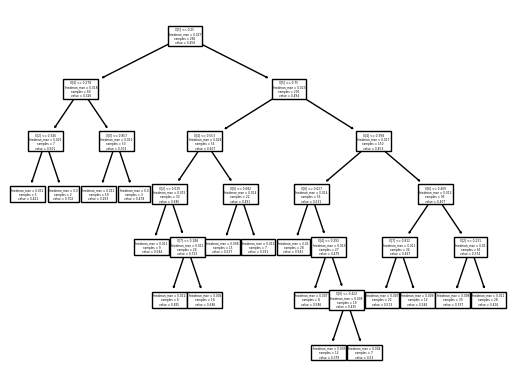

In [184]:
tree.plot_tree(model_decision);

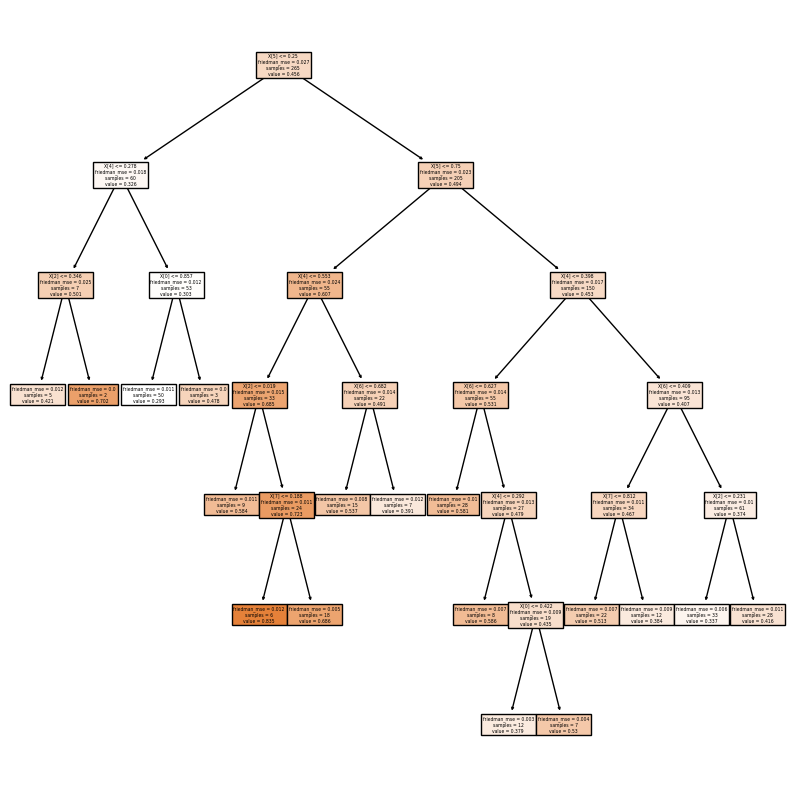

In [185]:
fig, axes = plt.subplots(figsize = (10,10))
tree.plot_tree(model_decision, filled=True )
plt.show()

## Adboost Regressor

In [186]:
model1=AdaBoostRegressor(base_estimator=RF_Final)
model1.fit(x_train,y_train)

AdaBoostRegressor(base_estimator=RandomForestRegressor(criterion='friedman_mse',
                                                       max_depth=9,
                                                       max_leaf_nodes=17,
                                                       n_estimators=50))

In [187]:
ada_pred = model1.predict(x_test)

In [188]:
r2_score(y_test,ada_pred)

0.7347094957499829

In [189]:
test_mse  = mean_squared_error(y_test,ada_pred)
test_mse

0.009049280886795427

In [190]:
test_rmse = np.sqrt(test_mse)
test_rmse

0.09512770830202642

In [191]:
results=cross_val_score(model1,X,y,cv=KFold())
print(results.mean())

0.7213074916670899


## BAGGING Regressor

In [192]:
model=BaggingRegressor(base_estimator=RF_Final)
model.fit (x_train,y_train)

BaggingRegressor(base_estimator=RandomForestRegressor(criterion='friedman_mse',
                                                      max_depth=9,
                                                      max_leaf_nodes=17,
                                                      n_estimators=50))

In [193]:
bagg_pred = model.predict(x_test)

In [194]:
r2_score(y_test,bagg_pred)

0.6093362327994284

In [195]:
test_mse  = mean_squared_error(y_test,bagg_pred)
test_mse

0.013325867699960853

In [196]:
test_rmse = np.sqrt(test_mse)
test_rmse

0.1154377221707049

In [197]:
results=cross_val_score(model,X,y,cv=KFold())
print(results.mean())

0.5962546803085006


## Stacking Ensemble

In [198]:
estimators = []

In [199]:
model_1 = LinearRegression()
estimators.append(('linear', model_1))

In [200]:
model_2 = DecisionTreeRegressor()
estimators.append(('dtree',model_2))

In [201]:
len(estimators)

2

In [202]:
ensemble = VotingRegressor(estimators)
ensemble.fit(x_train,y_train)

VotingRegressor(estimators=[('linear', LinearRegression()),
                            ('dtree', DecisionTreeRegressor())])

In [203]:
st_pred = ensemble.predict(x_test)

In [204]:
r2_score(y_test,st_pred)

0.637671362577355

In [205]:
test_mse  = mean_squared_error(y_test,st_pred)
test_mse

0.012359332734643704

In [206]:
test_rmse = np.sqrt(test_mse)
test_rmse

0.11117253588294054

In [207]:
results=cross_val_score(ensemble,X,y,cv=KFold())
print(results.mean())

0.6457443572107306
